# continguityScore

We have the data file giving the mean similarity (and counter similarity) for each atom in each protein in our dataset.

Here we try to extract the signal from the noise

In [12]:
import h5py
import quippy
import json
import numpy as np
import ase.io
import os
import collections 
import subprocess
import matplotlib.pyplot as plt

import scipy.spatial
import pandas as pd
import seaborn as sns

In [3]:
path_to_hdf5_file="./filtered/r10xi2sigma1/samples_filtered.xyz.hdf5"
dataFile = h5py.File(path_to_hdf5_file, "r")
labels = dataFile["labels"]["label_mat"].value

/home/wpg23/.local/miniconda3/envs/python2env/lib/python2.7/site-packages/h5py/_hl/dataset.py:313: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  "Use dataset[()] instead.", H5pyDeprecationWarning)


In [4]:
def generateAverageAndCounterSimilarityAnyHetATM(path_to_matrices, path_to_xyz_file, labels, index):
    # Ignore ligandid, look at the distance to any binder
    n_most_common = 10
    similarities = dict()
    label = labels[index][1]
    print(label)
    hemes = []
    nucleos = []
    heme_indices = []
    nucleo_indices = []

    for i, tag in enumerate(labels):
        # The similarity between each atom of the test protein and the target protein
        atomic_similarity = np.load("{0}/{1}_{2}_kernsandperms.npy".format(path_to_matrices,index,i))
        indices = np.argsort(atomic_similarity)
        tag = tag[1]
        if "heme" in tag:
            hemes.append(atomic_similarity)
            heme_indices.append(indices)
        else:
            nucleos.append(atomic_similarity)
            nucleo_indices.append(indices)

    hemes = np.asarray(hemes)
    nucleos = np.asarray(nucleos)
    heme_means = np.mean(hemes, axis=0)
    nucleo_means = np.mean(nucleos, axis=0)

    # scale to 1, as otherwise the b-factors round out
    heme_means /= heme_means.max()
    nucleo_means /= nucleo_means.max()

    atom_reader = quippy.AtomsReader(path_to_xyz_file, format="xyz")
    # Crude, but quick enough for now
    for temp_protein in atom_reader:
        if temp_protein.params["tag"] == label:
            protein = temp_protein
            break
    else:
        print("Protein not found!")
        raise ValueError

    # Check that the arrays are the correct length, and referencing the correct protein
    assert protein.params["tag"] == label
    assert len(heme_means) == len(protein.arrays["positions"])
    assert len(nucleo_means) == len(protein.arrays["positions"])


    counter = collections.Counter()
    for row in heme_indices:
        counter.update(row[-n_most_common:])

    heme_counts = np.zeros(len(protein.arrays["positions"]))
    for index, count in counter.most_common():
        heme_counts[index] = count

    counter = collections.Counter()
    for row in nucleo_indices:
        counter.update(row[-n_most_common:])

    nucleo_counts = np.zeros(len(protein.arrays["positions"]))
    for index, count in counter.most_common():
        nucleo_counts[index] = count


    assert len(nucleo_counts) == len(nucleo_means)
    assert len(heme_counts) == len(heme_means)

    # We have the count-based and average-based similarity scores.
    # Now we need to obtain each atom's distance from the ligand.

    # Read the positions for the test protein 
    atomic_positions = protein.arrays["positions"]

    # Get the ligand atoms (these aren't in the xyz file, as they're stripped in preprocessing)
    # labels take the form PDBREFCHAINREF_heme or PDBREFCHAINREF_nucleo
    pdb_ref = label[:4]
    chain_ref = label[4]
    protein_type = label[6:]
    if not os.path.exists("{}.pdb".format(pdb_ref)):
        subprocess.call(["wget","http://www.rcsb.org/pdb/files/{}.pdb".format(pdb_ref)])
    try:
        with open("{}.pdb".format(pdb_ref)) as flines:
            pdb_data = flines.readlines()
    except IOError:
        print("IO Error")

    ligand_data = []
    for line in pdb_data:
        if line.startswith("HETATM"):
            if line[17:20].strip() != "HOH" and line[21] == chain_ref:
                ligand_data.append(line.strip())

    if not ligand_data:
        print("No ligand found")

    with open("temp.pdb", "w") as outflines:
        outflines.write("\n".join(ligand_data))
    ligand = ase.io.read("temp.pdb", format="proteindatabank")

    subprocess.call(["rm", "{}.pdb".format(pdb_ref)])
    subprocess.call(["rm", "temp.pdb"])    


    ligand_centroid = np.mean(ligand.arrays["positions"], axis=0)
    distance_from_centroid = np.linalg.norm(atomic_positions-ligand_centroid,axis=1)
#     plt.scatter(distance_from_centroid, bfactors)
#     plt.title("Distance from centroid")
# #     plt.ylim([1.0,1.2])
#     plt.show()

    # get the distance to the nearest ligand atom instead
    distance_from_nearest_ligand_atom = []
    for position in atomic_positions:
        distance_to_ligand = np.min(np.linalg.norm(position-ligand.arrays["positions"],axis=1))
        distance_from_nearest_ligand_atom.append(distance_to_ligand)
#     plt.title("Distance to closest atom")
# #     plt.ylim([1.0,1.2])
#     plt.scatter(distance_from_nearest_ligand_atom, bfactors)
#     plt.show()
    output_dict = {"heme_means": list(heme_means),
                  "nucleo_means": list(nucleo_means),
                  "nucleo_counts": list(nucleo_counts),
                  "heme_counts": list(heme_counts),
                  "distance_from_nearest_ligand_atom": list(distance_from_nearest_ligand_atom),
                  "distance_from_centroid": list(distance_from_centroid)}
    return output_dict

In [25]:
output_dict = generateAverageAndCounterSimilarityAnyHetATM("./filtered/r10xi2sigma1/basematrices",
                                                  "./filtered/r10xi2sigma1/samples_filtered.xyz",
                                                  labels, 0)

heme_means = output_dict["heme_means"]
nucleo_means = output_dict["nucleo_means"]
heme_counts = output_dict["heme_counts"]
nucleo_counts = output_dict["nucleo_counts"]
distance_from_nearest_ligand_atom = output_dict["distance_from_nearest_ligand_atom"]

4n4oA_heme


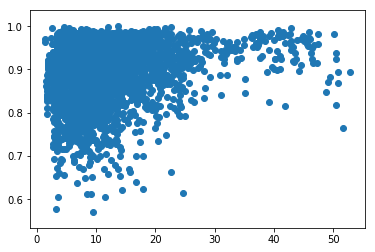

In [28]:
plt.scatter(distance_from_nearest_ligand_atom, heme_means)

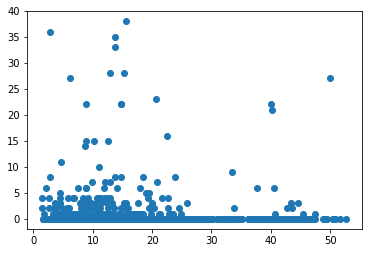

In [29]:
plt.scatter(distance_from_nearest_ligand_atom, heme_counts)

In [35]:
%matplotlib inline

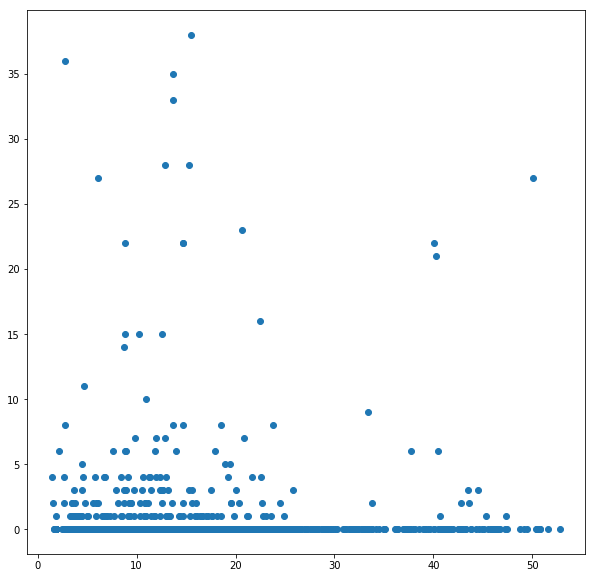

In [36]:
fig, ax = plt.subplots(figsize=(10,10))

plt.scatter(distance_from_nearest_ligand_atom, heme_counts)

4n4oA_heme


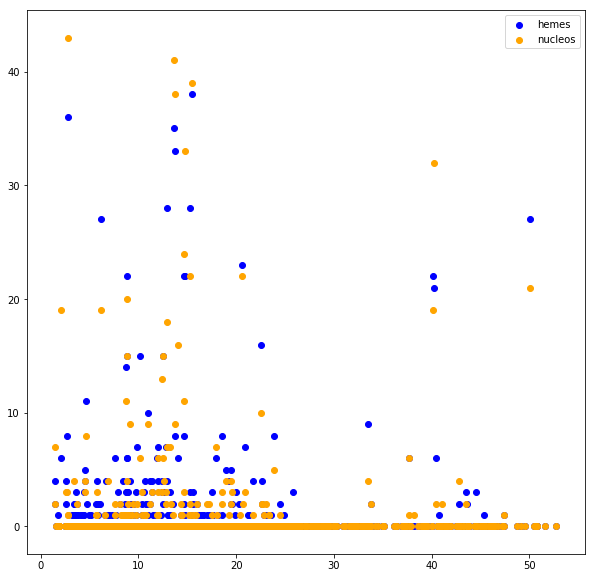

1x9fB_heme


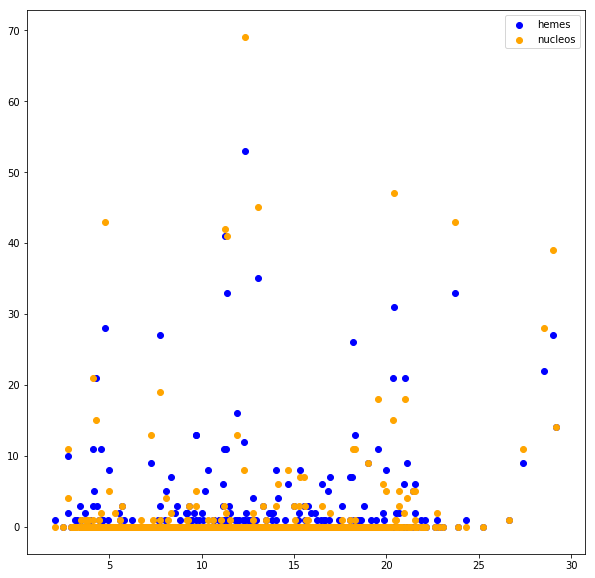

2bz9A_heme


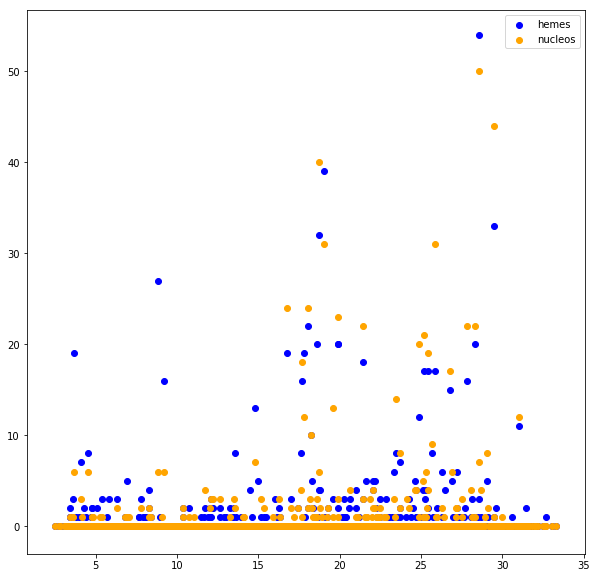

1cxyA_heme


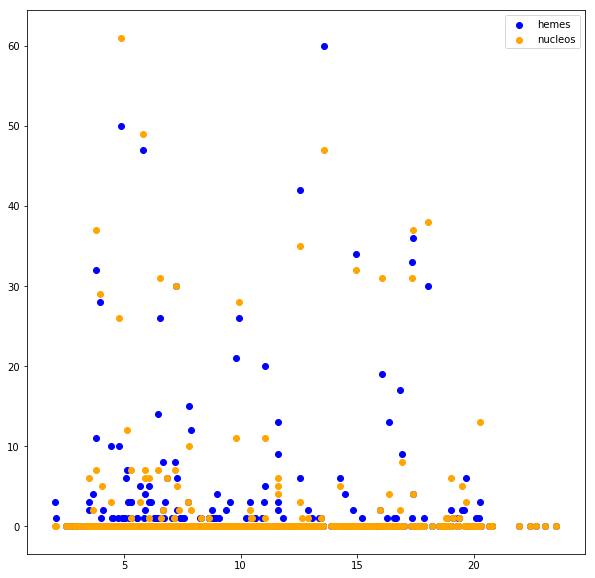

1hlmA_heme


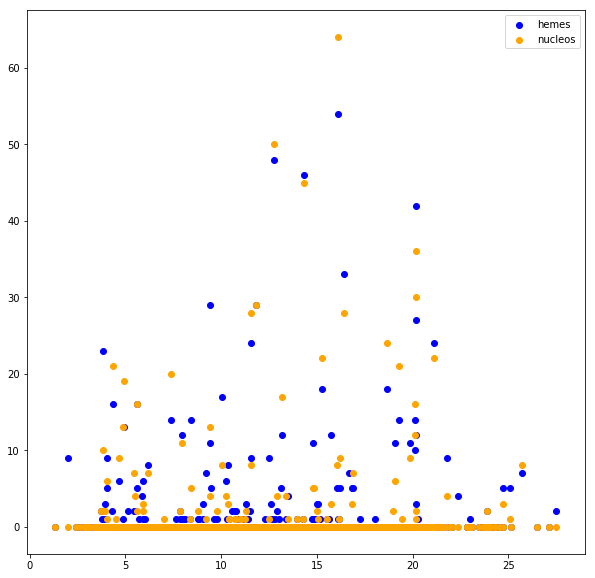

1etpA_heme


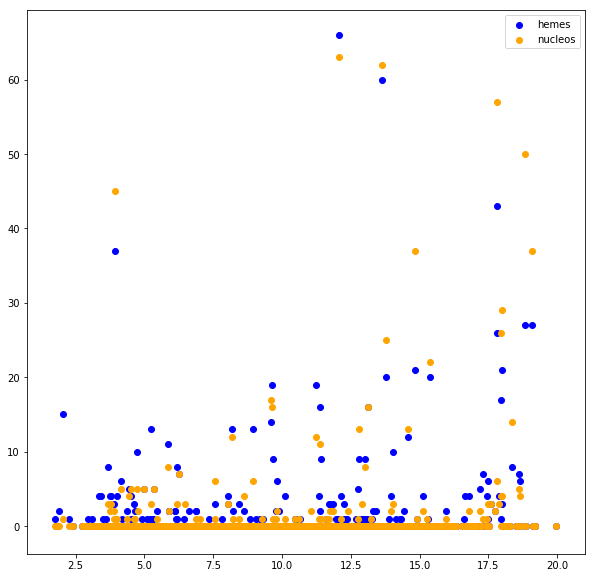

4gu7A_heme


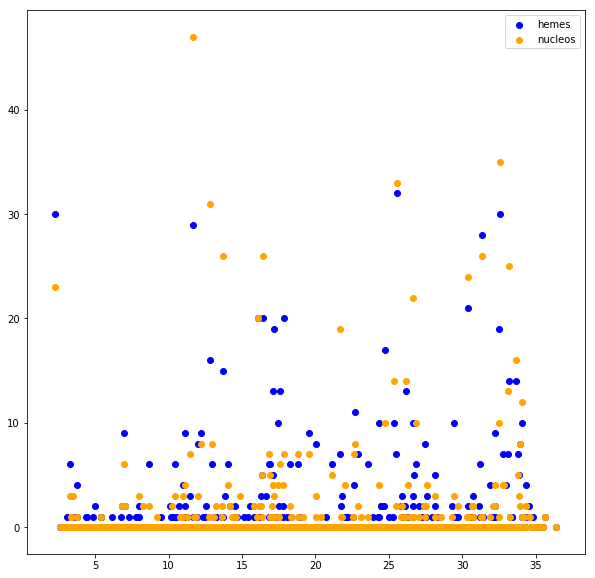

3rwlA_heme


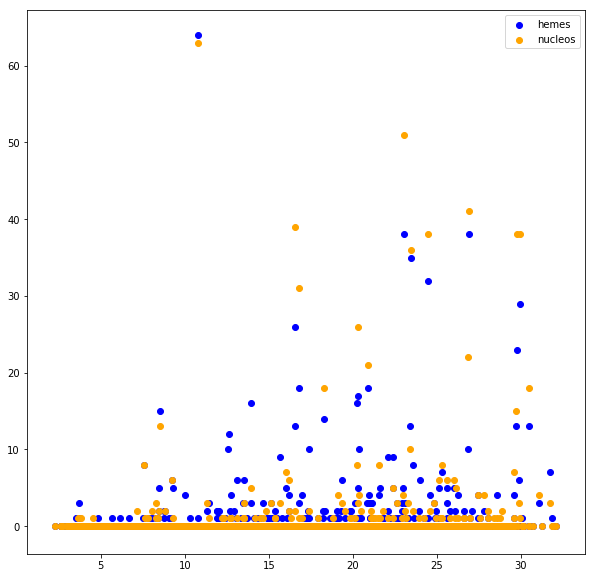

2czsA_heme


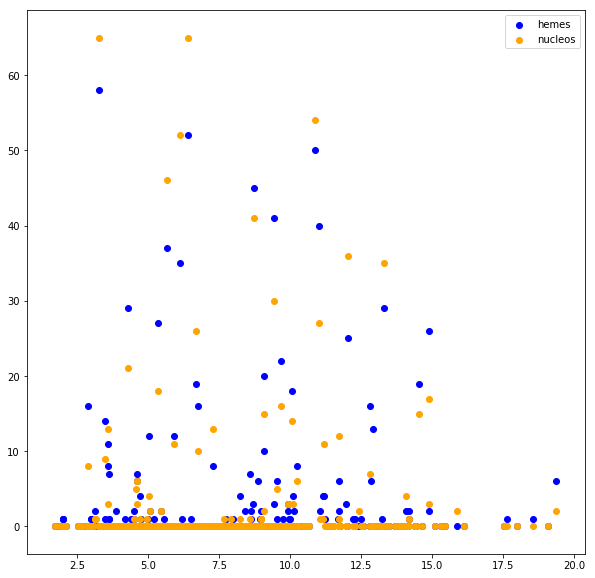

4jouA_heme


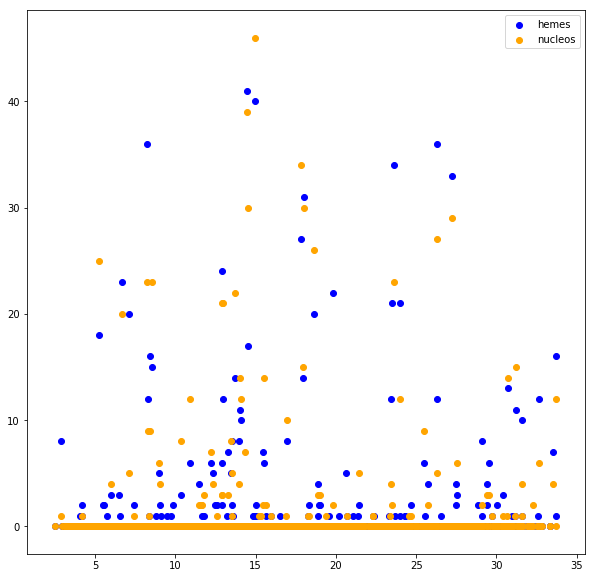

4xe3A_heme


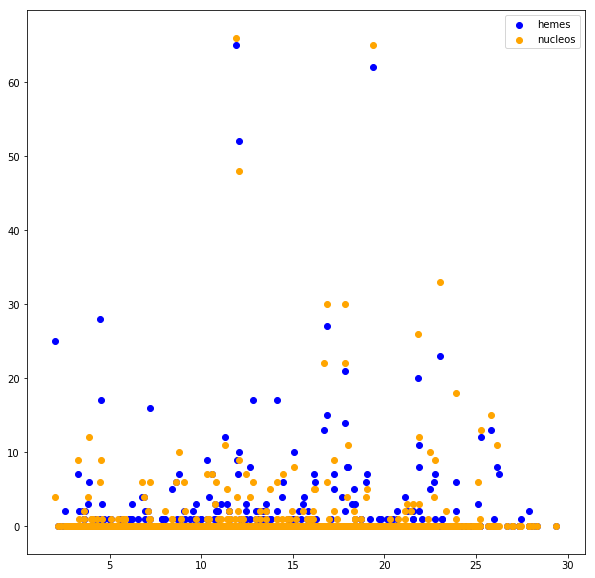

1ccrA_heme


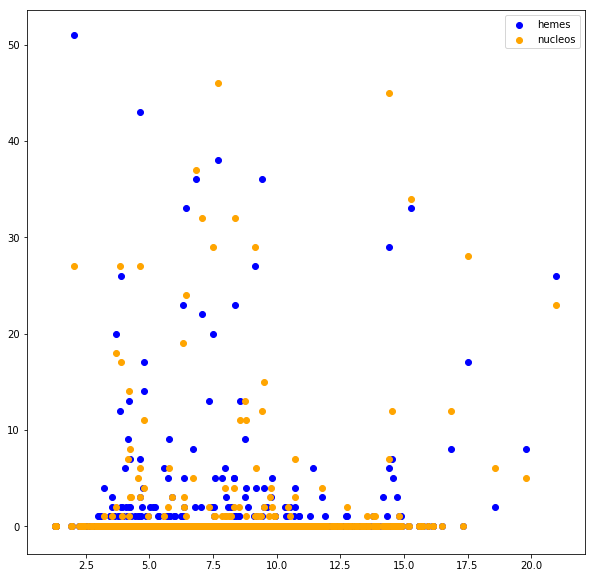

1ithA_heme


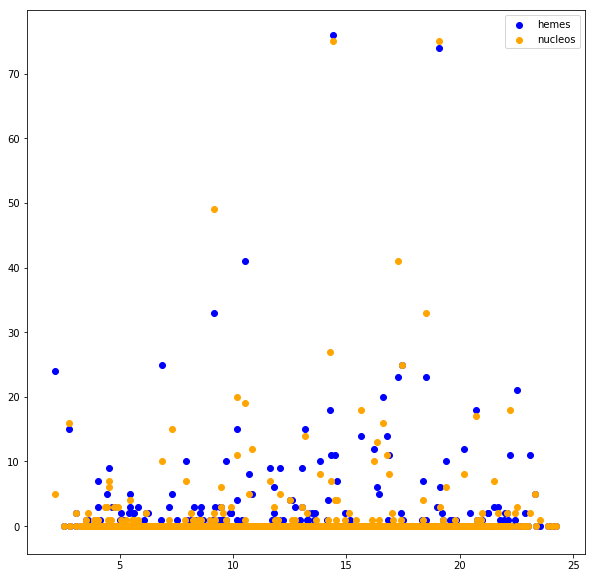

1gdiA_heme


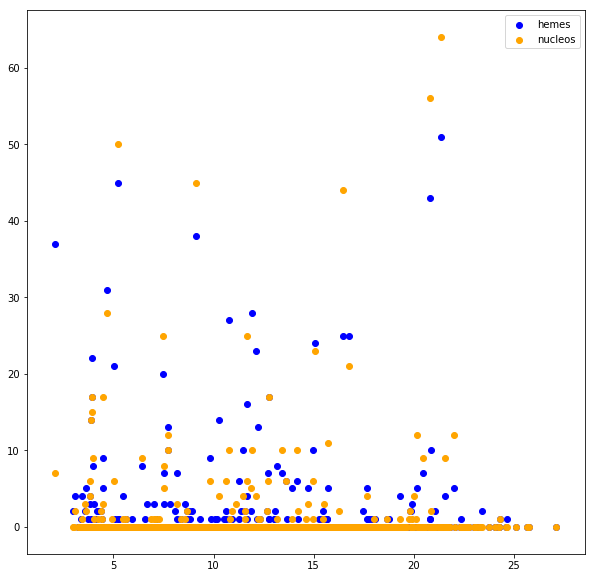

2flqB_heme


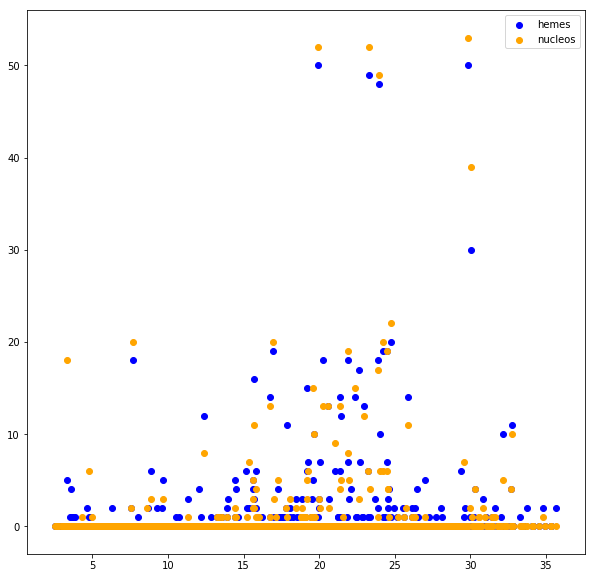

2d09A_heme


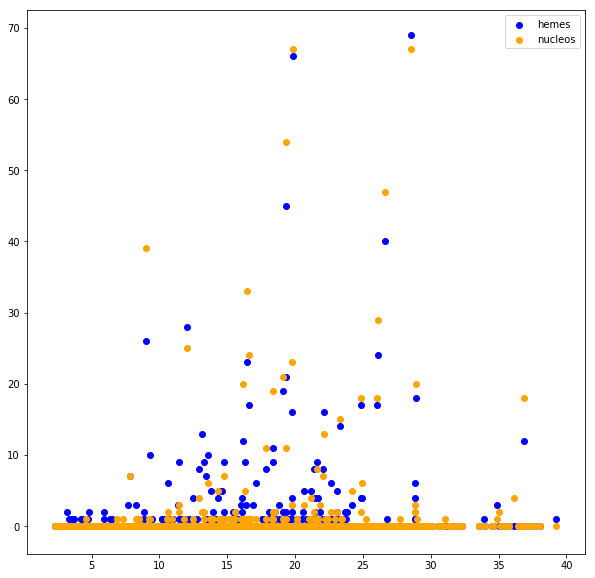

1cxaA_heme


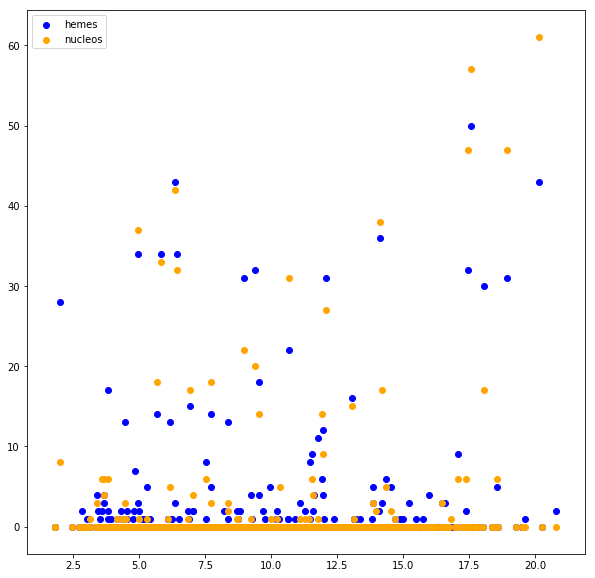

1gksA_heme


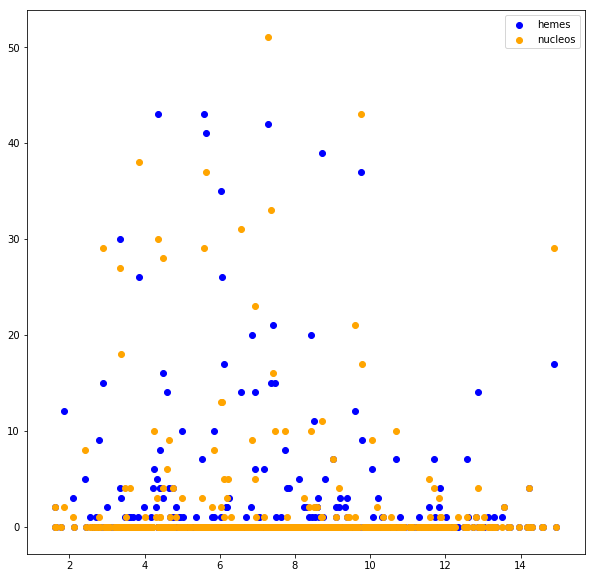

2v7iA_heme


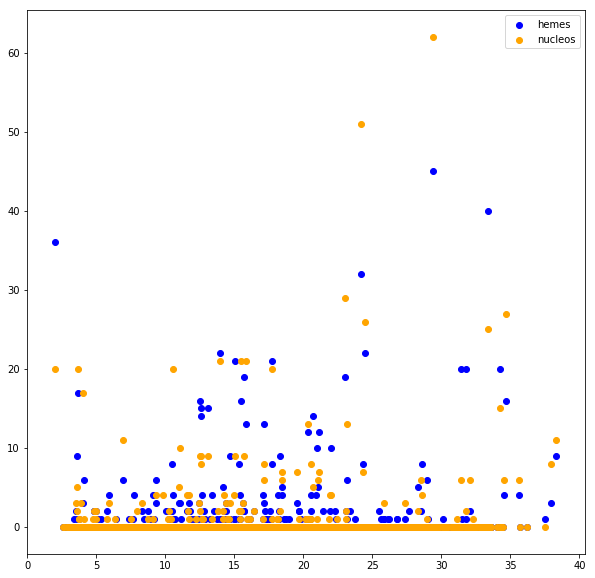

1ix3A_heme


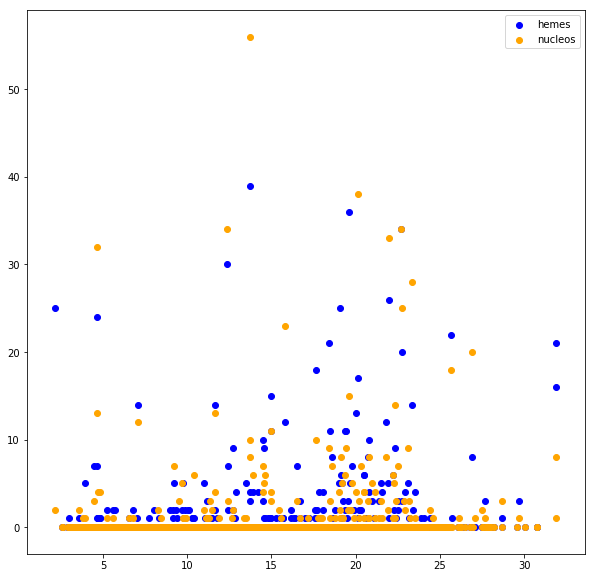

4n4jA_heme


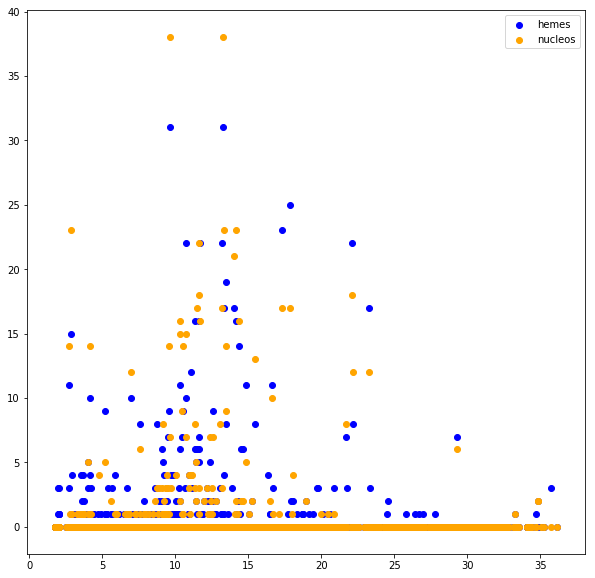

1ecaA_heme


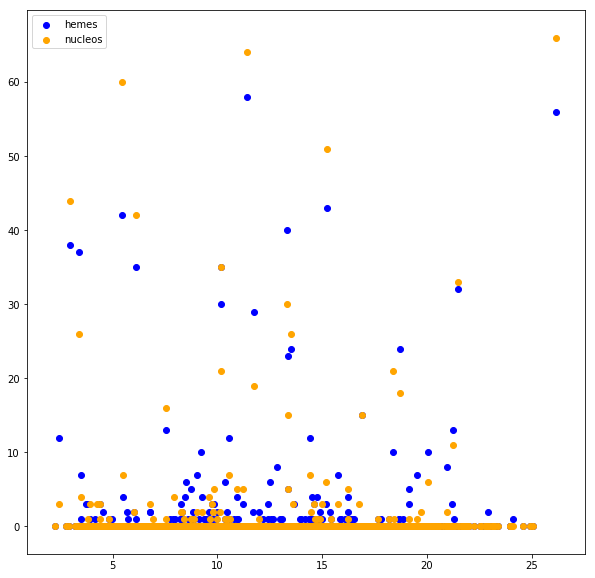

2r1hB_heme


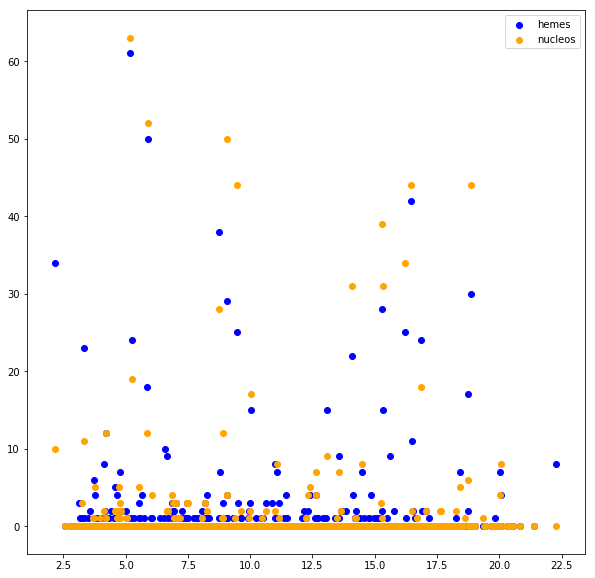

1f1cA_heme


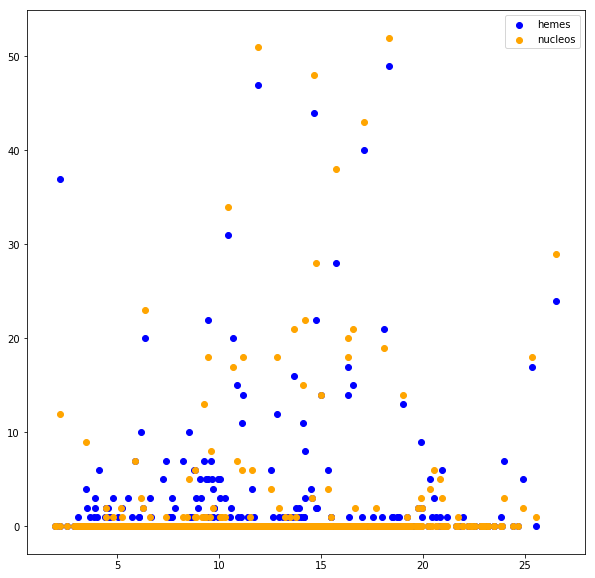

3tf8B_heme


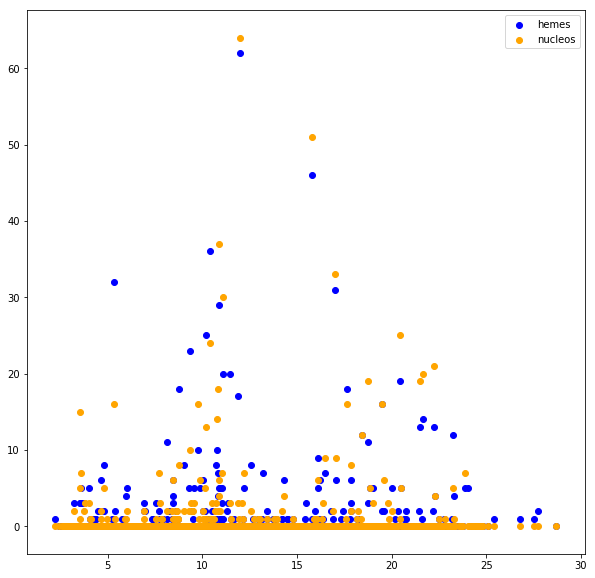

1jebA_heme


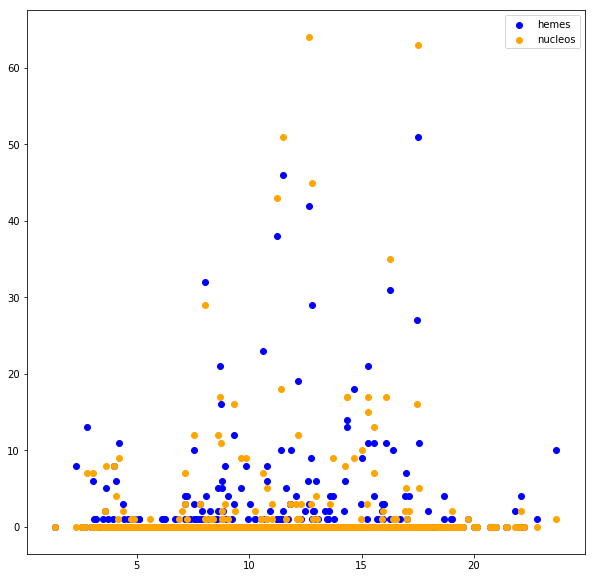

1co6A_heme


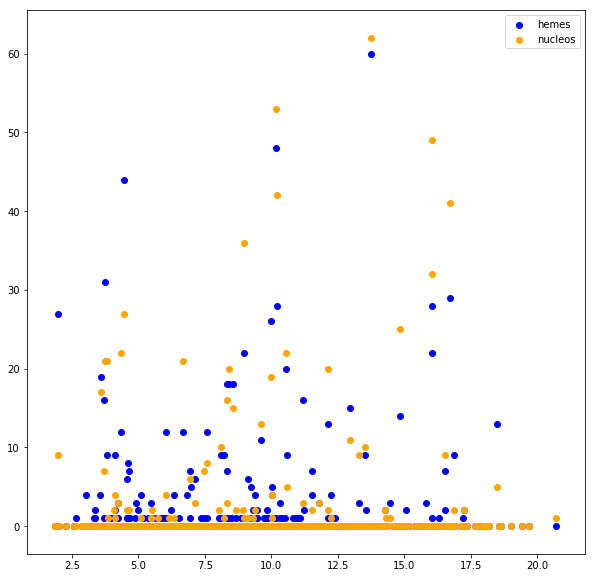

1ashA_heme


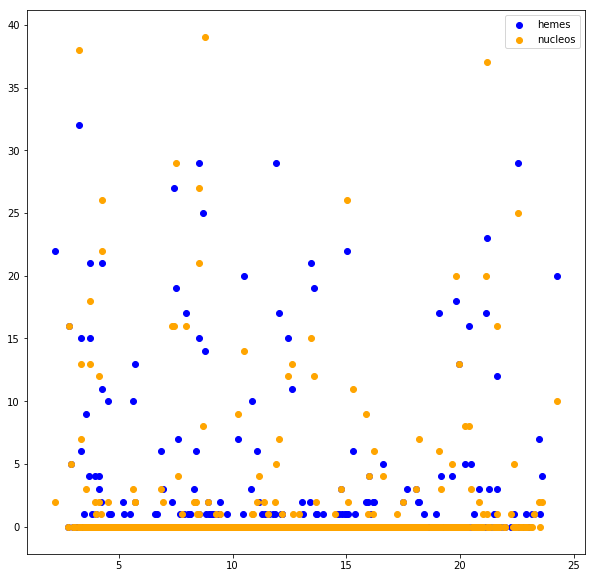

1it2A_heme


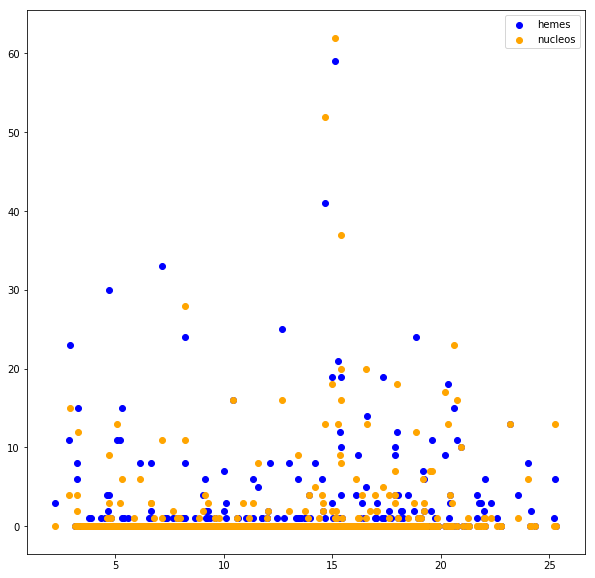

4i91A_heme


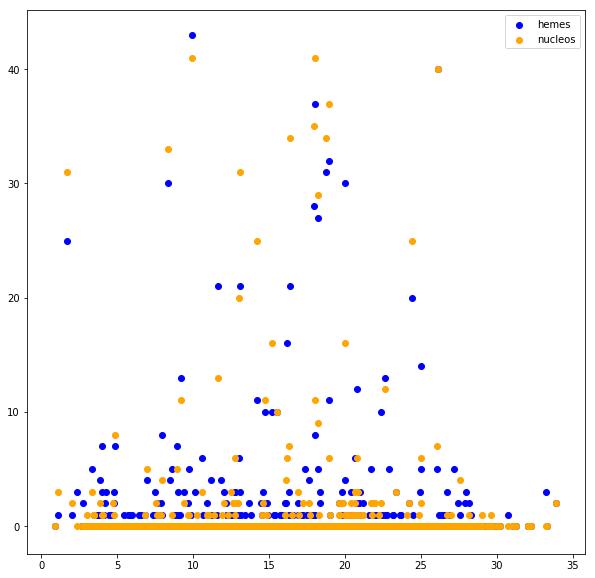

4oqrA_heme


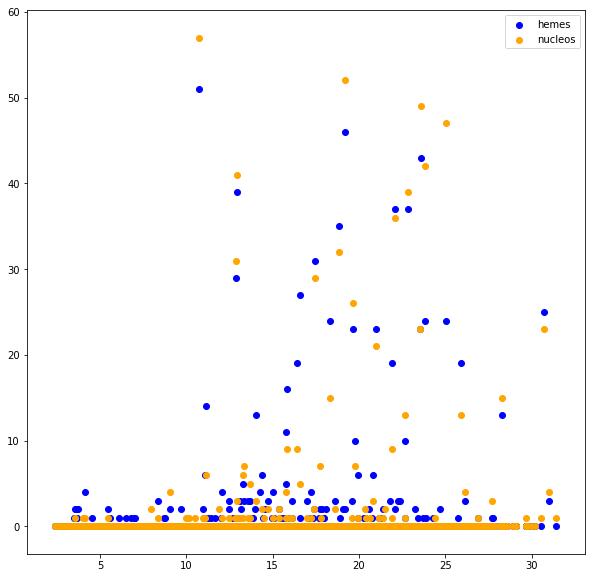

1ebtA_heme


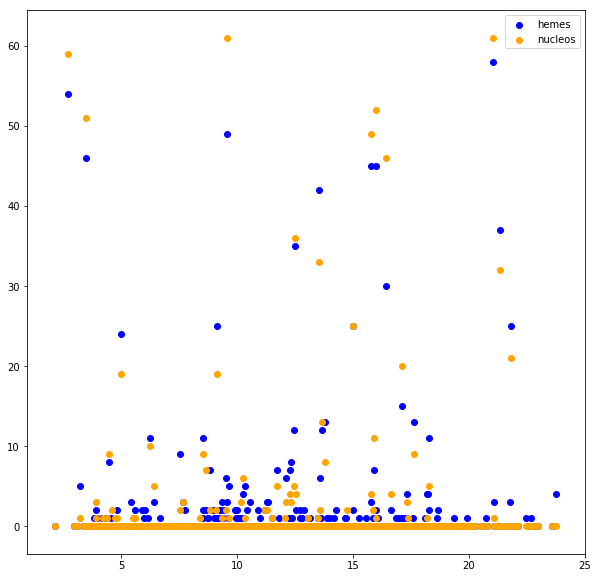

4uiiA_heme


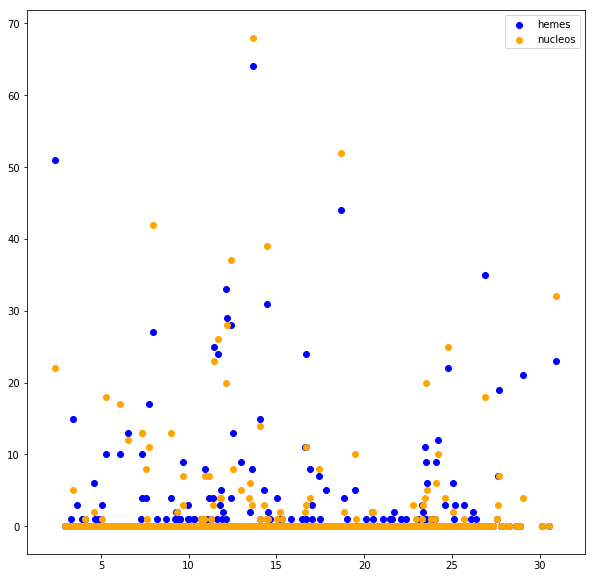

3nn2B_heme


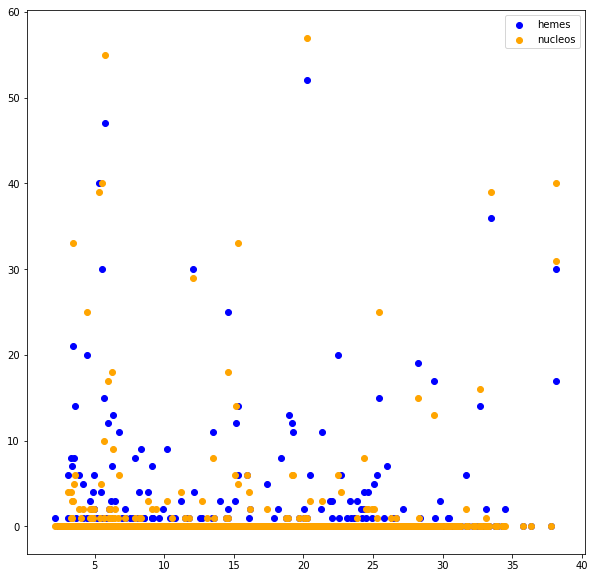

1schB_heme


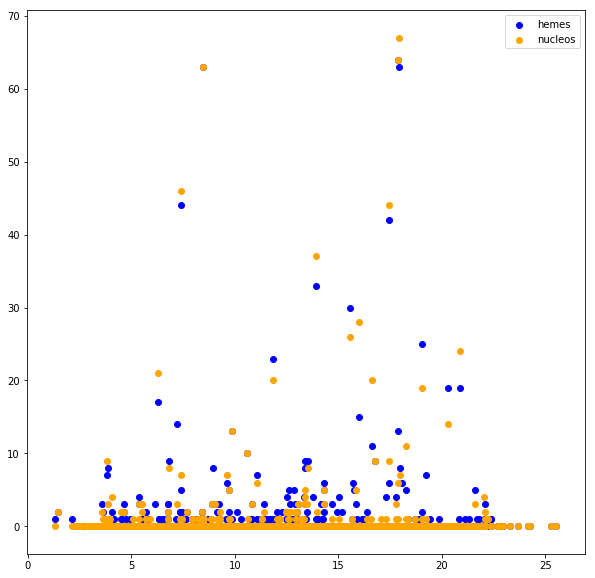

3b42A_heme


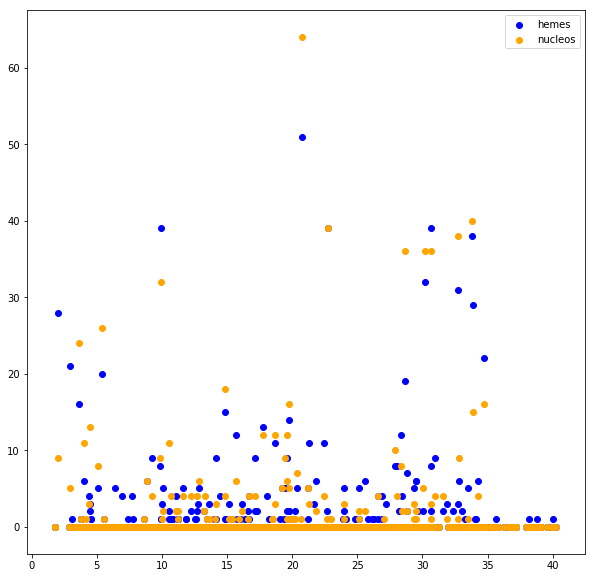

1prhA_heme


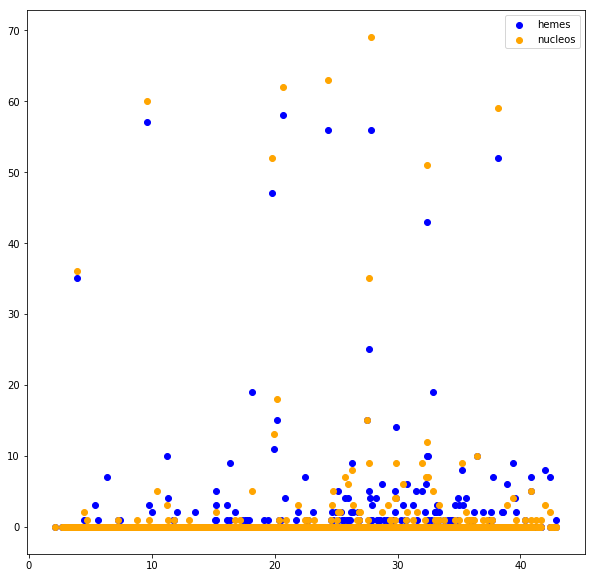

1yhuC_heme


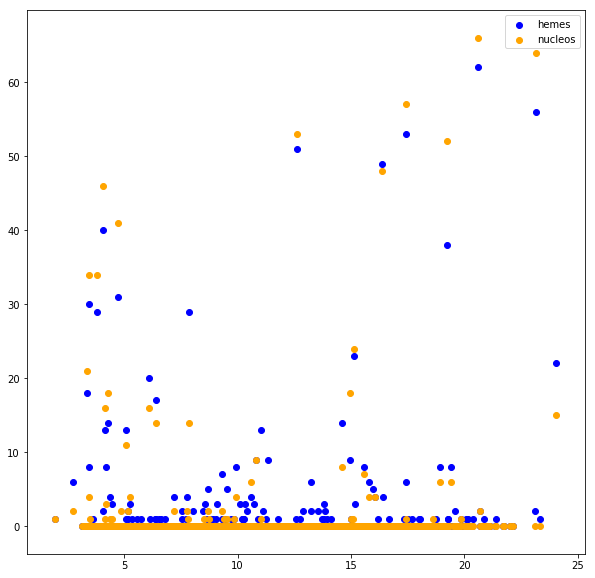

1hroA_heme


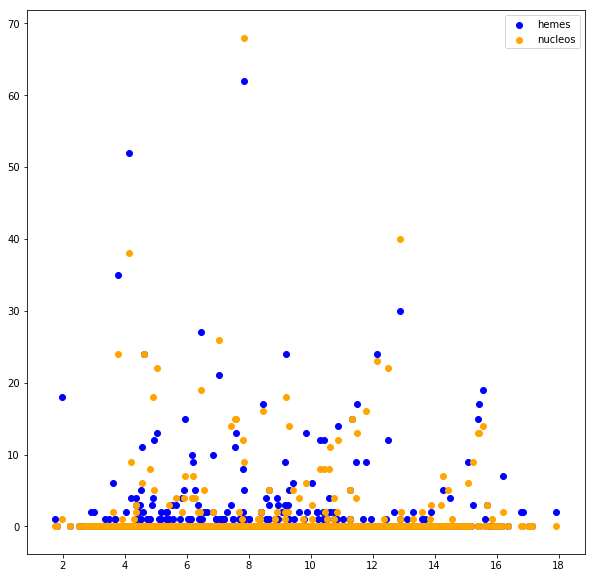

1yeaA_heme


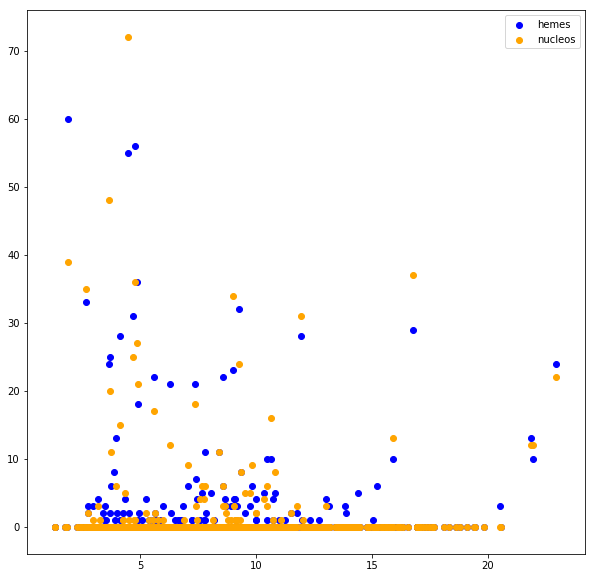

3qjtA_heme


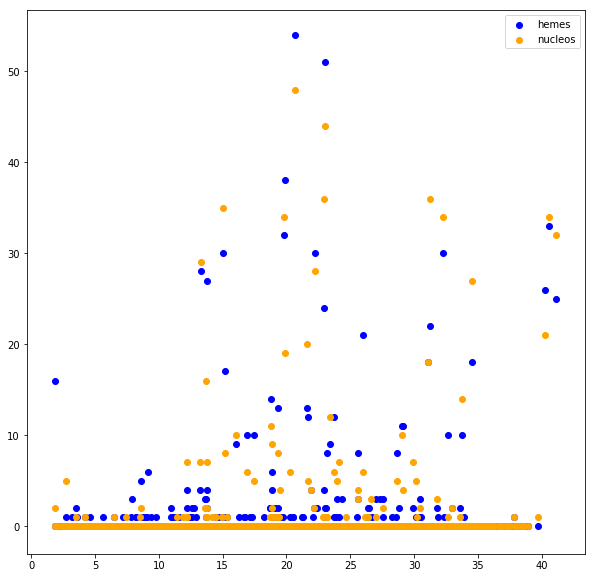

1dvhA_heme


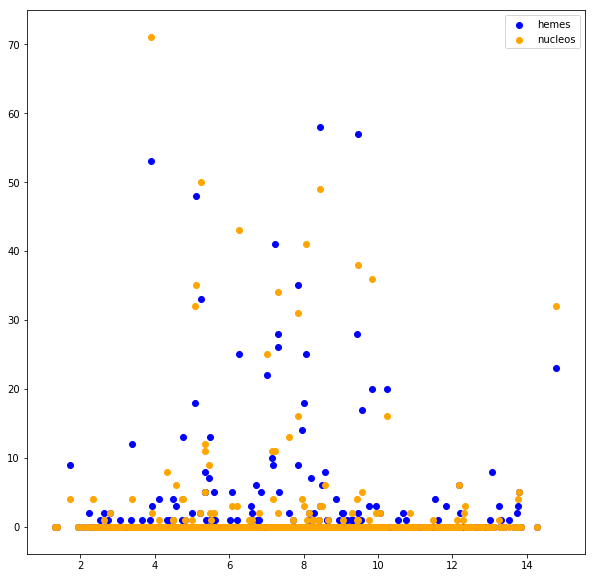

1s56B_heme


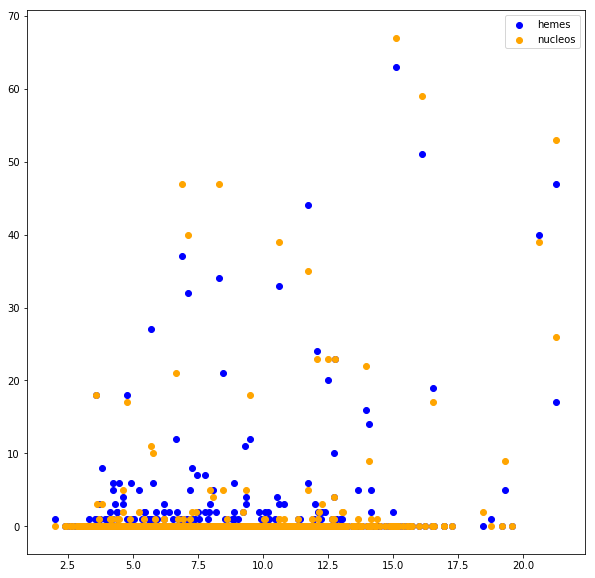

3zhwA_heme


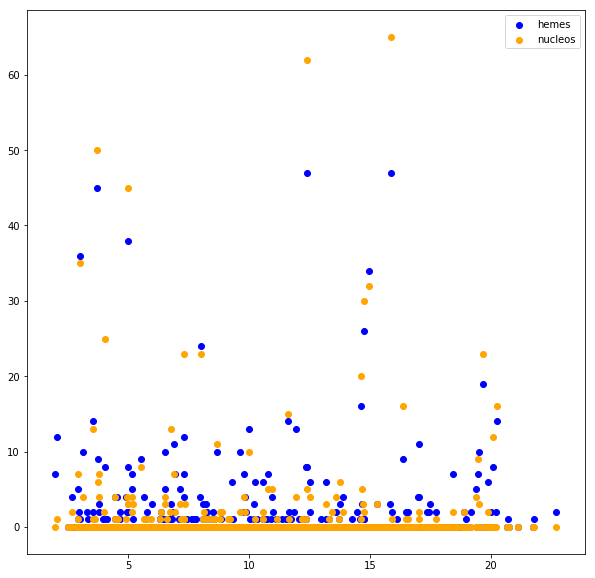

2r79A_heme


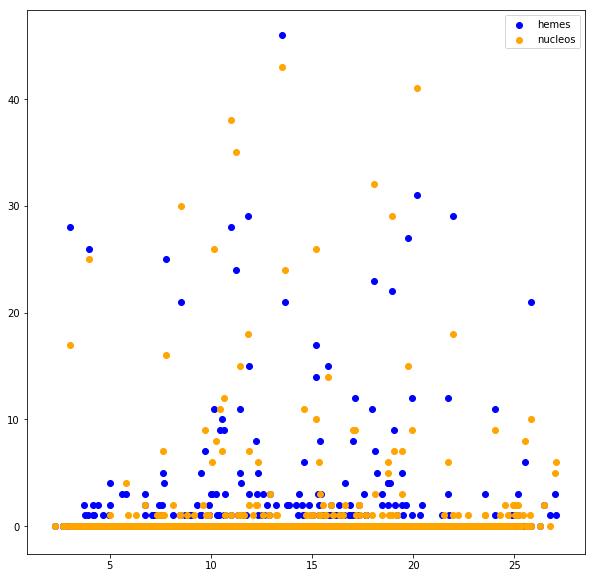

1ew6A_heme


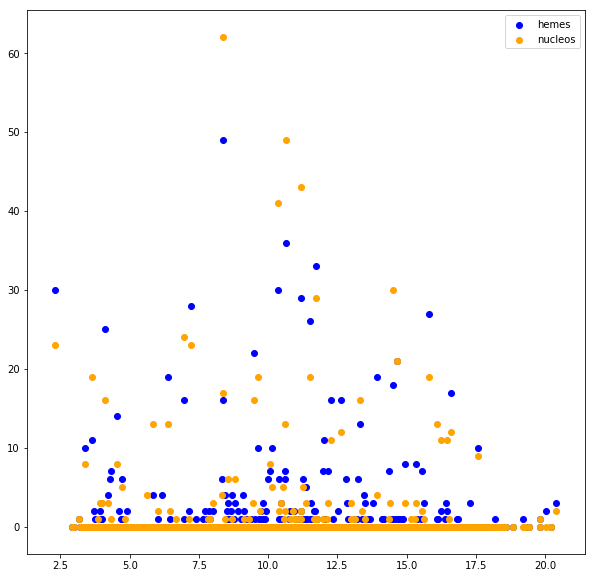

5fygA_heme


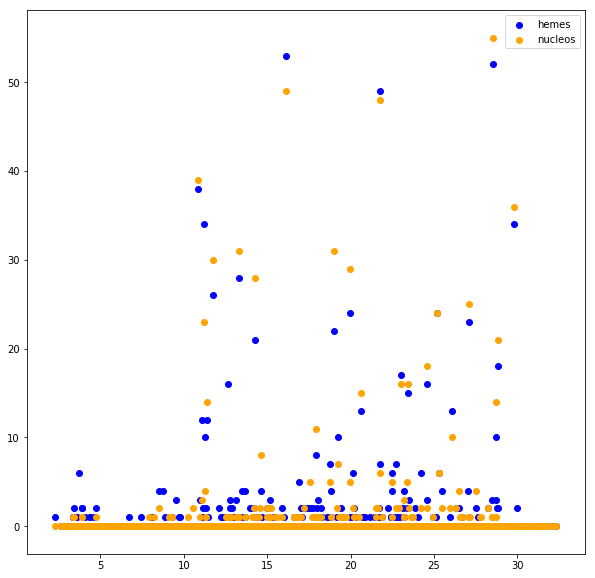

1hbgA_heme


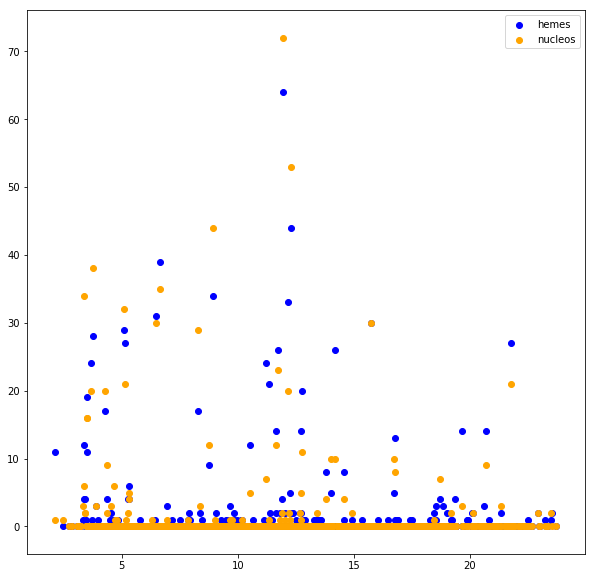

3bxuB_heme


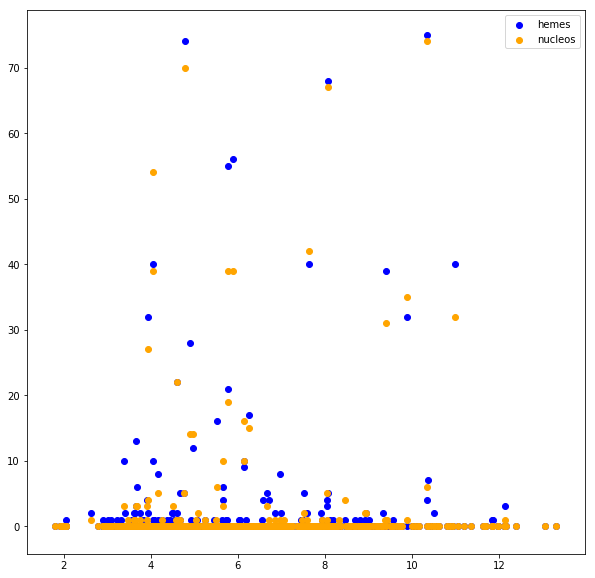

3czhA_heme


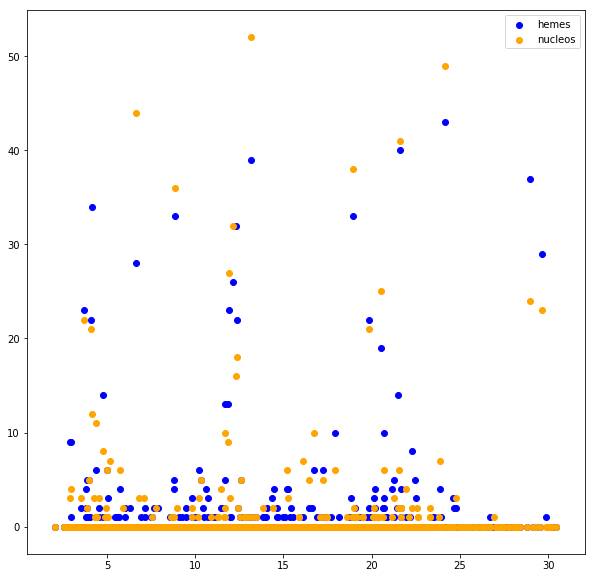

In [49]:
for i in range(50):
    output_dict = generateAverageAndCounterSimilarityAnyHetATM("./filtered/r10xi2sigma1/basematrices",
                                                      "./filtered/r10xi2sigma1/samples_filtered.xyz",
                                                      labels, i)

    heme_means = output_dict["heme_means"]
    nucleo_means = output_dict["nucleo_means"]
    heme_counts = output_dict["heme_counts"]
    nucleo_counts = output_dict["nucleo_counts"]
    distance_from_nearest_ligand_atom = output_dict["distance_from_nearest_ligand_atom"]
    fig, ax = plt.subplots(figsize=(10,10))
    plt.scatter(distance_from_nearest_ligand_atom, heme_counts, c="blue", label="hemes")
    plt.scatter(distance_from_nearest_ligand_atom, nucleo_counts, c="orange", label="nucleos")
    plt.legend()
    plt.show()

4n4oA_heme


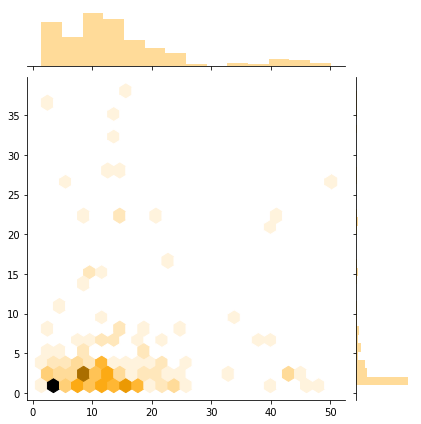

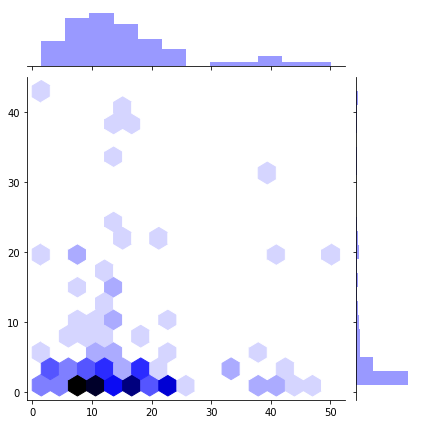

1x9fB_heme


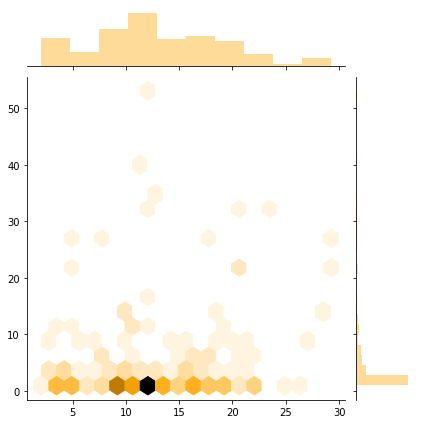

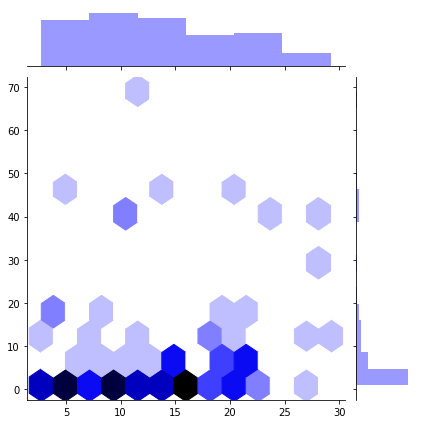

2bz9A_heme


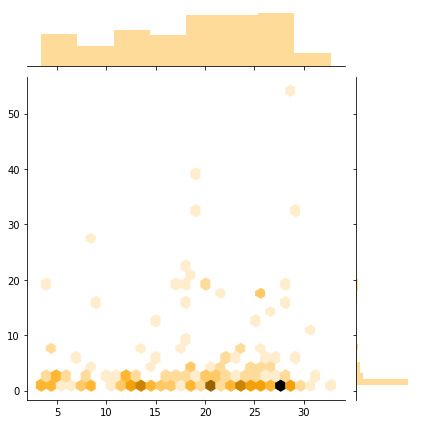

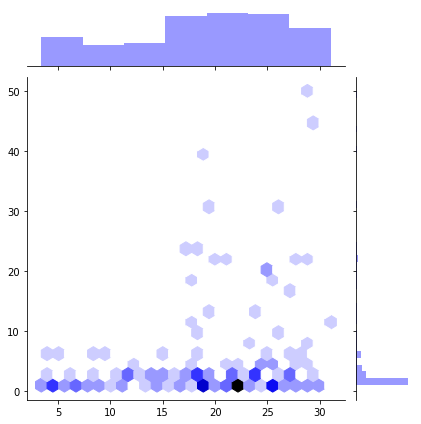

1cxyA_heme


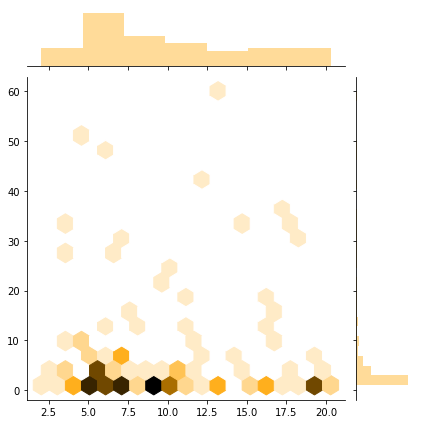

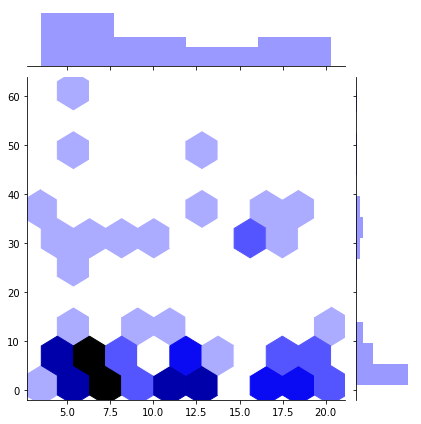

1hlmA_heme


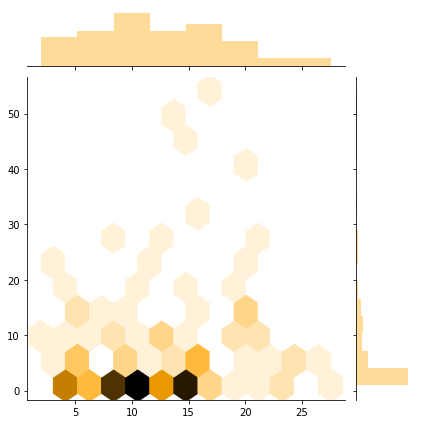

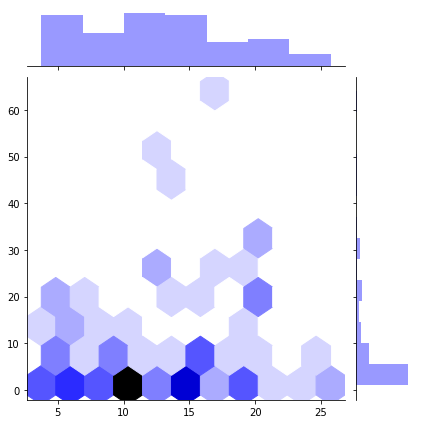

1etpA_heme


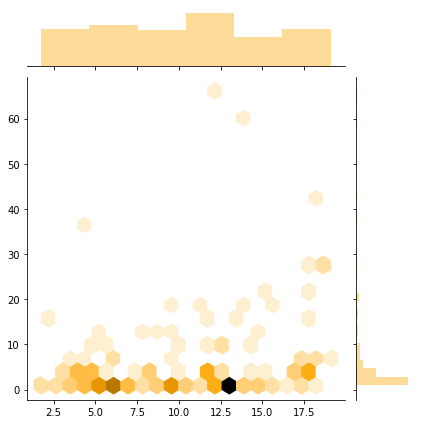

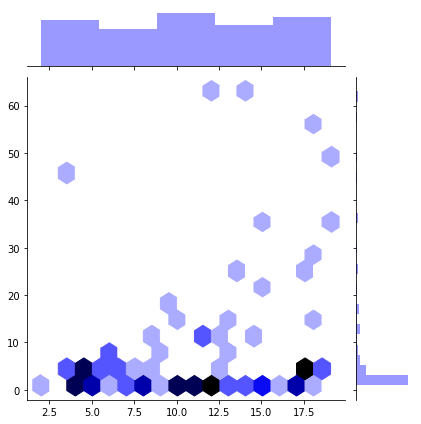

4gu7A_heme


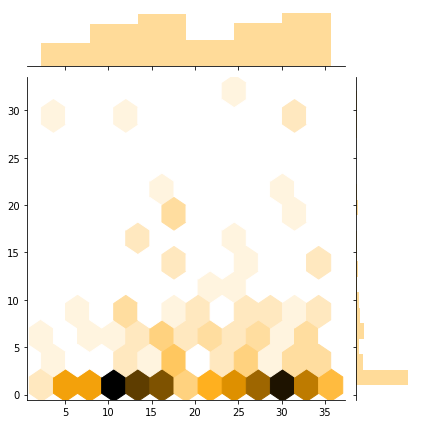

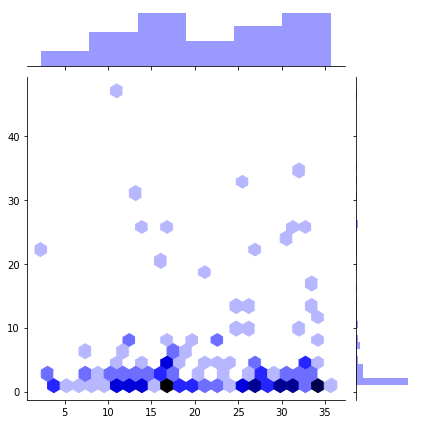

3rwlA_heme


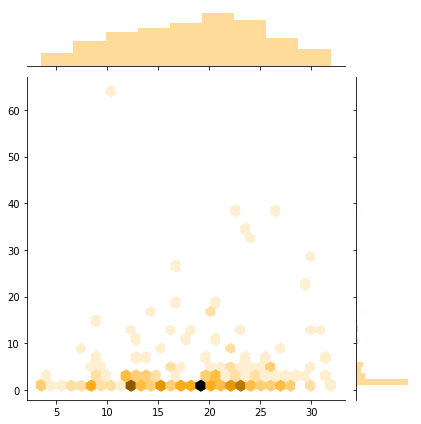

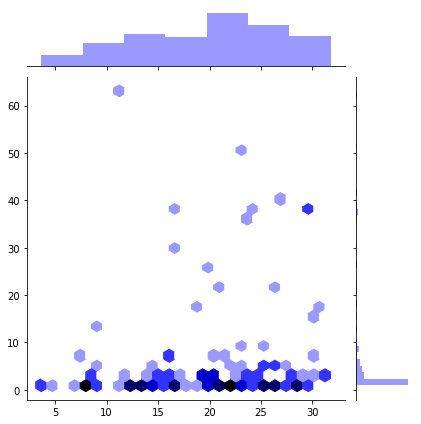

2czsA_heme


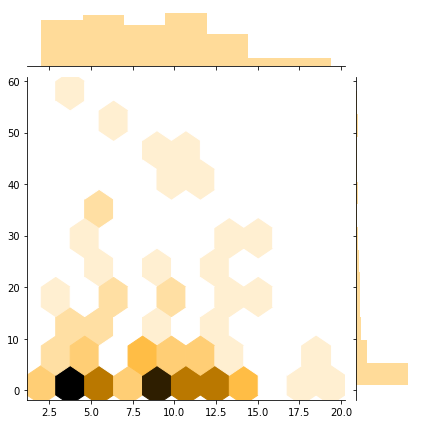

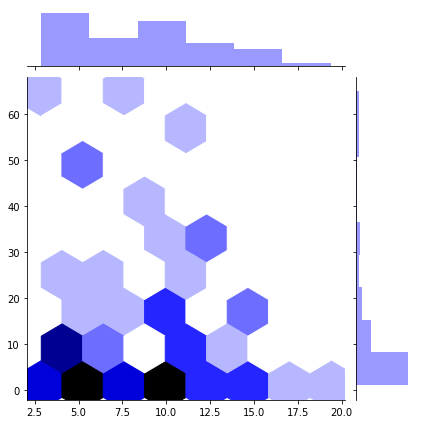

4jouA_heme


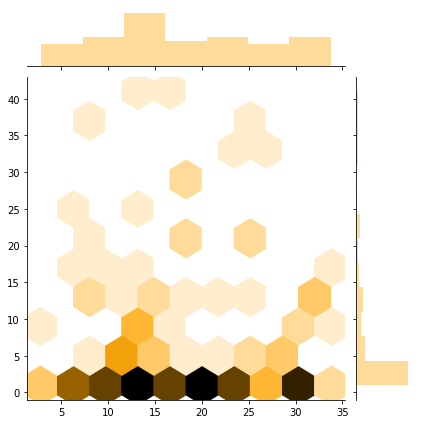

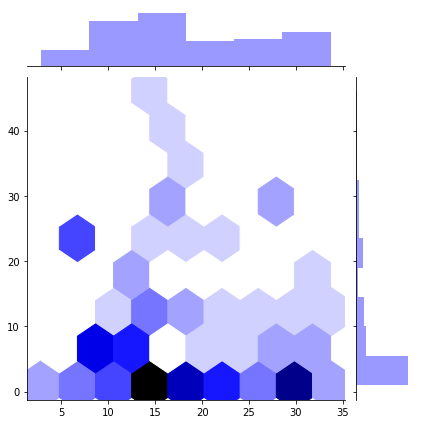

4xe3A_heme


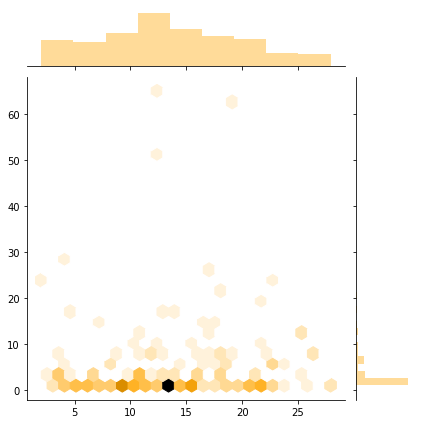

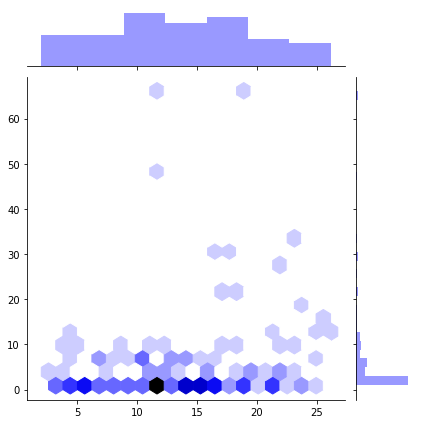

1ccrA_heme


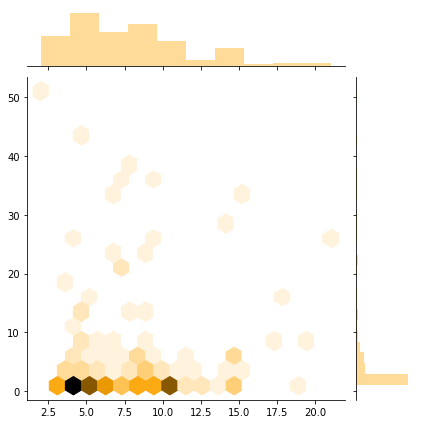

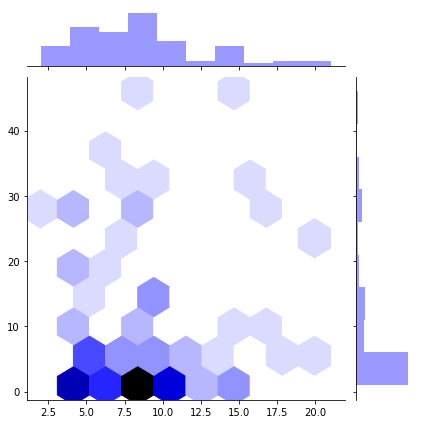

1ithA_heme


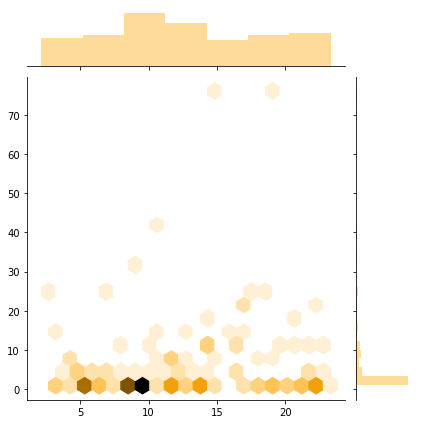

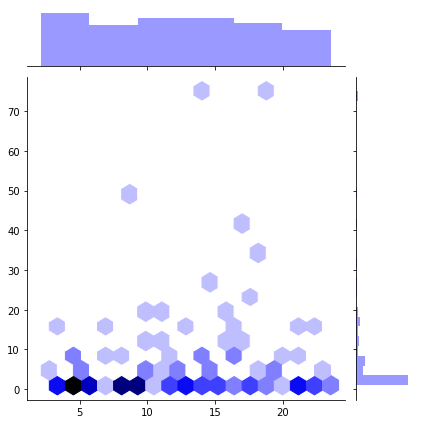

1gdiA_heme


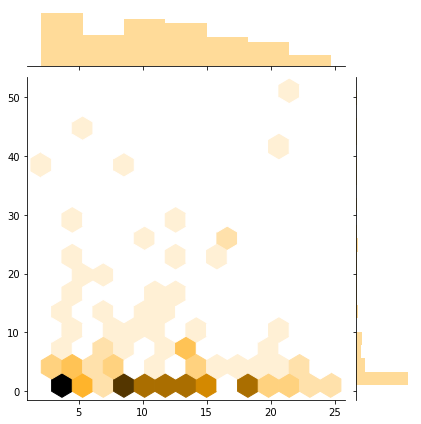

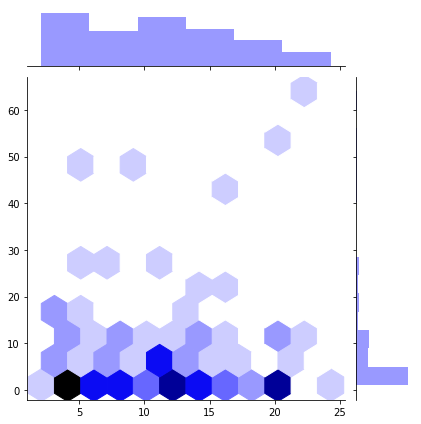

2flqB_heme


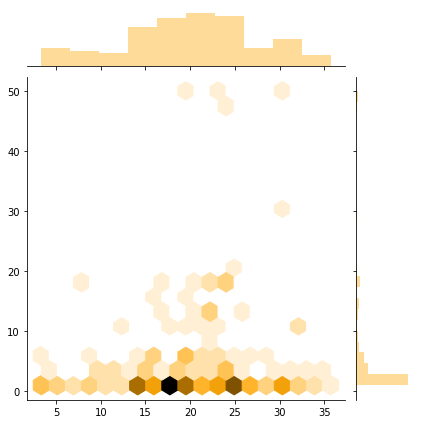

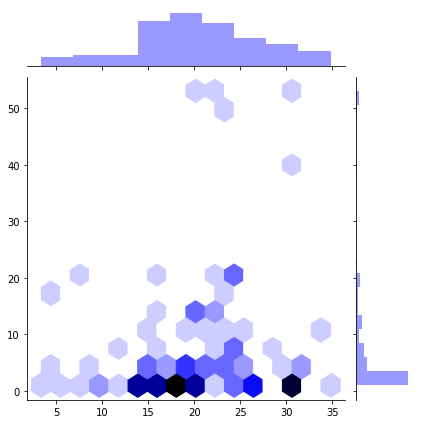

2d09A_heme


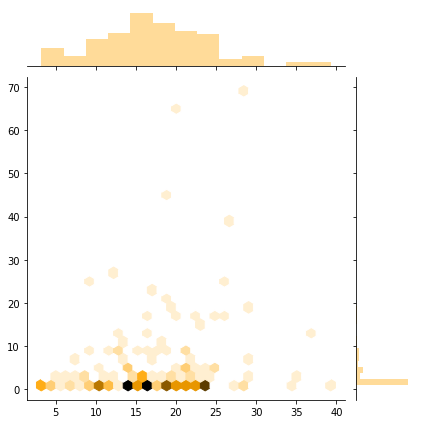

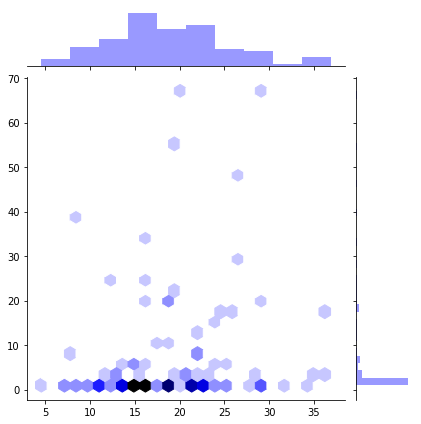

1cxaA_heme


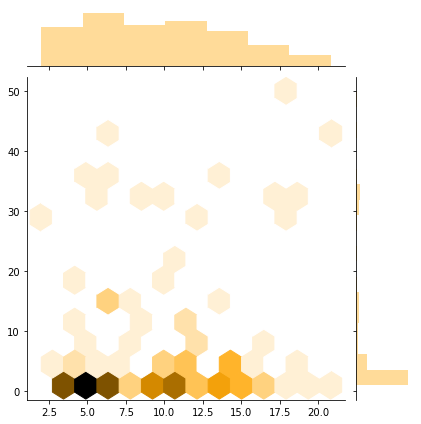

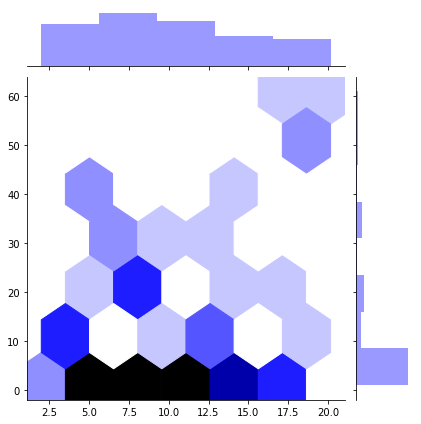

1gksA_heme


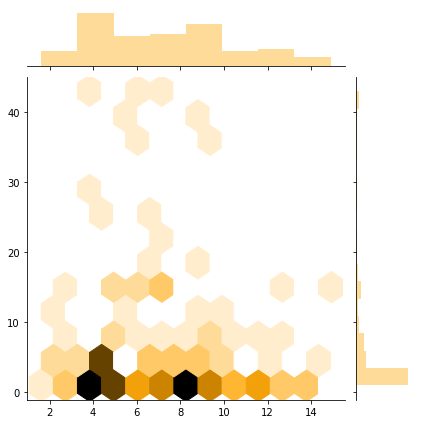

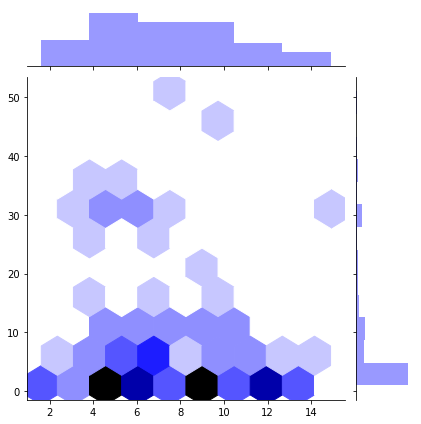

2v7iA_heme


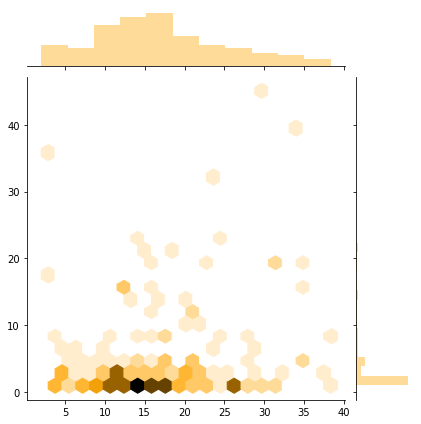

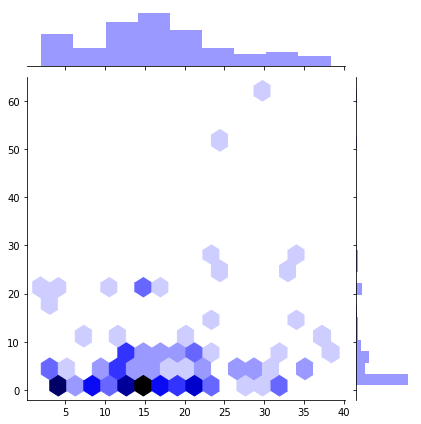

1ix3A_heme


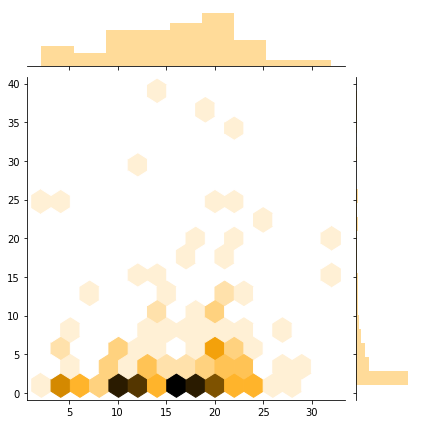

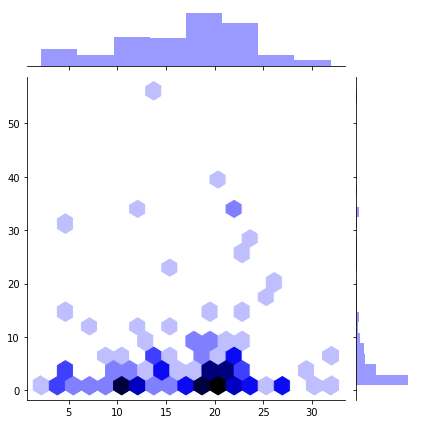

4n4jA_heme


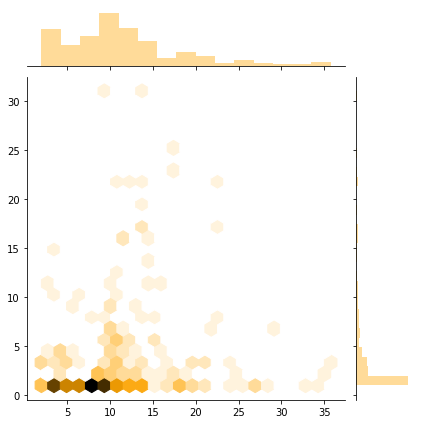

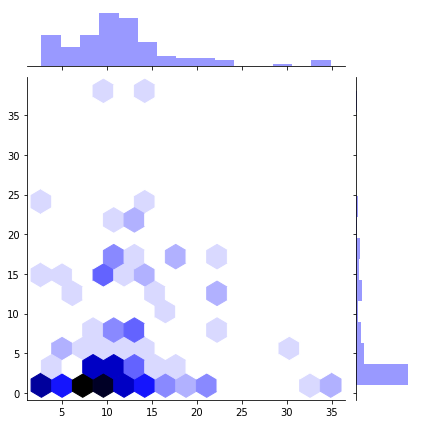

1ecaA_heme


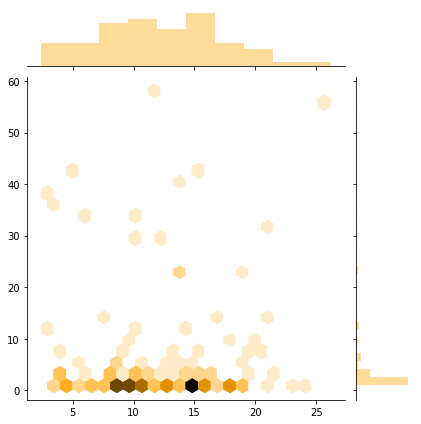

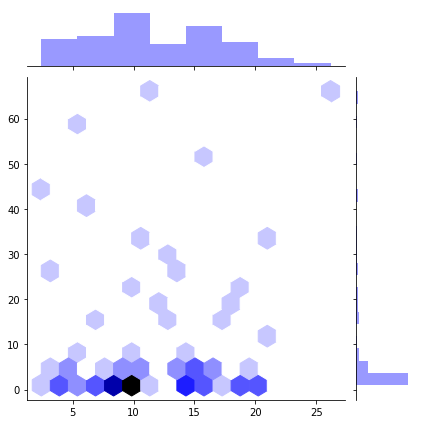

2r1hB_heme


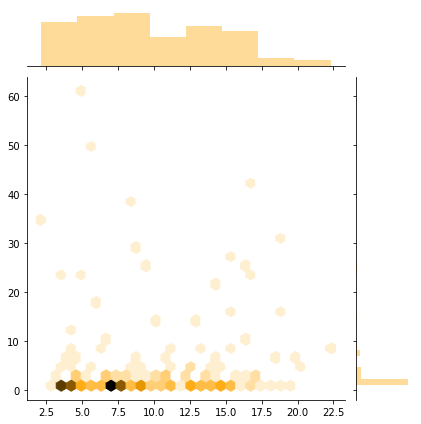

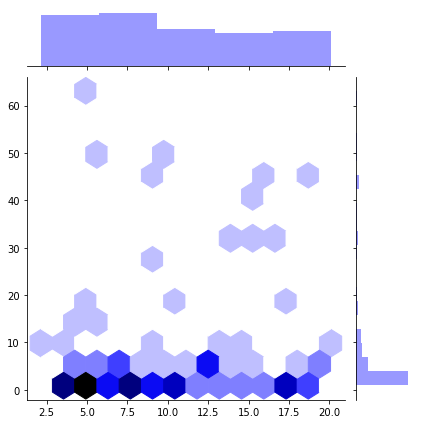

1f1cA_heme


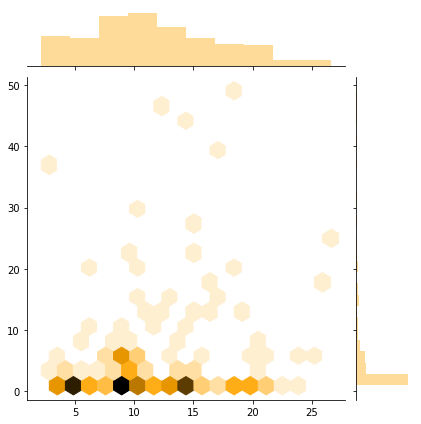

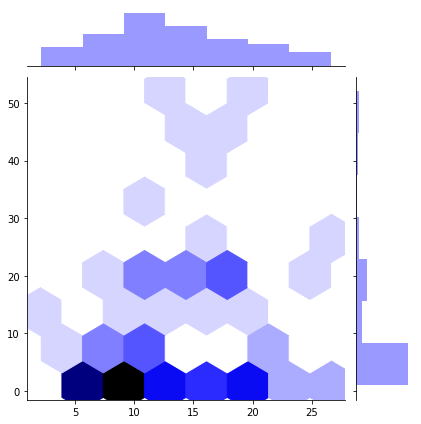

3tf8B_heme


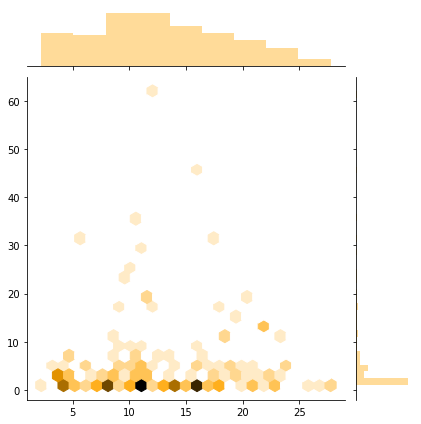

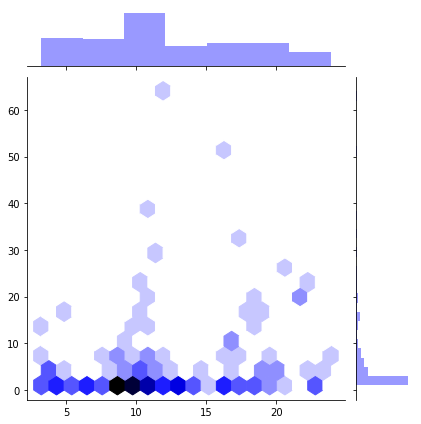

1jebA_heme


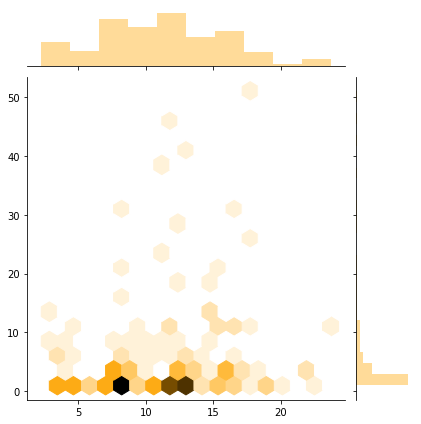

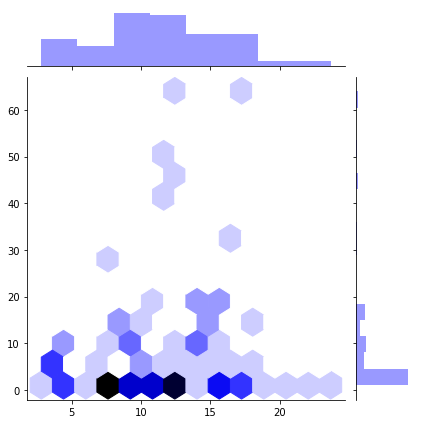

1co6A_heme


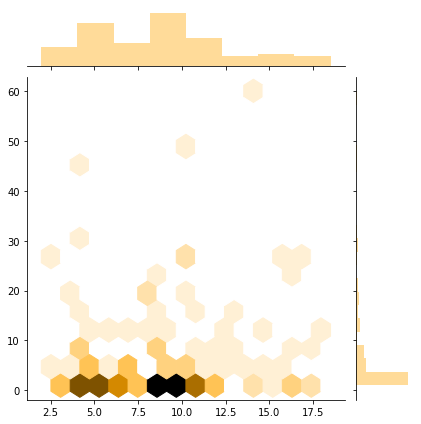

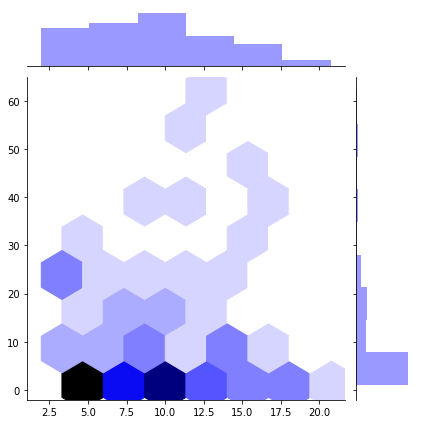

1ashA_heme


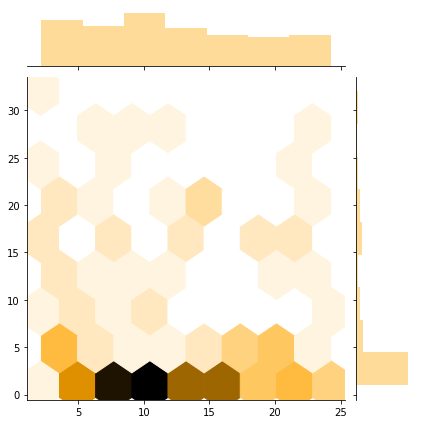

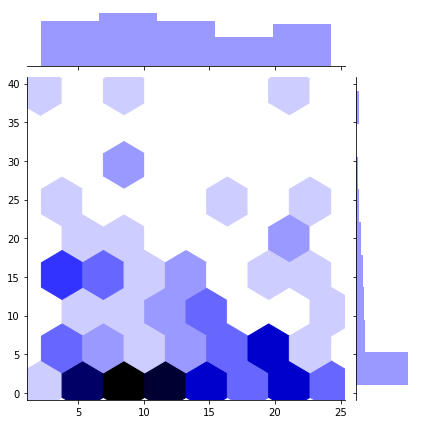

1it2A_heme


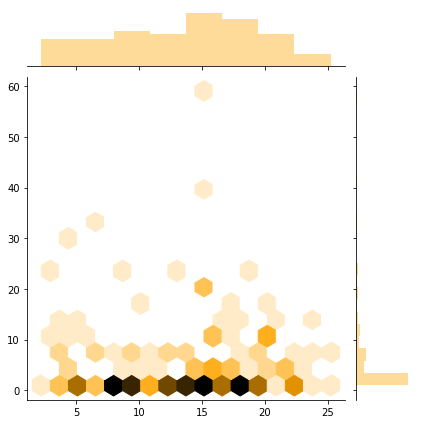

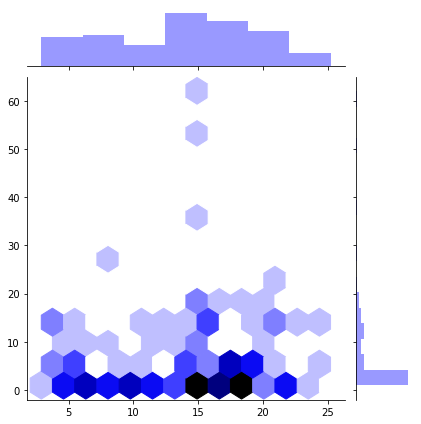

4i91A_heme


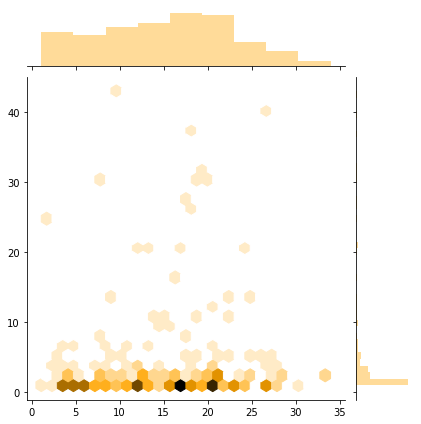

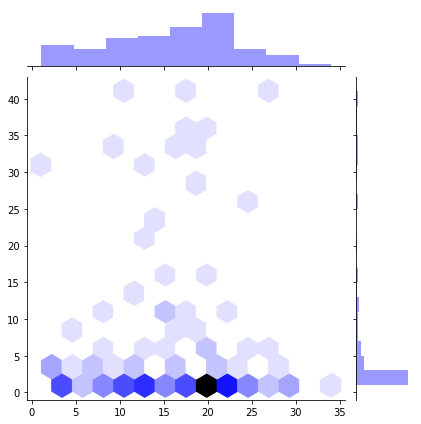

4oqrA_heme


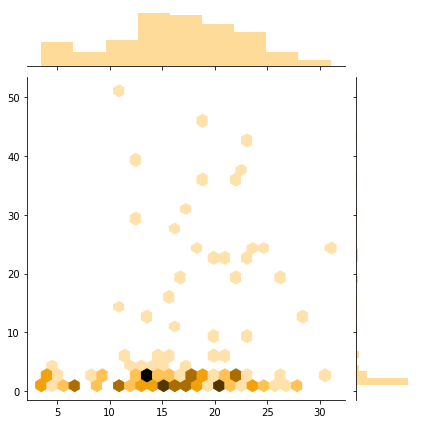

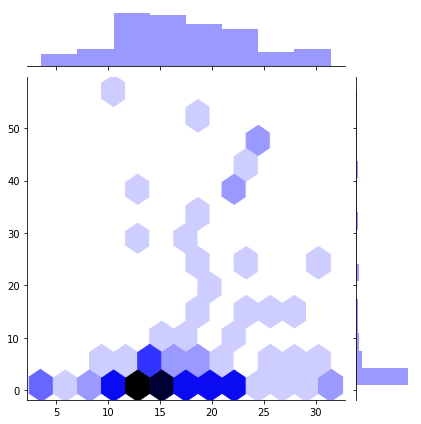

1ebtA_heme


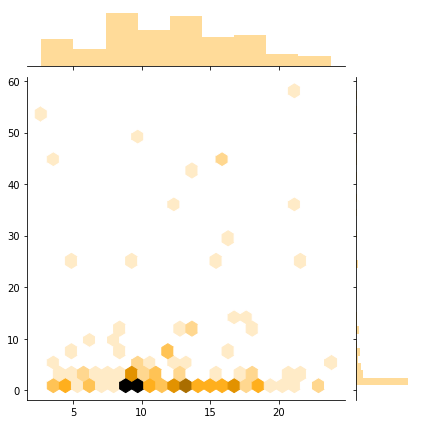

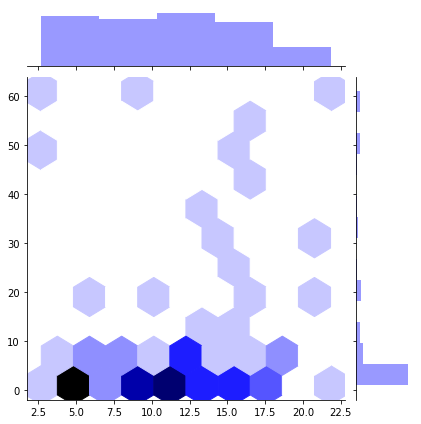

4uiiA_heme


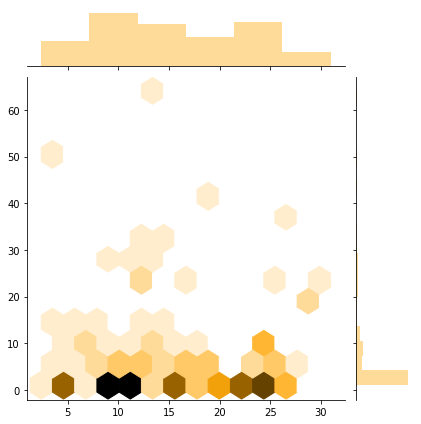

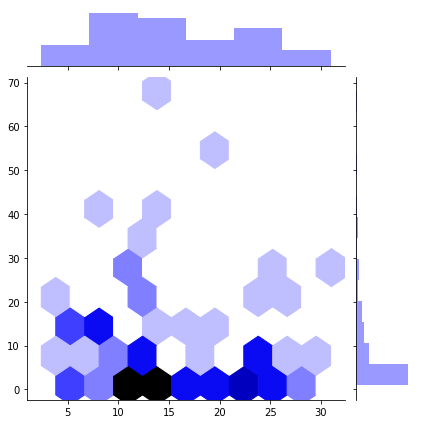

3nn2B_heme


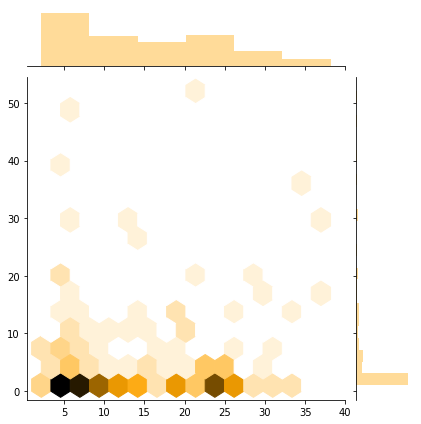

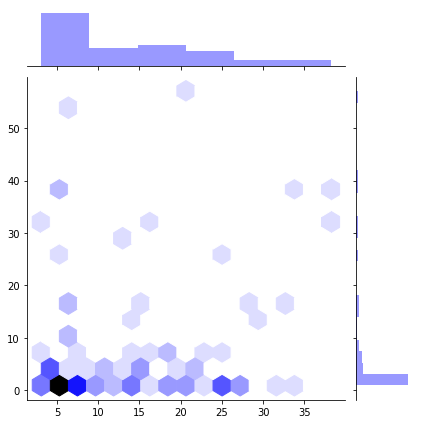

1schB_heme


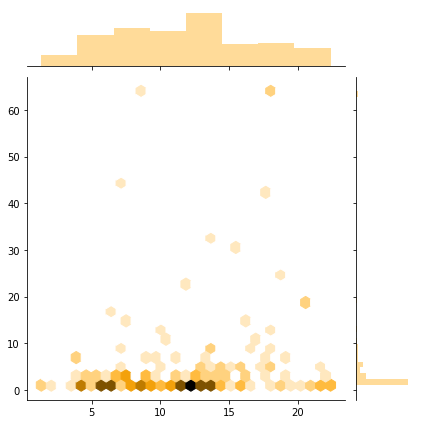

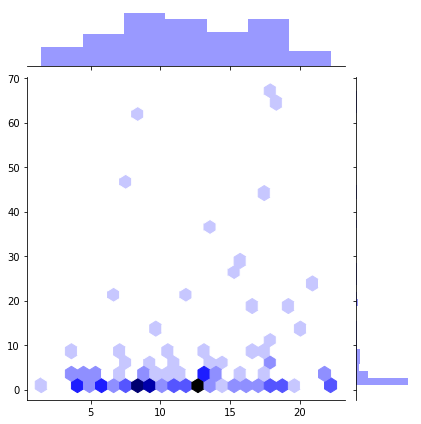

3b42A_heme


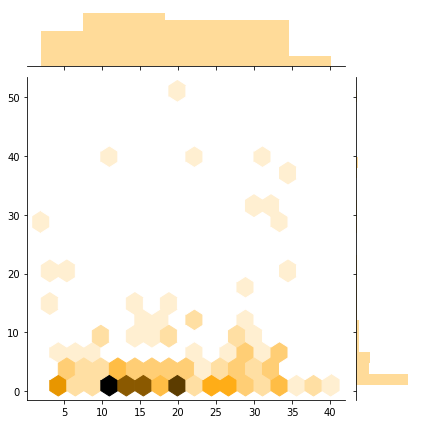

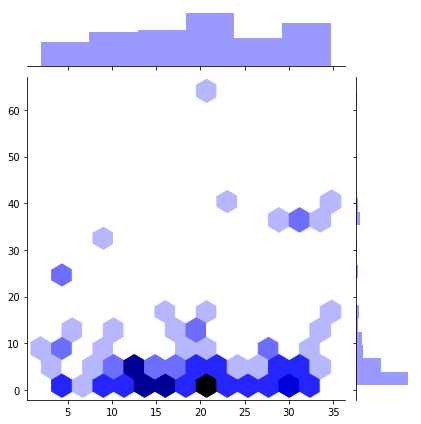

1prhA_heme


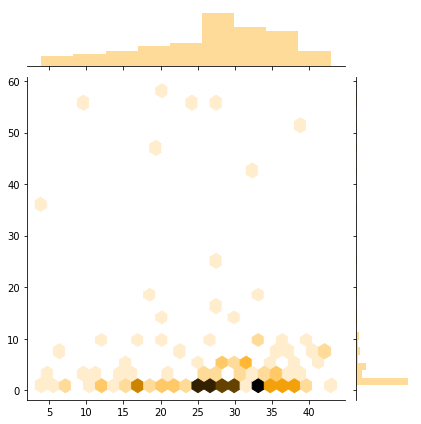

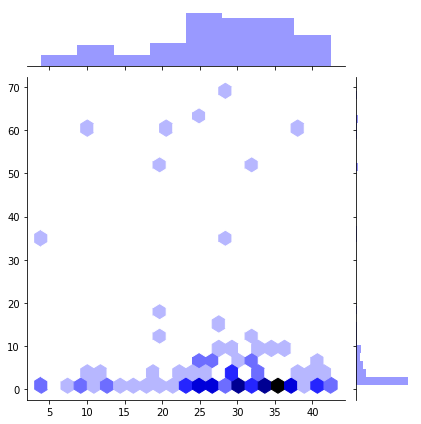

1yhuC_heme


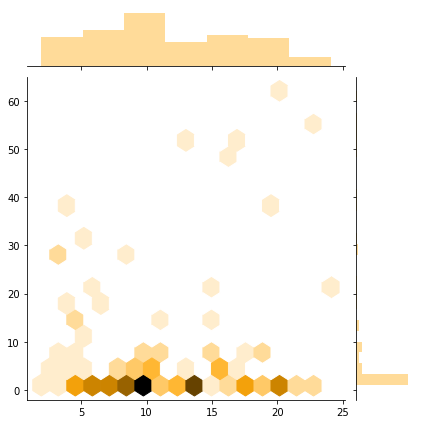

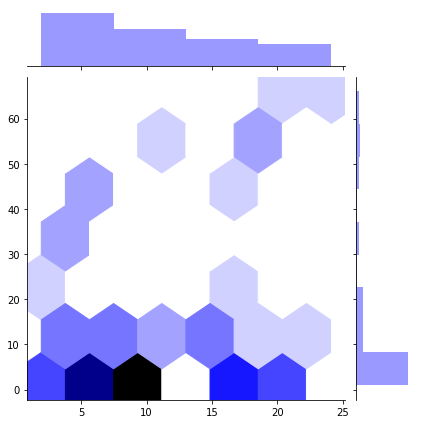

1hroA_heme


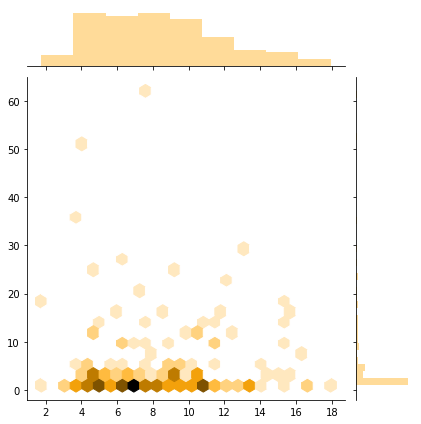

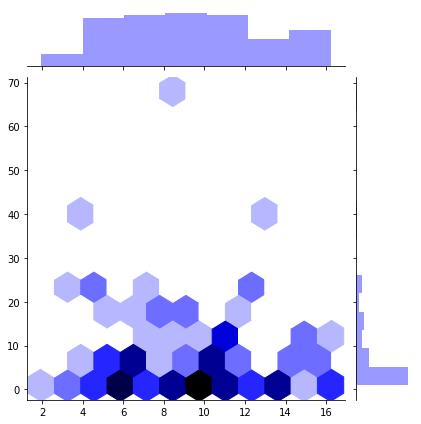

1yeaA_heme


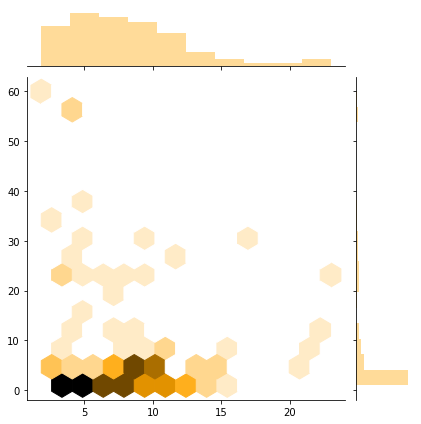

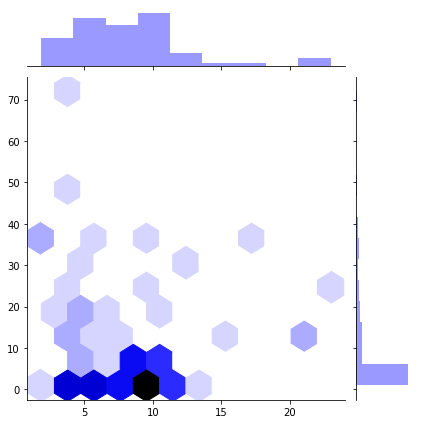

3qjtA_heme


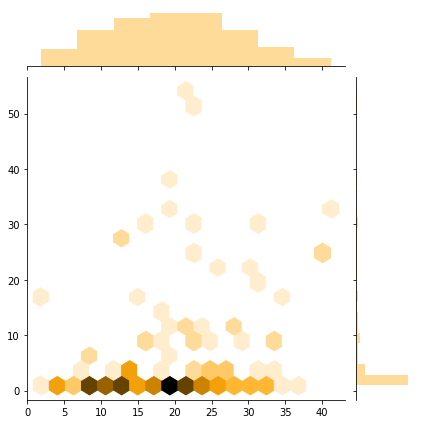

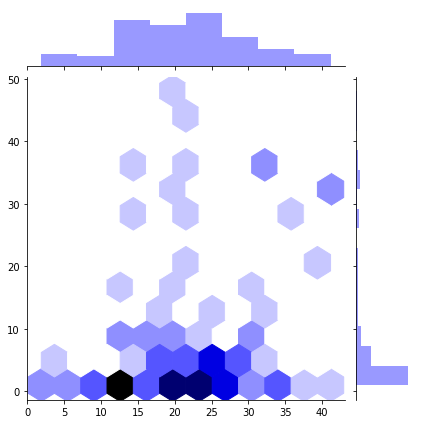

1dvhA_heme


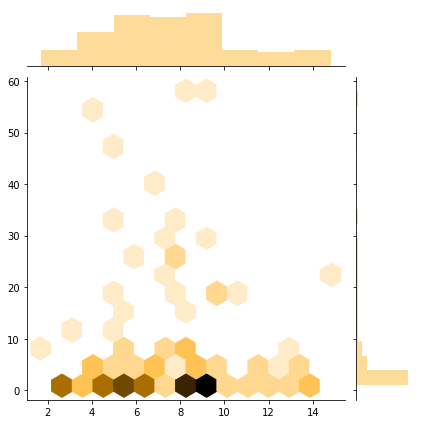

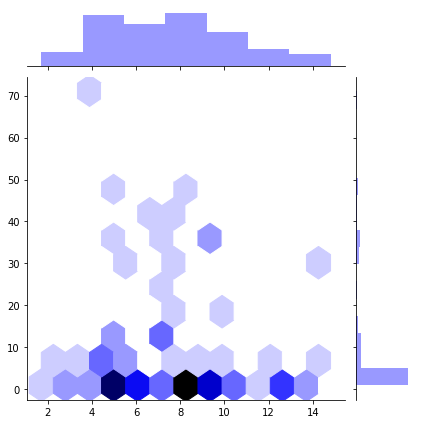

1s56B_heme


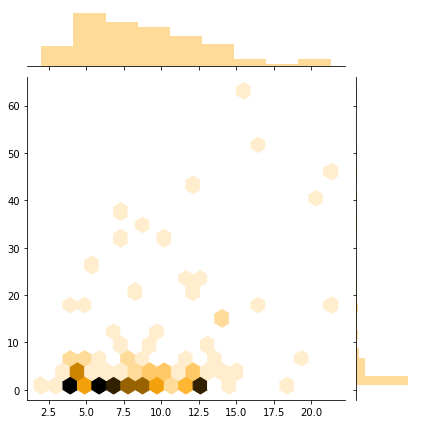

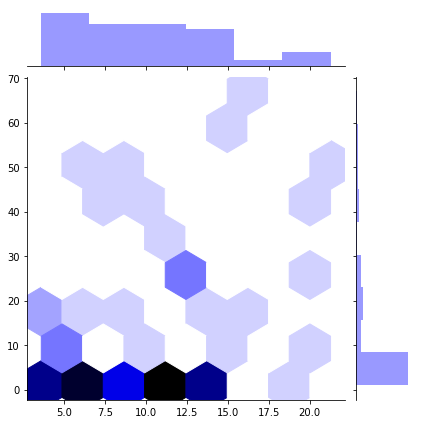

3zhwA_heme


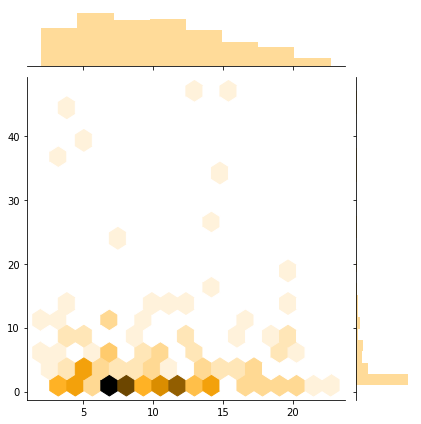

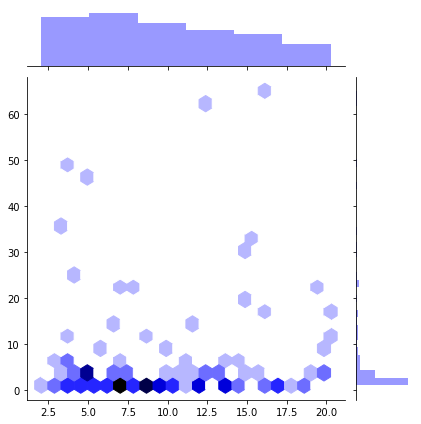

2r79A_heme


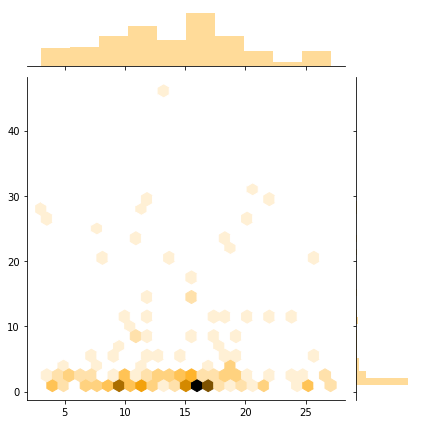

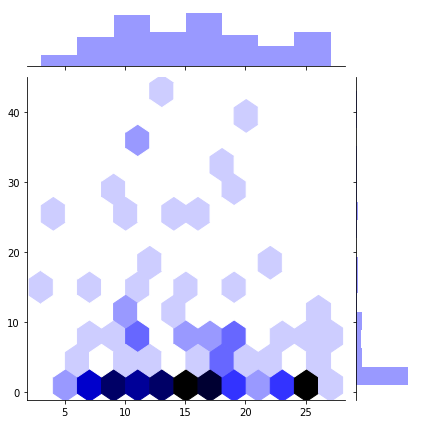

1ew6A_heme


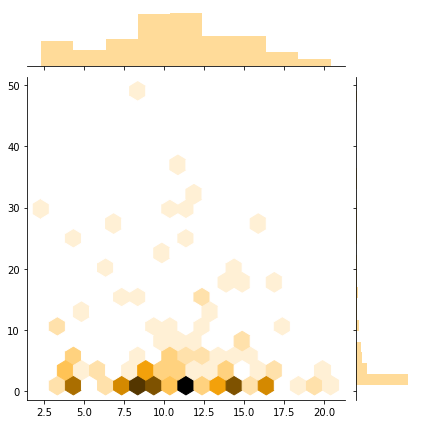

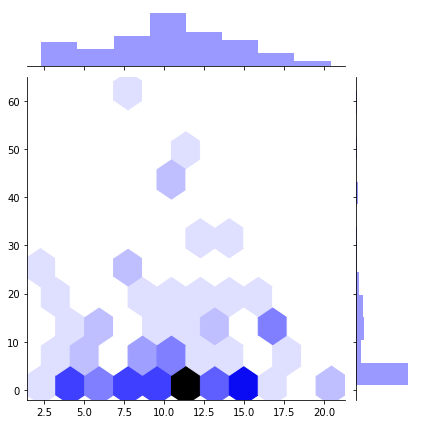

5fygA_heme


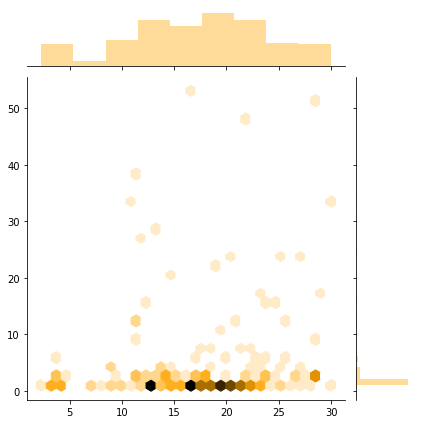

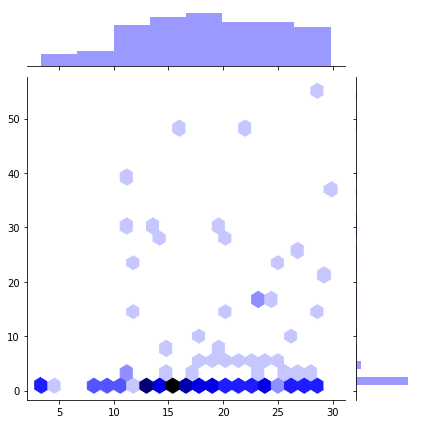

1hbgA_heme


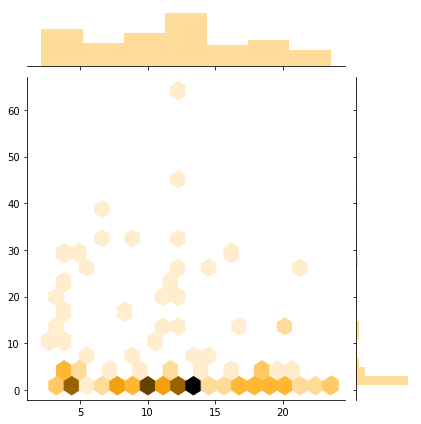

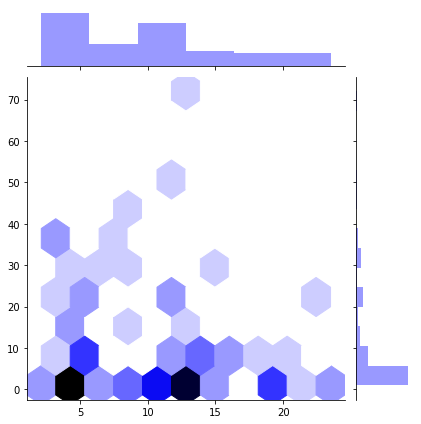

3bxuB_heme


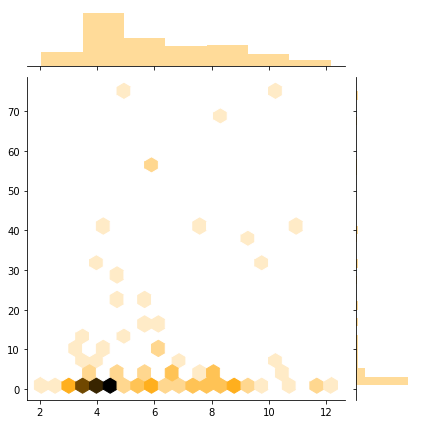

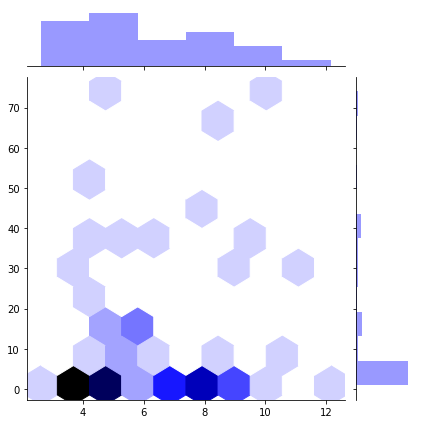

3czhA_heme


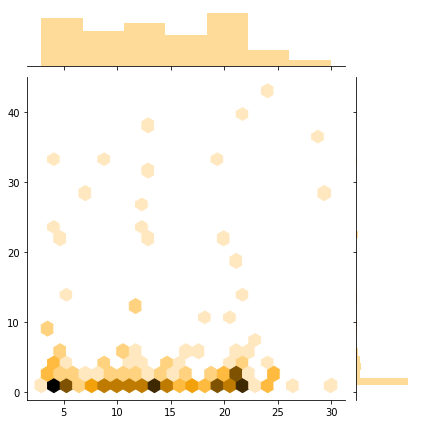

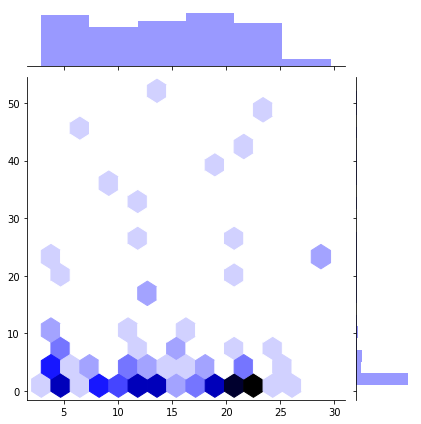

In [64]:
for i in range(50):
    output_dict = generateAverageAndCounterSimilarityAnyHetATM("./filtered/r10xi2sigma1/basematrices",
                                                      "./filtered/r10xi2sigma1/samples_filtered.xyz",
                                                      labels, i)

    heme_means = output_dict["heme_means"]
    nucleo_means = output_dict["nucleo_means"]
    heme_counts = output_dict["heme_counts"]
    nucleo_counts = output_dict["nucleo_counts"]
    distance_from_nearest_ligand_atom = output_dict["distance_from_nearest_ligand_atom"]

    hemes = [[x,y, "hemes"] for x,y in zip(distance_from_nearest_ligand_atom, heme_counts) if y != 0]
    nucleos = [[x,y, "nucleos"] for x,y in zip(distance_from_nearest_ligand_atom, nucleo_counts) if y != 0]
#     df = pd.DataFrame(hemes+nucleos, columns=["distance", "similarity", "class"])
    
    G_hemes = sns.jointplot([x[0] for x in hemes], [x[1] for x in hemes], kind="hex", color="orange")
    G_nucleos = sns.jointplot([x[0] for x in nucleos], [x[1] for x in nucleos], kind="hex", color="blue")
    plt.show()

4n4oA_heme


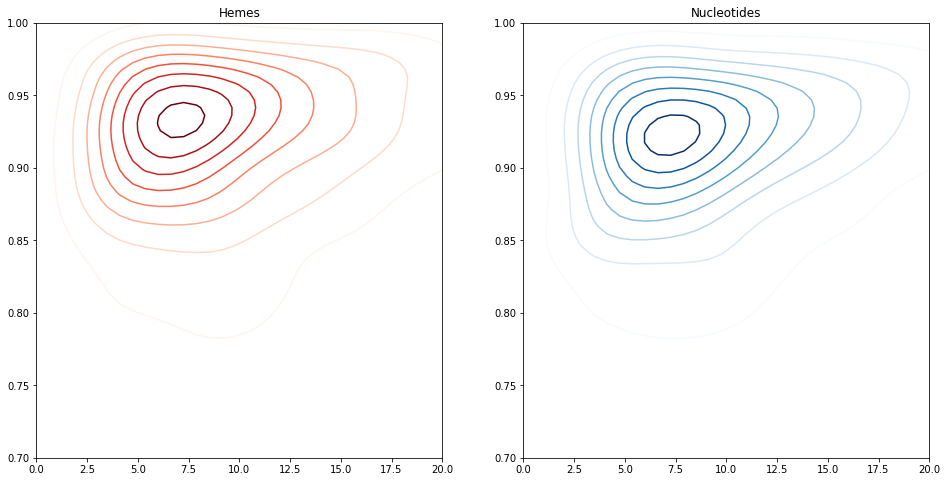

1x9fB_heme


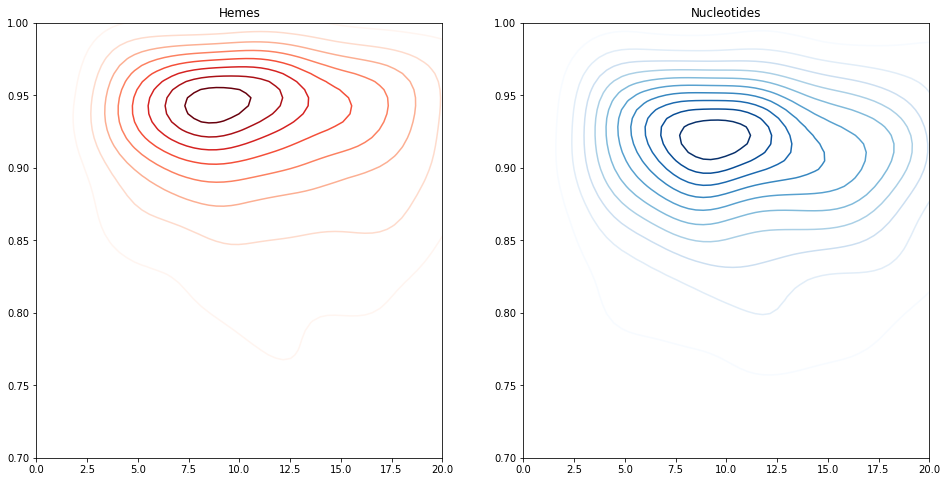

2bz9A_heme


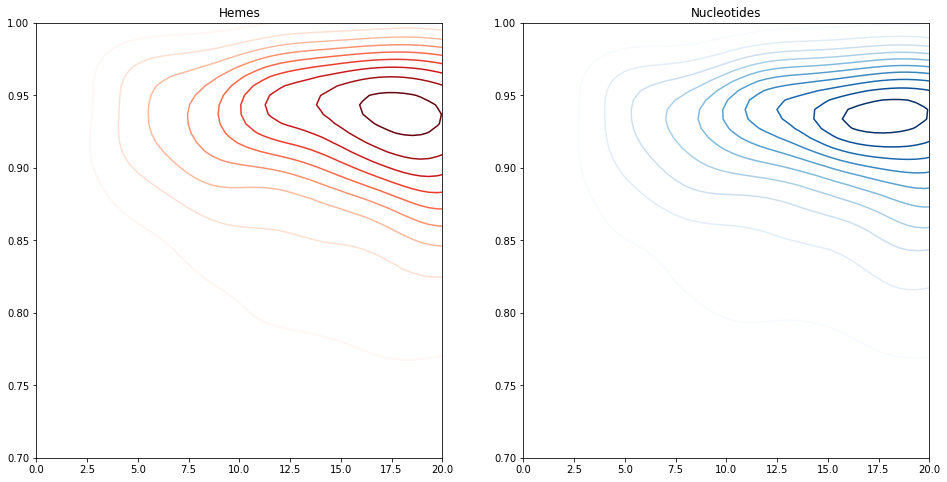

1cxyA_heme


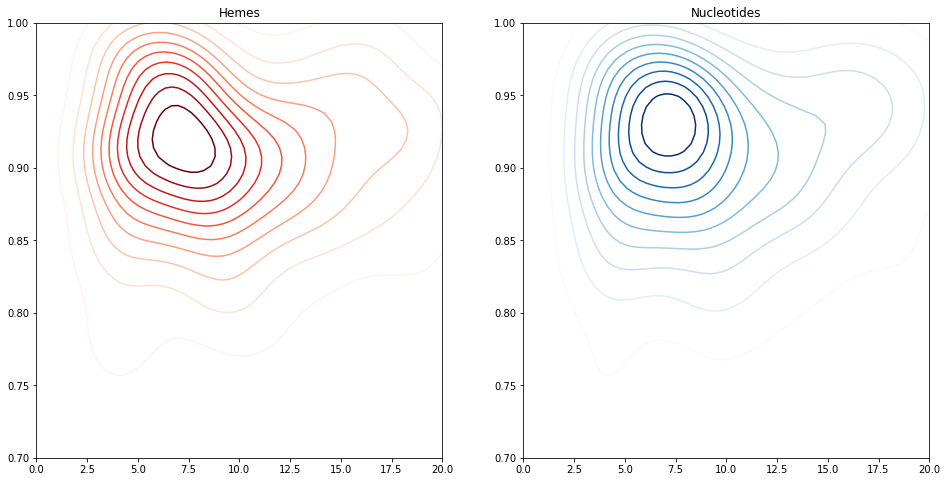

1hlmA_heme


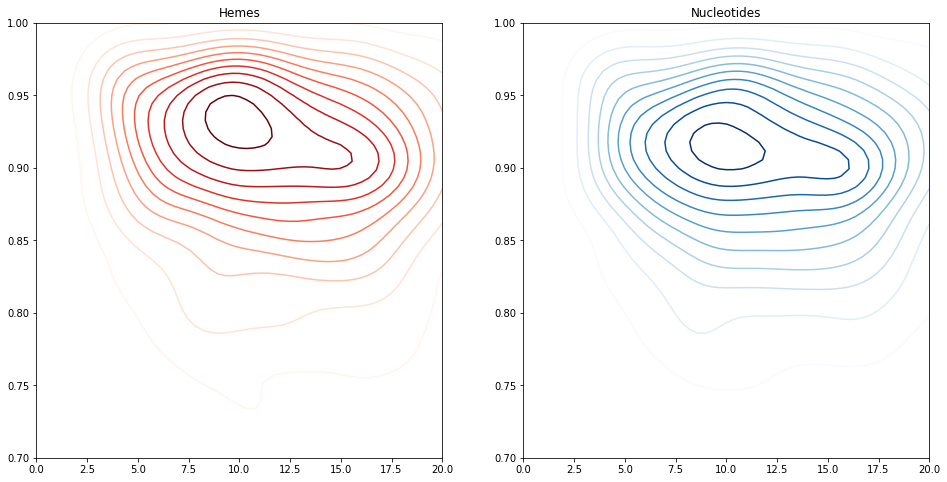

1etpA_heme


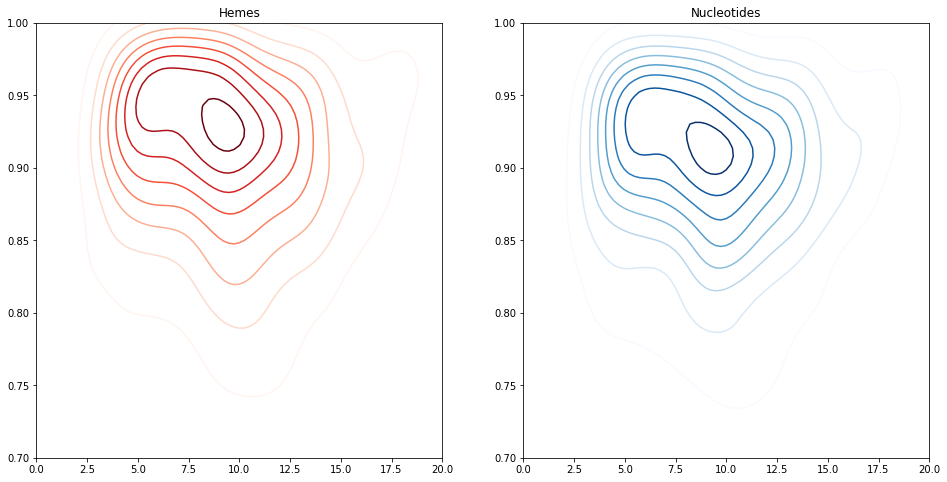

4gu7A_heme


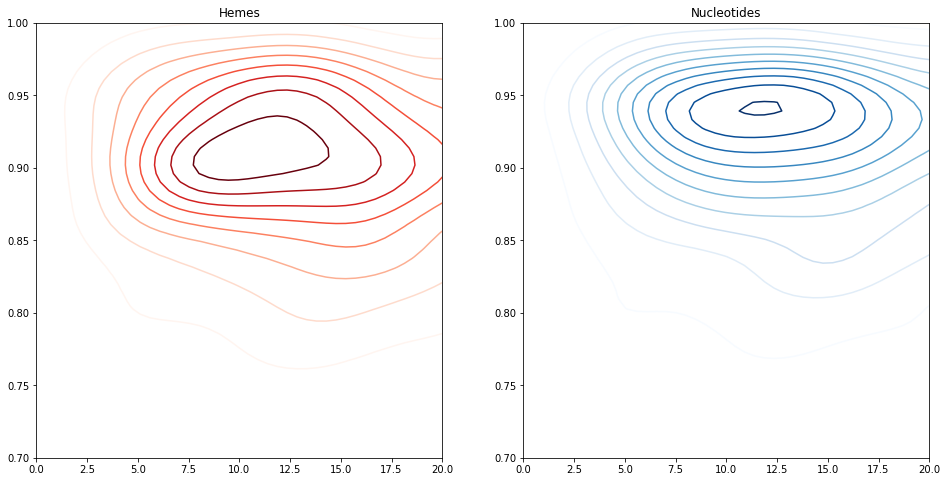

3rwlA_heme


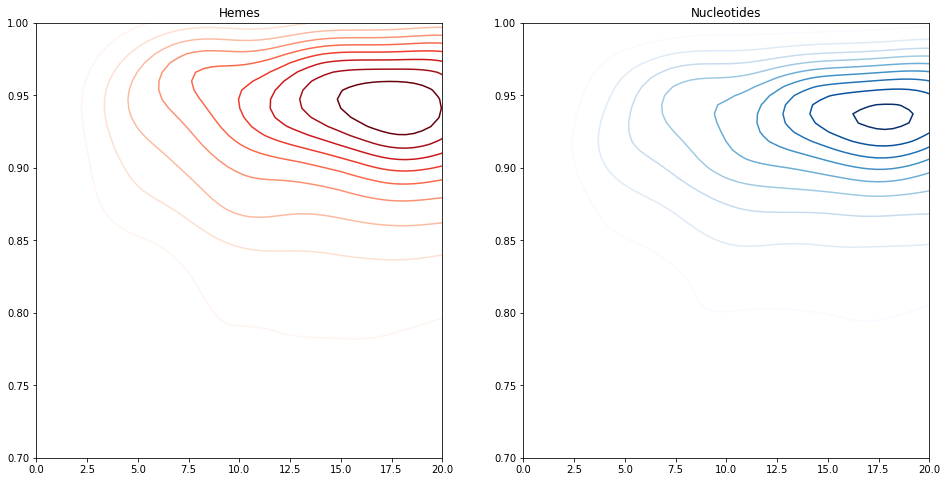

2czsA_heme


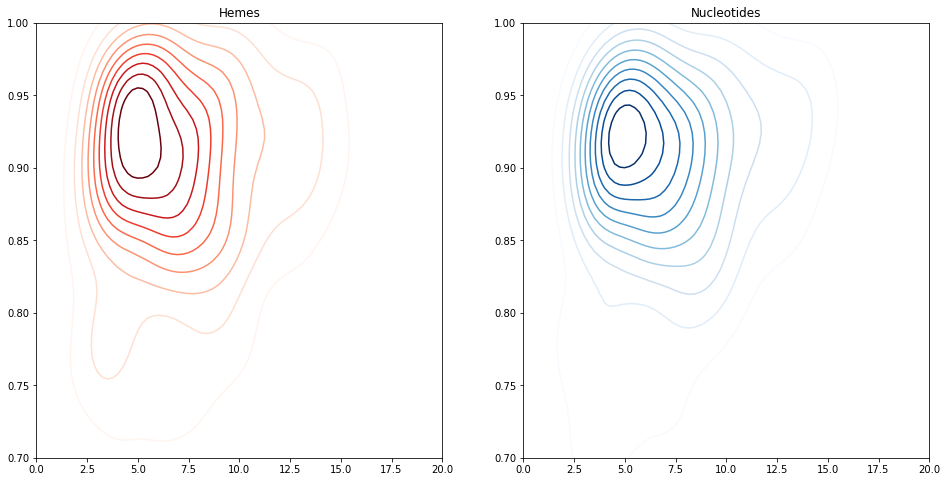

4jouA_heme


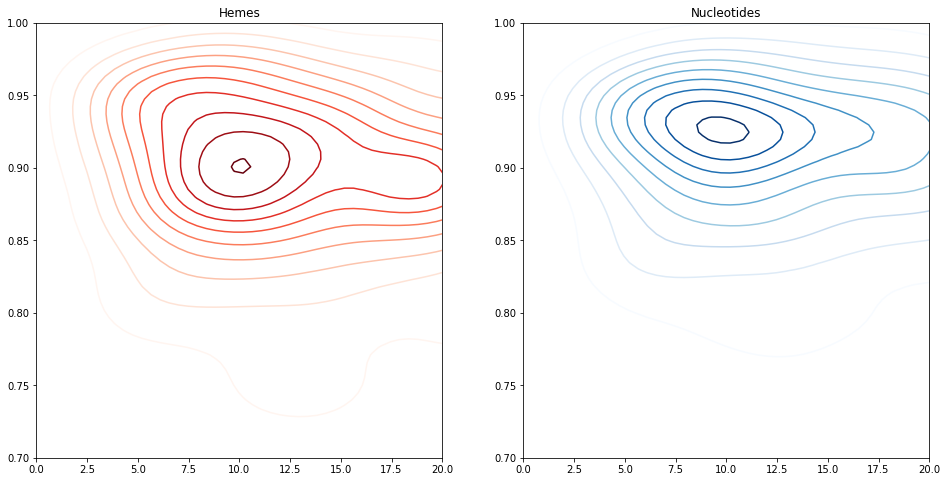

4xe3A_heme


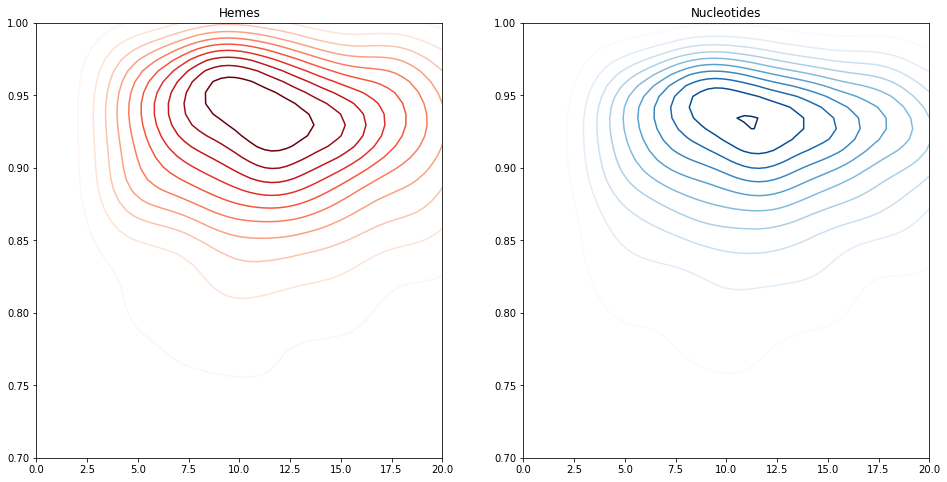

1ccrA_heme


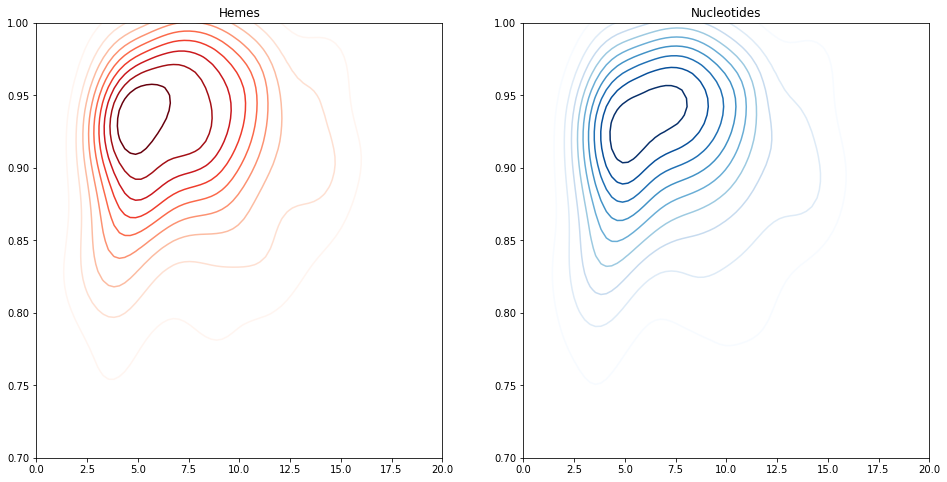

1ithA_heme


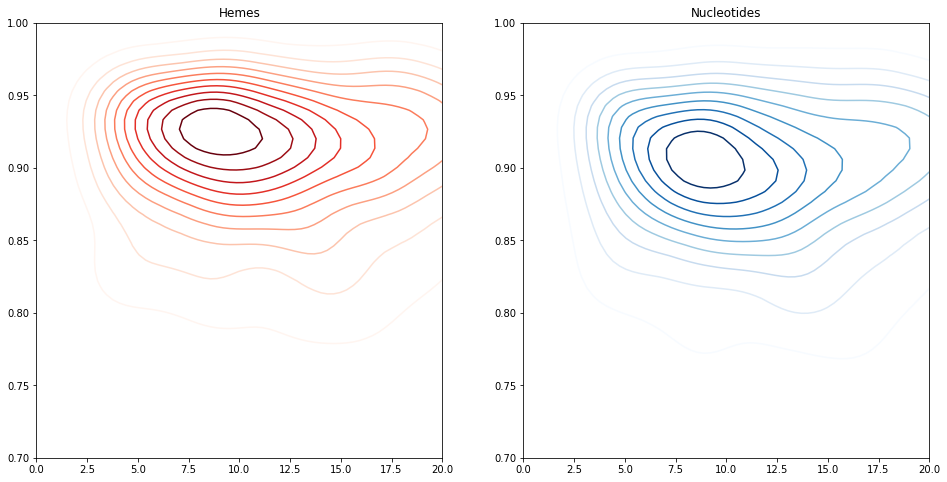

1gdiA_heme


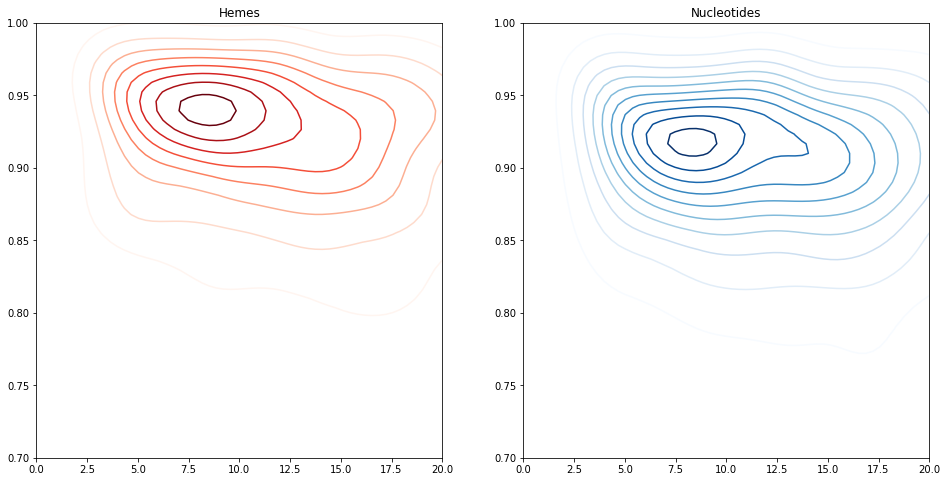

2flqB_heme
No ligand found


ValueError: zero-size array to reduction operation minimum which has no identity

In [75]:
for i in range(50):
    output_dict = generateAverageAndCounterSimilarityAnyHetATM("./filtered/r10xi2sigma1/basematrices",
                                                      "./filtered/r10xi2sigma1/samples_filtered.xyz",
                                                      labels, i)

    heme_means = output_dict["heme_means"]
    nucleo_means = output_dict["nucleo_means"]
    heme_counts = output_dict["heme_counts"]
    nucleo_counts = output_dict["nucleo_counts"]
    distance_from_nearest_ligand_atom = output_dict["distance_from_nearest_ligand_atom"]

#     hemes = [[x,y, "hemes"] for x,y in zip(distance_from_nearest_ligand_atom, heme_counts) if y != 0]
#     nucleos = [[x,y, "nucleos"] for x,y in zip(distance_from_nearest_ligand_atom, nucleo_counts) if y != 0]
# #     df = pd.DataFrame(hemes+nucleos, columns=["distance", "similarity", "class"])
    
#     G_hemes = sns.jointplot([x[0] for x in hemes], [x[1] for x in hemes], kind="hex", color="orange")
#     G_nucleos = sns.jointplot([x[0] for x in nucleos], [x[1] for x in nucleos], kind="hex", color="blue")
#     plt.show()
    
    f, axes = plt.subplots(figsize=(16, 8), ncols=2)
#     ax.set_aspect("equal")

    # Draw the two density plots
    ax = sns.kdeplot(distance_from_nearest_ligand_atom, heme_means,
                     cmap="Reds", shade=False, shade_lowest=False, ax=axes[0])
    ax = sns.kdeplot(distance_from_nearest_ligand_atom, nucleo_means,
                     cmap="Blues", shade=False, shade_lowest=False, ax=axes[1])

    axes[0].set_title("Hemes")
    axes[1].set_title("Nucleotides")
    for ax in axes:
        ax.set_xlim([0,20])
        ax.set_ylim([0.7,1.0])
    plt.show()
    # Add labels to the plot
#     red = sns.color_palette("Reds")[-2]
#     blue = sns.color_palette("Blues")[-2]
#     ax.text(2.5, 8.2, "virginica", size=16, color=blue)
#     ax.text(3.8, 4.5, "setosa", size=16, color=red)

4n4oA_heme


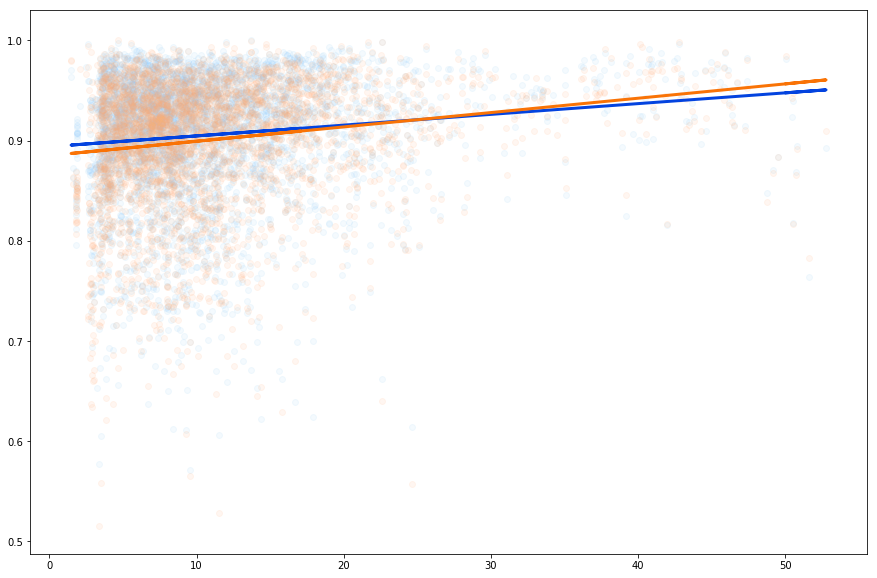

NameError: name 'asdas' is not defined

In [86]:
# Get the correlations
import sklearn.linear_model

for i in range(50):
    output_dict = generateAverageAndCounterSimilarityAnyHetATM("./filtered/r10xi2sigma1/basematrices",
                                                      "./filtered/r10xi2sigma1/samples_filtered.xyz",
                                                      labels, i)

    heme_means = output_dict["heme_means"]
    nucleo_means = output_dict["nucleo_means"]
    heme_counts = output_dict["heme_counts"]
    nucleo_counts = output_dict["nucleo_counts"]
    distance_from_nearest_ligand_atom = output_dict["distance_from_nearest_ligand_atom"]

    regr = sklearn.linear_model.LinearRegression()

    # The X_train needs to be 2D to work with sklearn 
    x_train = np.asarray(distance_from_nearest_ligand_atom).reshape(-1, 1)
    y_train = np.asarray(heme_means)
    regr.fit(x_train, y_train)

    # Make predictions using the testing set
    y_pred = regr.predict(x_train)

    regr2 = sklearn.linear_model.LinearRegression()
    y_train2 = np.asarray(nucleo_means)
    regr2.fit(x_train, y_train2)

    y_pred2 = regr2.predict(x_train)

    # Plot the fit
    fig, ax = plt.subplots(figsize=(15,10))
    plt.scatter(x_train, y_train,  color='xkcd:light blue', alpha=0.1)
    plt.plot(x_train, y_pred, color='xkcd:blue', linewidth=3)
    
    # Plot the fit
    plt.scatter(x_train, y_train2,  color='xkcd:peach', alpha=0.1)
    plt.plot(x_train, y_pred2, color='xkcd:orange', linewidth=3)
    plt.show()

4n4oA_heme


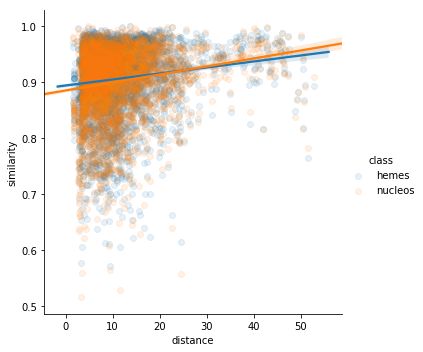

1x9fB_heme


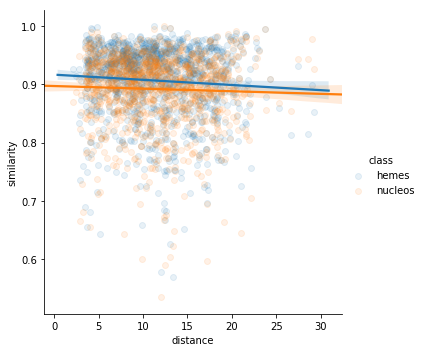

2bz9A_heme


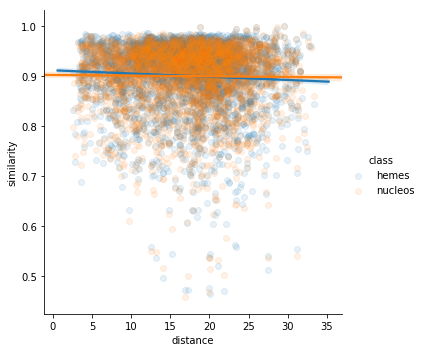

1cxyA_heme


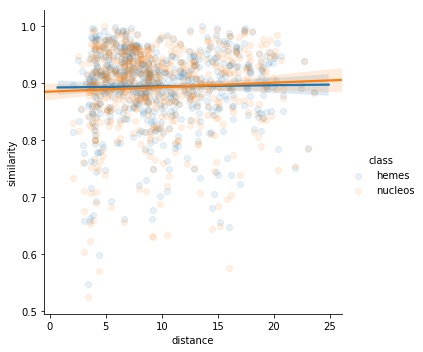

1hlmA_heme


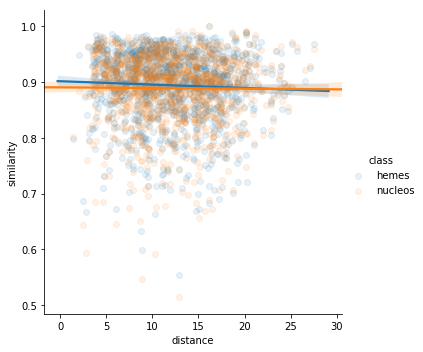

1etpA_heme


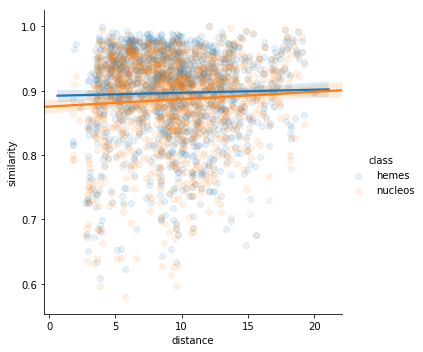

4gu7A_heme


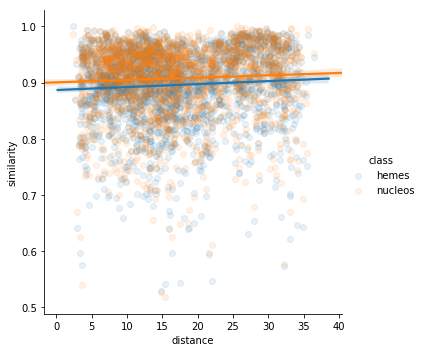

3rwlA_heme


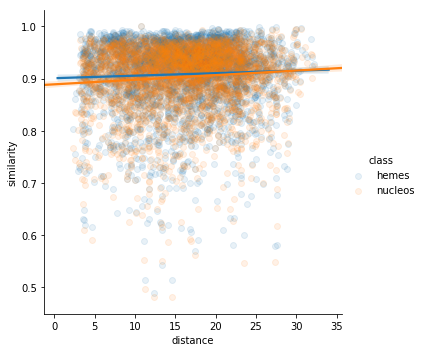

2czsA_heme


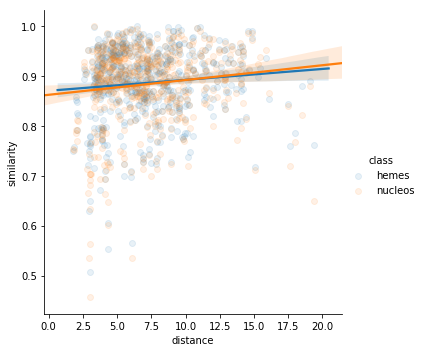

4jouA_heme


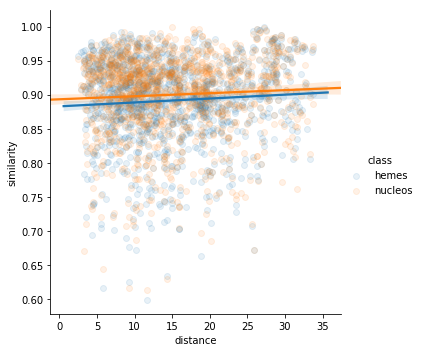

4xe3A_heme


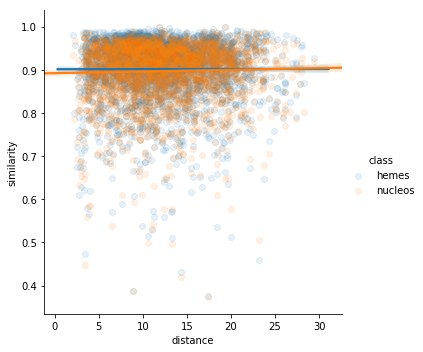

1ccrA_heme


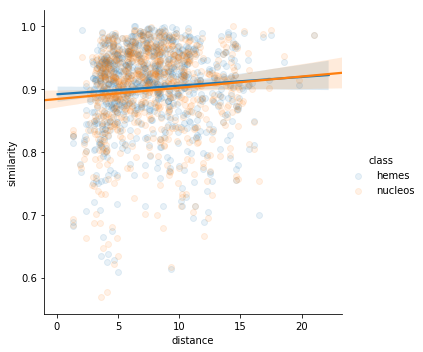

1ithA_heme


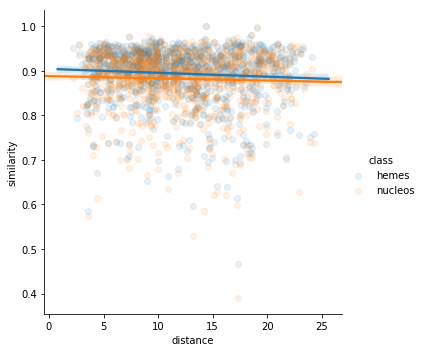

1gdiA_heme


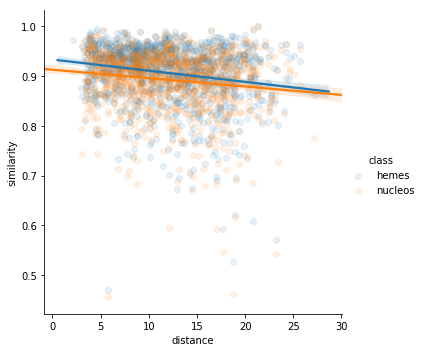

2flqB_heme


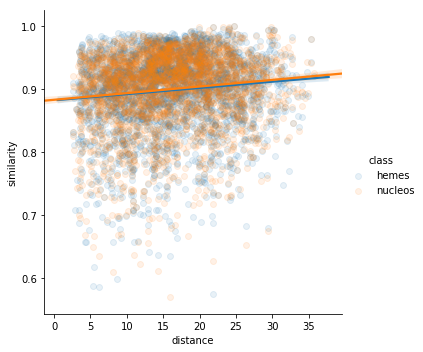

2d09A_heme


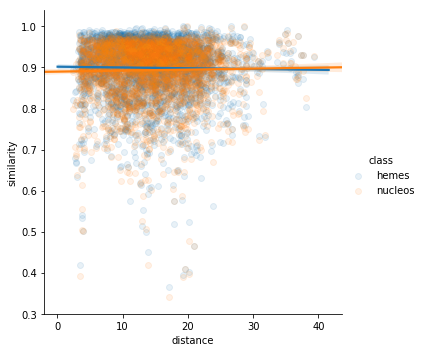

1cxaA_heme


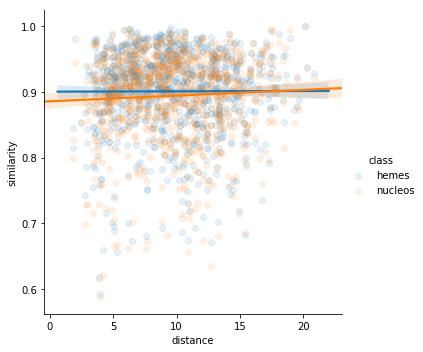

1gksA_heme


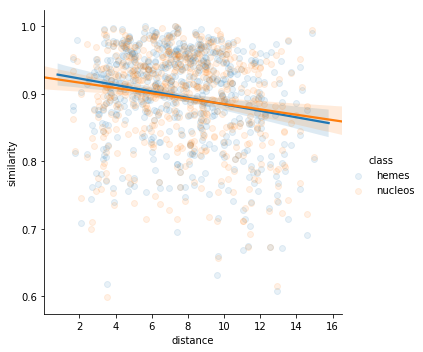

2v7iA_heme


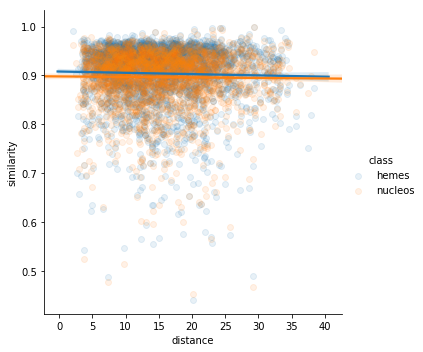

1ix3A_heme


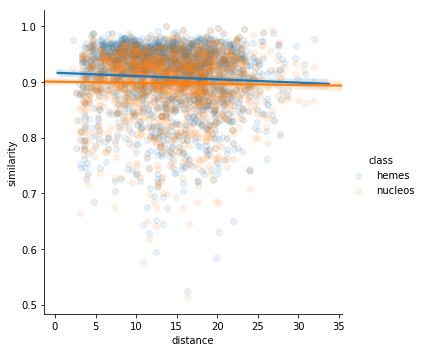

4n4jA_heme


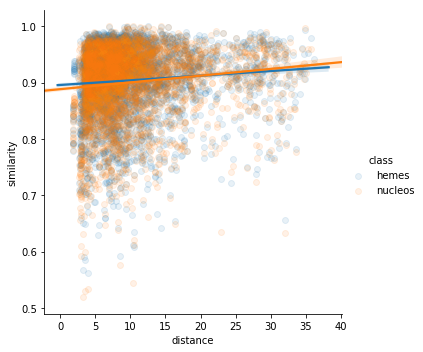

1ecaA_heme


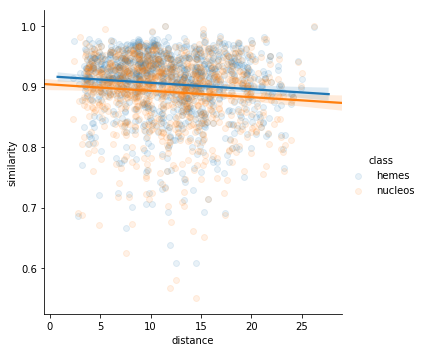

2r1hB_heme


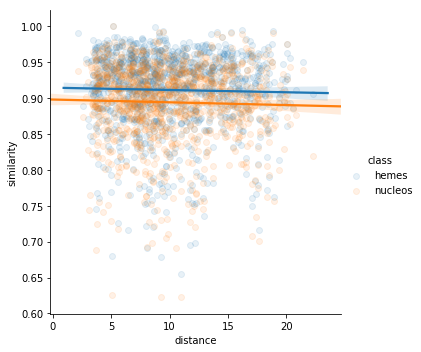

1f1cA_heme


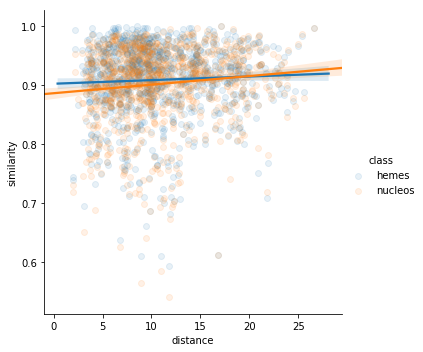

3tf8B_heme


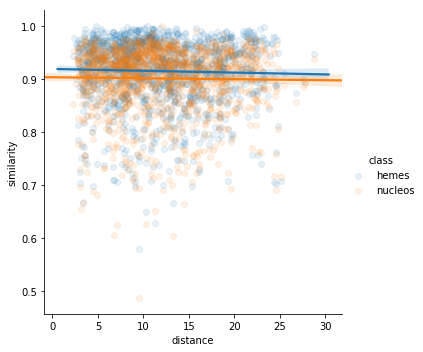

1jebA_heme


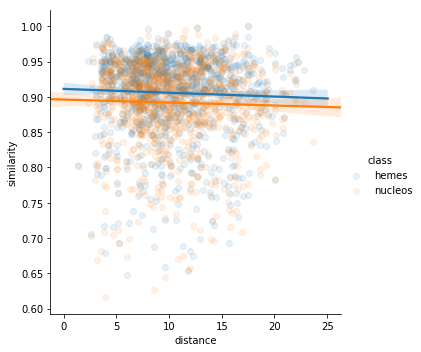

1co6A_heme


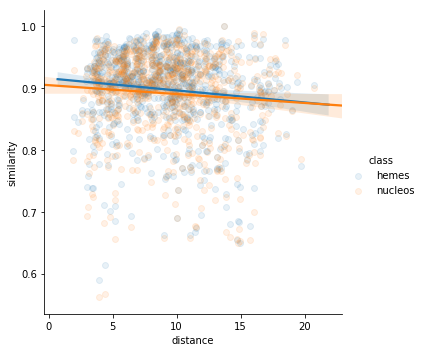

1ashA_heme


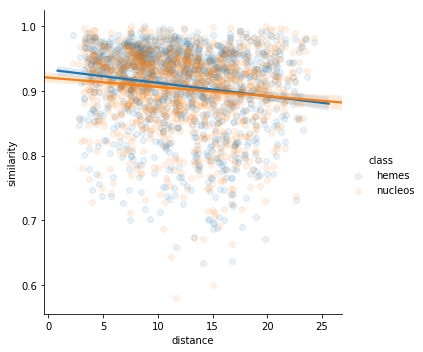

1it2A_heme


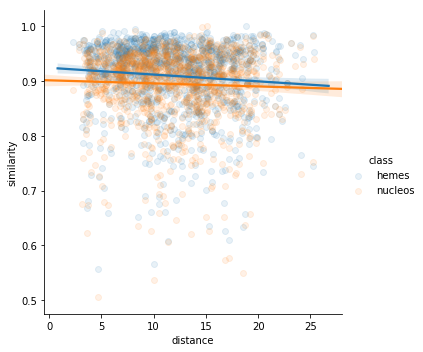

4i91A_heme


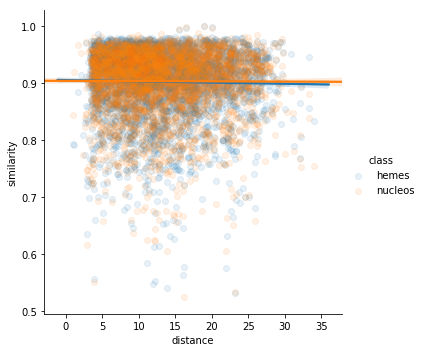

4oqrA_heme


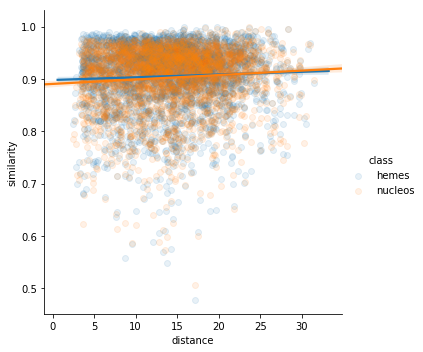

1ebtA_heme


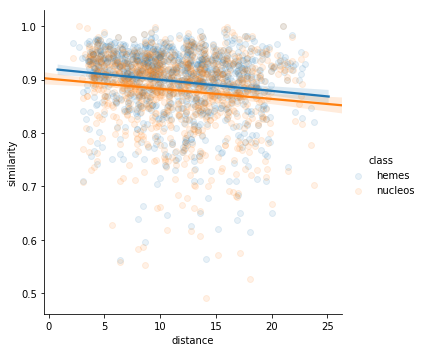

4uiiA_heme


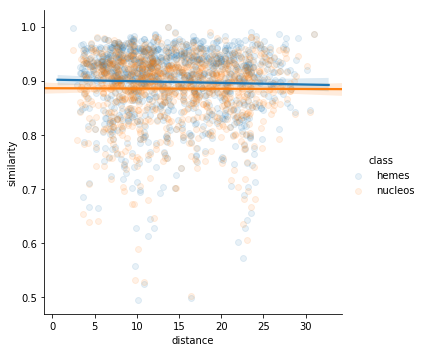

3nn2B_heme


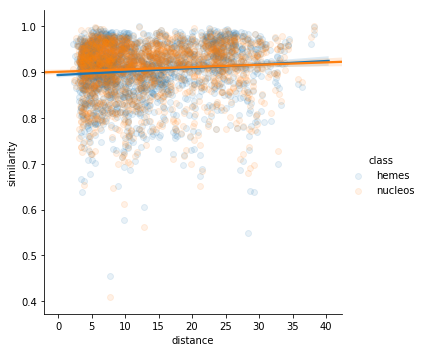

1schB_heme


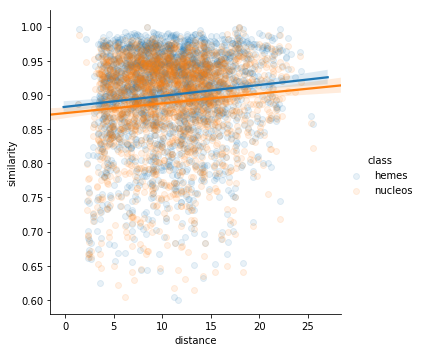

3b42A_heme


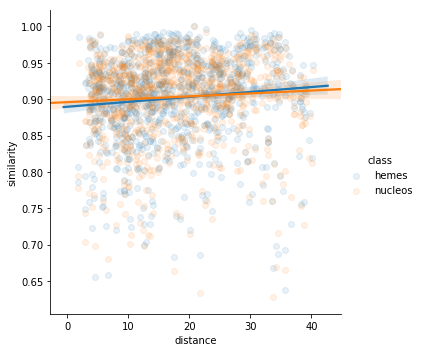

1prhA_heme


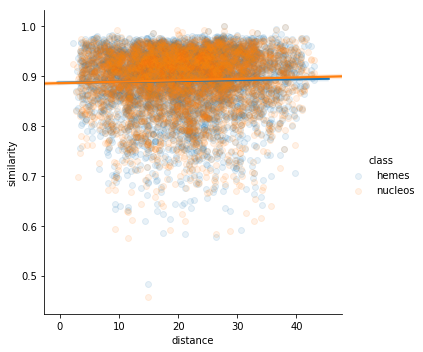

1yhuC_heme


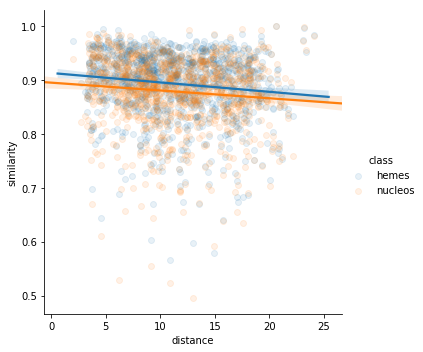

1hroA_heme


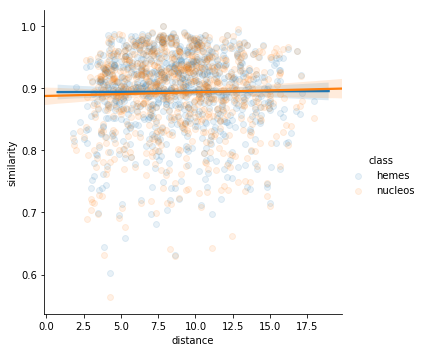

1yeaA_heme


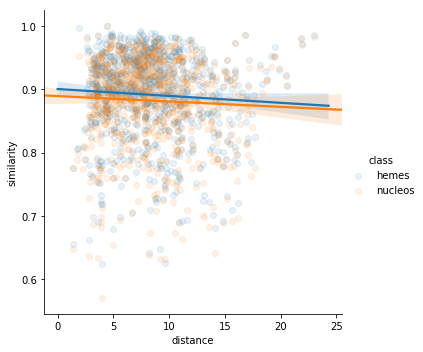

3qjtA_heme


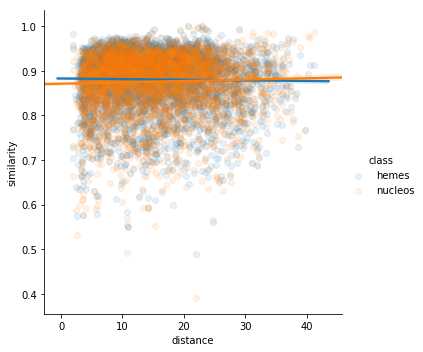

1dvhA_heme


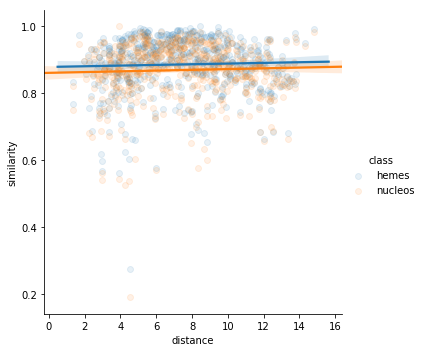

1s56B_heme


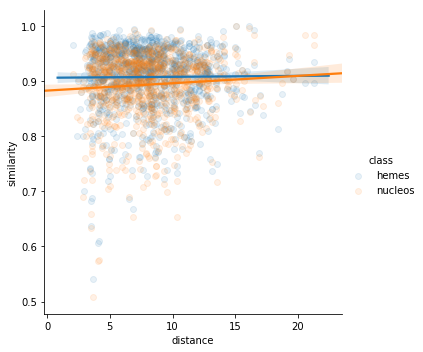

3zhwA_heme


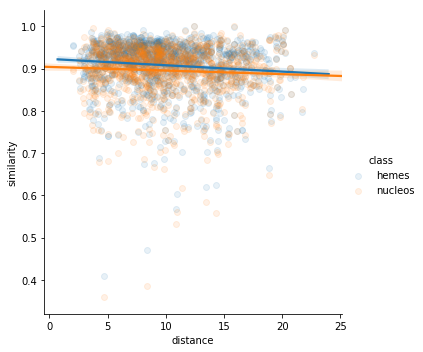

2r79A_heme


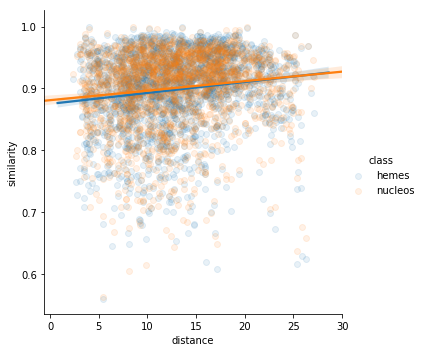

1ew6A_heme


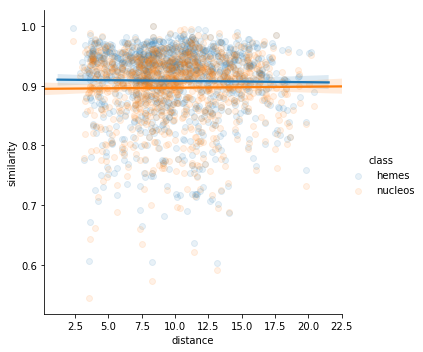

5fygA_heme


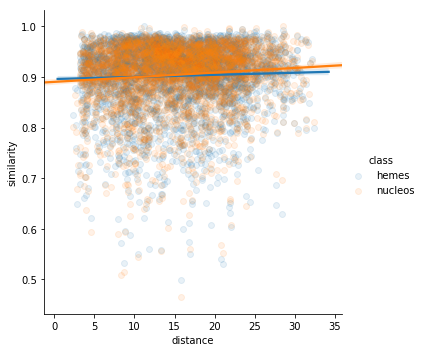

1hbgA_heme


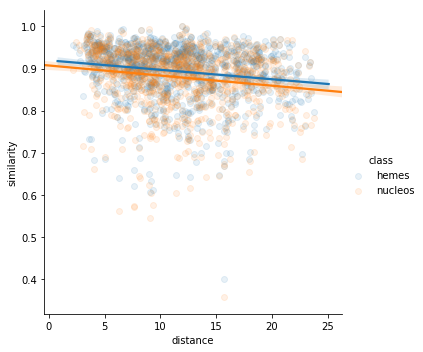

3bxuB_heme


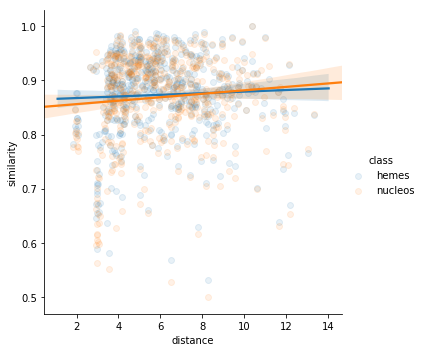

3czhA_heme


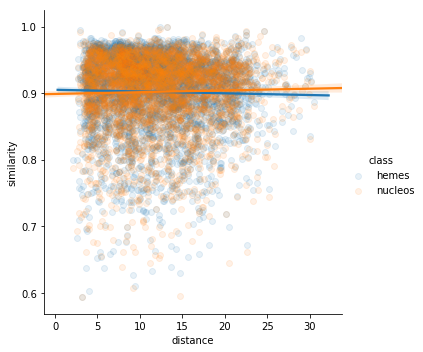

In [90]:
# Get the correlations

for i in range(50):
    output_dict = generateAverageAndCounterSimilarityAnyHetATM("./filtered/r10xi2sigma1/basematrices",
                                                      "./filtered/r10xi2sigma1/samples_filtered.xyz",
                                                      labels, i)

    heme_means = output_dict["heme_means"]
    nucleo_means = output_dict["nucleo_means"]
    heme_counts = output_dict["heme_counts"]
    nucleo_counts = output_dict["nucleo_counts"]
    distance_from_nearest_ligand_atom = output_dict["distance_from_nearest_ligand_atom"]

    
    
    hemes = [[x,y, "hemes"] for x,y in zip(distance_from_nearest_ligand_atom, heme_means) if y != 0]
    nucleos = [[x,y, "nucleos"] for x,y in zip(distance_from_nearest_ligand_atom, nucleo_means) if y != 0]
    df = pd.DataFrame(hemes+nucleos, columns=["distance", "similarity", "class"])

    g = sns.lmplot(x="distance", y="similarity", hue="class", data=df, scatter_kws={"alpha": 0.1})
    plt.show()

## Continguity Score

Continguity score

Can we do some sort of proximity-weighted average of the counts, over all the nearby atoms?

For each atom:
- Get all atoms within e.g. 10 Angstroms
- New score = sum(exp(-distance)*score)


4n4oA_heme


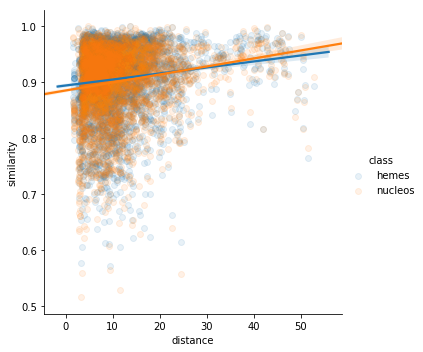

In [91]:
# Get the correlations

output_dict = generateAverageAndCounterSimilarityAnyHetATM("./filtered/r10xi2sigma1/basematrices",
                                                  "./filtered/r10xi2sigma1/samples_filtered.xyz",
                                                  labels, 0)

heme_means = output_dict["heme_means"]
nucleo_means = output_dict["nucleo_means"]
heme_counts = output_dict["heme_counts"]
nucleo_counts = output_dict["nucleo_counts"]
distance_from_nearest_ligand_atom = output_dict["distance_from_nearest_ligand_atom"]



hemes = [[x,y, "hemes"] for x,y in zip(distance_from_nearest_ligand_atom, heme_means) if y != 0]
nucleos = [[x,y, "nucleos"] for x,y in zip(distance_from_nearest_ligand_atom, nucleo_means) if y != 0]
df = pd.DataFrame(hemes+nucleos, columns=["distance", "similarity", "class"])

g = sns.lmplot(x="distance", y="similarity", hue="class", data=df, scatter_kws={"alpha": 0.1})
plt.show()

In [92]:
path_to_xyz_file =  "./filtered/r10xi2sigma1/samples_filtered.xyz"
atom_reader = quippy.AtomsReader(path_to_xyz_file, format="xyz")
# Crude, but quick enough for now
for temp_protein in atom_reader:
    if temp_protein.params["tag"] == label:
        protein = temp_protein
        break


In [132]:
positions = protein.arrays["positions"]

# Get the distance from each atom to each other atom

D = scipy.spatial.distance.squareform(scipy.spatial.distance.pdist(positions))
print(np.round(D, 1)) 

[[ 0.   1.5  2.5 ... 89.3 89.1 88.8]
 [ 1.5  0.   1.5 ... 88.  87.8 87.5]
 [ 2.5  1.5  0.  ... 87.4 87.3 87. ]
 ...
 [89.3 88.  87.4 ...  0.   1.5  2.5]
 [89.1 87.8 87.3 ...  1.5  0.   1.5]
 [88.8 87.5 87.  ...  2.5  1.5  0. ]]


In [97]:
# argsort each row to get a list of which points are closest for each atom
closest = np.argsort(D, axis=1)
print(closest)

[[   0    1    4 ... 1923 1921 1922]
 [   1    0    2 ... 1925 1921 1922]
 [   2    3    9 ... 1925 1921 1922]
 ...
 [3747 3749 3748 ...  843  845  844]
 [3748 3747 3749 ...  843  845  844]
 [3749 3747 3748 ...  843  845  844]]


1


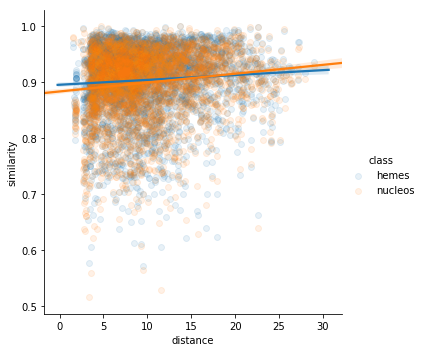

10


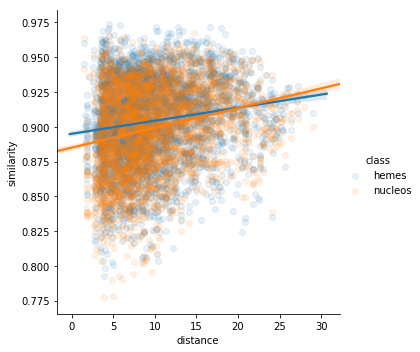

100


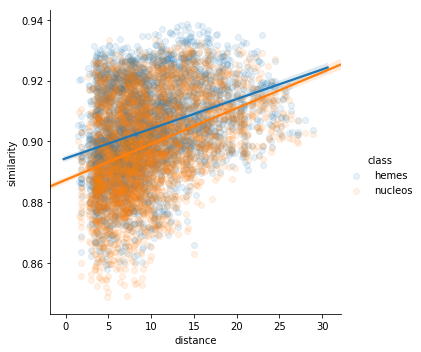

1000


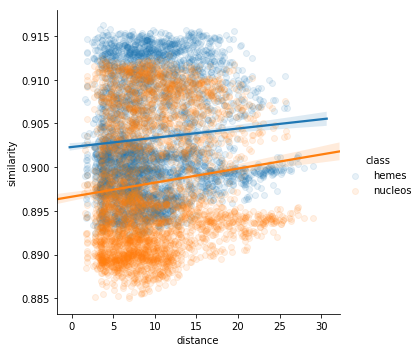

In [110]:
for k in [1,10,100,1000]:
# Select the k closest atoms (including itself)
    print(k)
#     k = 100
    k_nearest_atoms = closest[:, 0:k]

    # Get the corresponding value of heme_means, average.
    # TODO MAKE THIS A WEIGHTED AVERAGE
    averaged_heme_means = [np.mean([heme_means[x] for x in row]) for row in k_nearest_atoms]
    averaged_nucleo_means = [np.mean([nucleo_means[x] for x in row]) for row in k_nearest_atoms]

    # Get the correlations
    hemes = [[x,y, "hemes"] for x,y in zip(distance_from_nearest_ligand_atom, averaged_heme_means) if y != 0]
    nucleos = [[x,y, "nucleos"] for x,y in zip(distance_from_nearest_ligand_atom, averaged_nucleo_means) if y != 0]
    df = pd.DataFrame(hemes+nucleos, columns=["distance", "similarity", "class"])

    g = sns.lmplot(x="distance", y="similarity", hue="class", data=df, scatter_kws={"alpha": 0.1})
    plt.show()

1


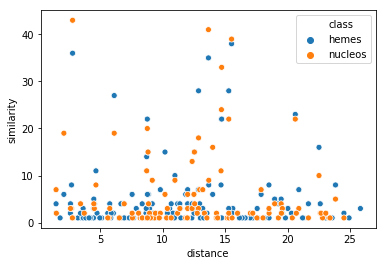

10


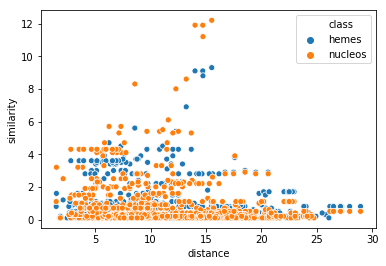

100


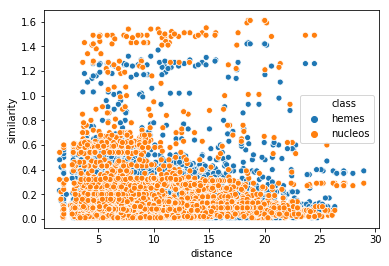

1000


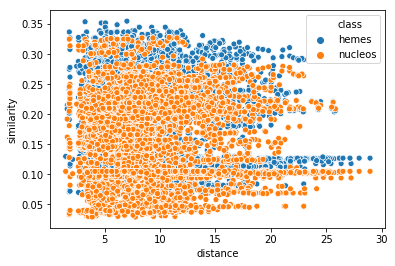

In [142]:
# Repeat for the counts
for k in [1,10,100,1000]:
# Select the k closest atoms (including itself)
    print(k)
#     k = 100
    k_nearest_atoms = closest[:, 0:k]

    # Get the corresponding value of heme_means, average.
    # TODO MAKE THIS A WEIGHTED AVERAGE
    averaged_heme_counts = [np.mean([heme_counts[x] for x in row]) for row in k_nearest_atoms]
    averaged_nucleo_counts = [np.mean([nucleo_counts[x] for x in row]) for row in k_nearest_atoms]

    # Get the correlations
    hemes = [[x,y, "hemes"] for x,y in zip(distance_from_nearest_ligand_atom, averaged_heme_counts) if y != 0]
    nucleos = [[x,y, "nucleos"] for x,y in zip(distance_from_nearest_ligand_atom, averaged_nucleo_counts) if y != 0]
    df = pd.DataFrame(hemes+nucleos, columns=["distance", "similarity", "class"])

    g = sns.scatterplot(x="distance", y="similarity", hue="class", data=df)
    plt.show()

### Probably k= 10 makes the most physical sense. But lets add the spatial weighting first

In [29]:
def get_spatial_average(distance_matrix, score_vector, sigma=10):
    
    # argsort each row to get a list of which points are closest for each atom
    closest = np.argsort(distance_matrix, axis=1)
    
    k=10
    k_nearest_atoms = closest[:, 0:k]

    spatial_averages = []

    for i,row in enumerate(k_nearest_atoms):
        distance_between_atoms = distance_matrix[i][row]
        spatial_average = []
        weights = []
        for atom in row:
            distance = distance_matrix[i][atom]
            score = score_vector[atom]
            weight = np.exp(-distance/sigma)
            spatial_average.append(weight*score)
            weights.append(weight)
        spatial_average = np.sum(spatial_average)/np.sum(weights)
        spatial_averages.append(spatial_average)
        
    assert len(spatial_averages) == len(score_vector)
    return spatial_averages


In [30]:

path_to_xyz_file =  "./filtered/r10xi2sigma1/samples_filtered.xyz"
atom_reader = quippy.AtomsReader(path_to_xyz_file, format="xyz")
# Crude, but quick enough for now
protein = atom_reader[0]
positions = protein.arrays["positions"]

D = scipy.spatial.distance.squareform(scipy.spatial.distance.pdist(positions))

spatial_heme_means = get_spatial_average(D, heme_means)
spatial_nucleo_means = get_spatial_average(D, nucleo_means)
hemes = [[x,y, "hemes"] for x,y in zip(distance_from_nearest_ligand_atom, spatial_heme_means)]
nucleos = [[x,y, "nucleos"] for x,y in zip(distance_from_nearest_ligand_atom, spatial_nucleo_means)]
df = pd.DataFrame(hemes+nucleos, columns=["distance", "similarity", "class"])

g = sns.lmplot(x="distance", y="similarity", hue="class", data=df, scatter_kws={"alpha": 0.1})
plt.show()

IndexError: list index out of range

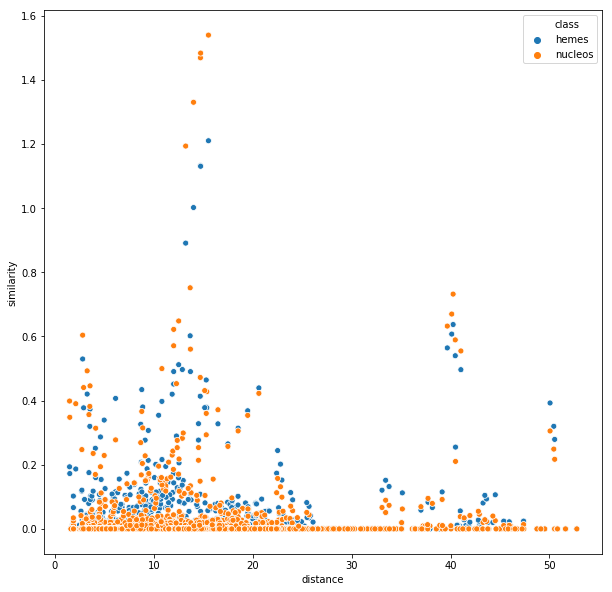

In [168]:

path_to_xyz_file =  "./filtered/r10xi2sigma1/samples_filtered.xyz"
atom_reader = quippy.AtomsReader(path_to_xyz_file, format="xyz")
# Crude, but quick enough for now
protein = atom_reader[0]
positions = protein.arrays["positions"]

D = scipy.spatial.distance.squareform(scipy.spatial.distance.pdist(positions))

spatial_heme_means = get_spatial_average(D, heme_counts)
spatial_nucleo_means = get_spatial_average(D, nucleo_counts)
hemes = [[x,y, "hemes"] for x,y in zip(distance_from_nearest_ligand_atom, spatial_heme_means)]
nucleos = [[x,y, "nucleos"] for x,y in zip(distance_from_nearest_ligand_atom, spatial_nucleo_means)]
df = pd.DataFrame(hemes+nucleos, columns=["distance", "similarity", "class"])

fig, ax = plt.subplots(figsize=(10,10))
g = sns.scatterplot(x="distance", y="similarity", hue="class", data=df)
plt.show()

In [169]:
protein.params["tag"]

'4n4oA_heme'

In [170]:
def setBFactorAndOutputPDBFile(atomObject, similarities, pdbPath):
    """
    Given an Atoms object and the similarities for each atom, set the b-factor for the Atoms as the similarities then
    output the Atoms as a PDB for PyMoL viz (which I'll need to do locally)
    """
    assert len(atomObject.arrays["positions"] == len(similarities))
    atomObject.arrays["bfactor"] = np.asarray(similarities)
    ase.io.write(pdbPath, atomObject, format="proteindatabank")
    

In [171]:
setBFactorAndOutputPDBFile(protein, spatial_heme_means, "4n4oA.pdb")

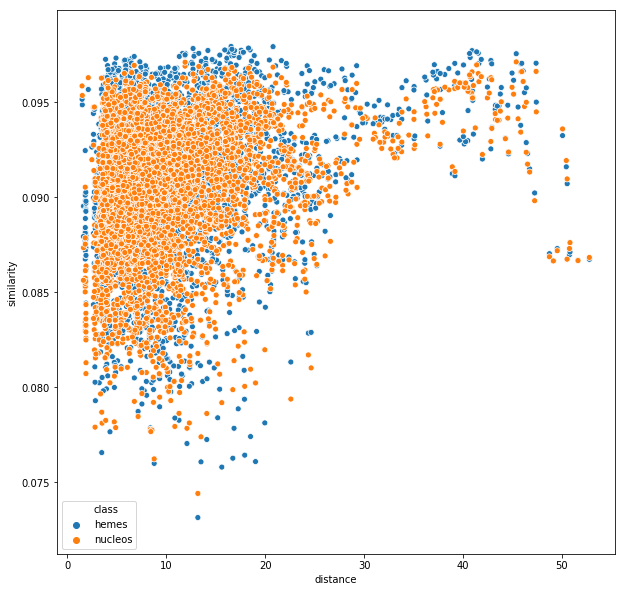

In [177]:

path_to_xyz_file =  "./filtered/r10xi2sigma1/samples_filtered.xyz"
atom_reader = quippy.AtomsReader(path_to_xyz_file, format="xyz")
# Crude, but quick enough for now
protein = atom_reader[0]
positions = protein.arrays["positions"]

D = scipy.spatial.distance.squareform(scipy.spatial.distance.pdist(positions))

spatial_heme_means = get_spatial_average(D, heme_means, sigma=20)
spatial_nucleo_means = get_spatial_average(D, nucleo_means)
hemes = [[x,y, "hemes"] for x,y in zip(distance_from_nearest_ligand_atom, spatial_heme_means)]
nucleos = [[x,y, "nucleos"] for x,y in zip(distance_from_nearest_ligand_atom, spatial_nucleo_means)]
df = pd.DataFrame(hemes+nucleos, columns=["distance", "similarity", "class"])

fig, ax = plt.subplots(figsize=(10,10))
g = sns.scatterplot(x="distance", y="similarity", hue="class", data=df)
plt.show()

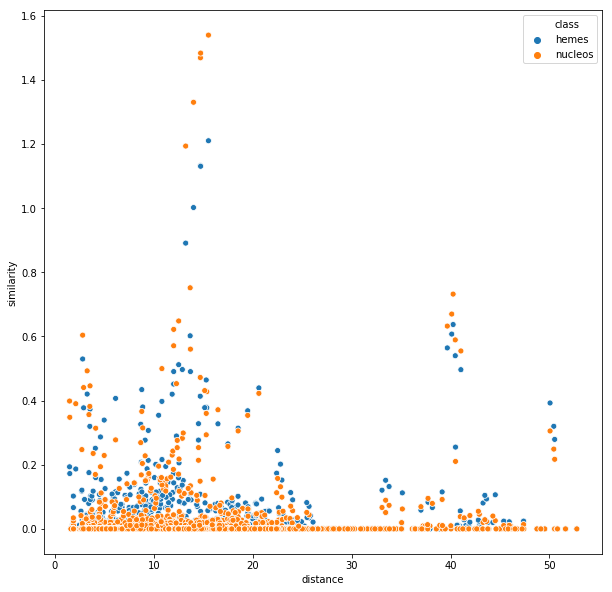

In [182]:
path_to_xyz_file =  "./filtered/r10xi2sigma1/samples_filtered.xyz"
atom_reader = quippy.AtomsReader(path_to_xyz_file, format="xyz")
protein = atom_reader[0]
positions = protein.arrays["positions"]

D = scipy.spatial.distance.squareform(scipy.spatial.distance.pdist(positions))

spatial_heme_counts = get_spatial_average(D, heme_counts, sigma=10)
spatial_nucleo_counts = get_spatial_average(D, nucleo_counts, sigma=10)
hemes = [[x,y, "hemes"] for x,y in zip(distance_from_nearest_ligand_atom, spatial_heme_counts)]
nucleos = [[x,y, "nucleos"] for x,y in zip(distance_from_nearest_ligand_atom, spatial_nucleo_counts)]
df = pd.DataFrame(hemes+nucleos, columns=["distance", "similarity", "class"])

fig, ax = plt.subplots(figsize=(10,10))
g = sns.scatterplot(x="distance", y="similarity", hue="class", data=df)
plt.show()

## Putting it all together


4n4oA_heme


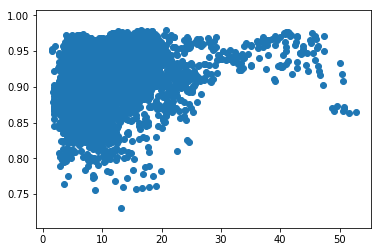

1x9fB_heme


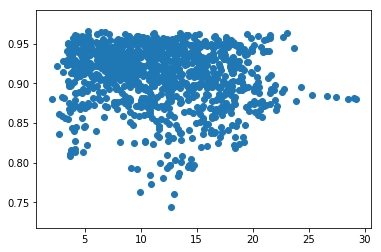

2bz9A_heme


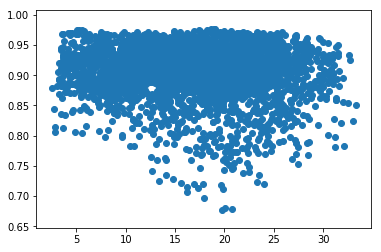

1cxyA_heme


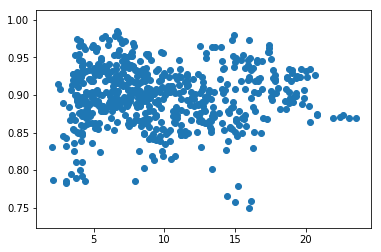

1hlmA_heme


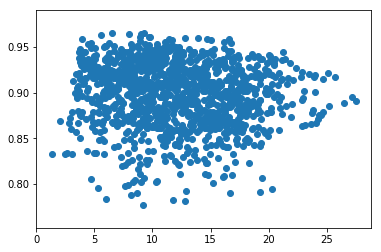

1etpA_heme


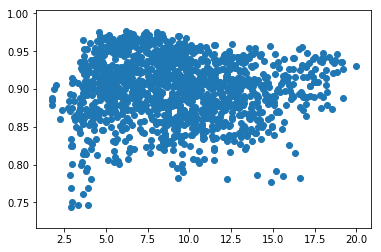

4gu7A_heme


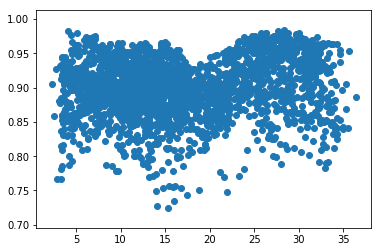

3rwlA_heme


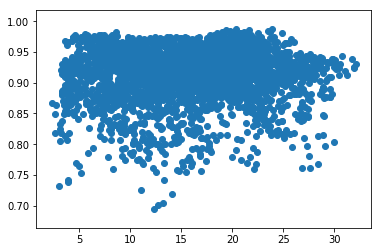

2czsA_heme


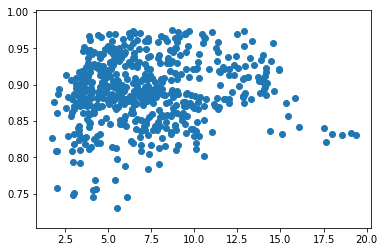

4jouA_heme


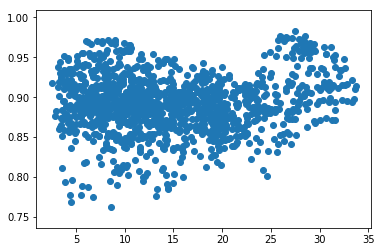

4xe3A_heme


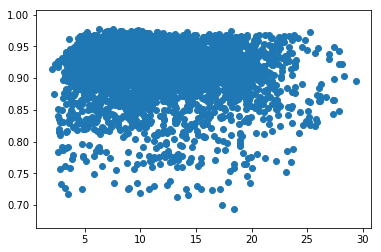

1ccrA_heme


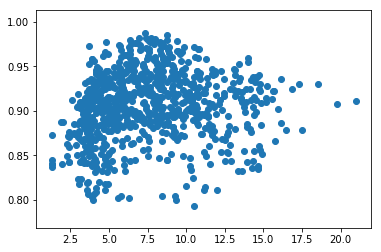

1ithA_heme


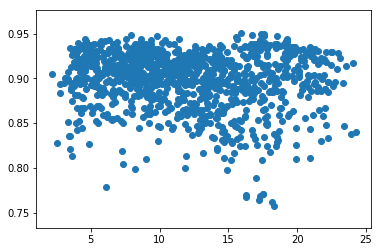

1gdiA_heme


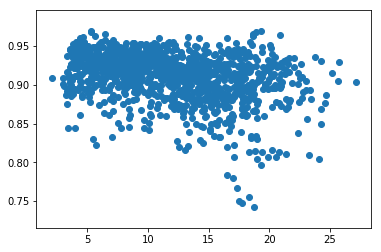

2flqB_heme


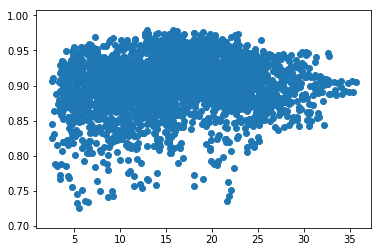

2d09A_heme


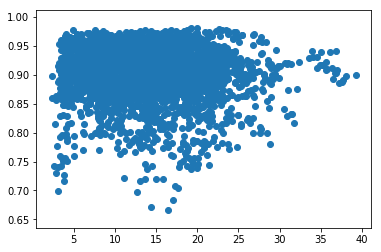

1cxaA_heme


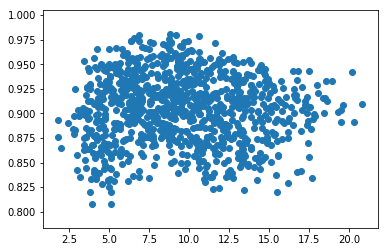

1gksA_heme


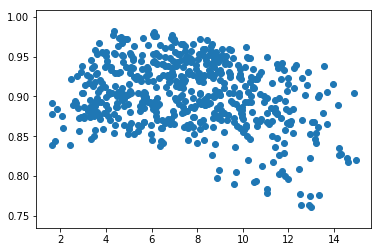

2v7iA_heme


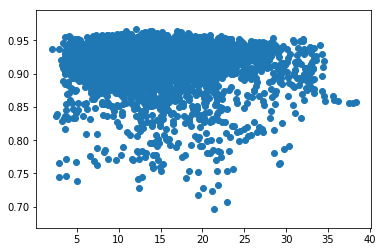

1ix3A_heme


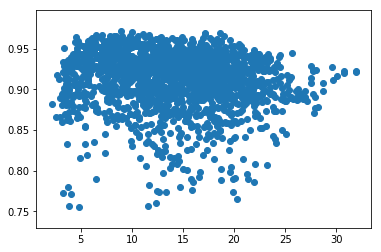

4n4jA_heme


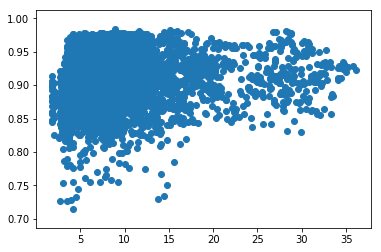

1ecaA_heme


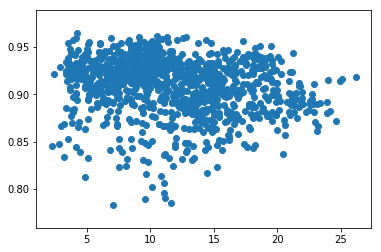

2r1hB_heme


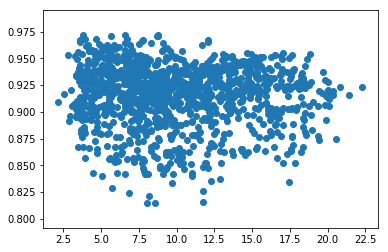

1f1cA_heme


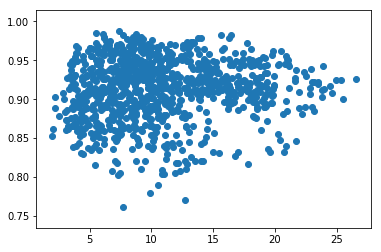

3tf8B_heme


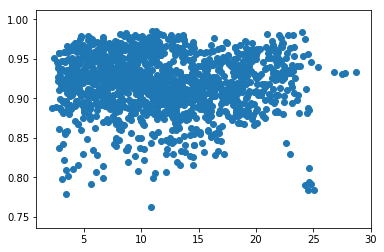

1jebA_heme


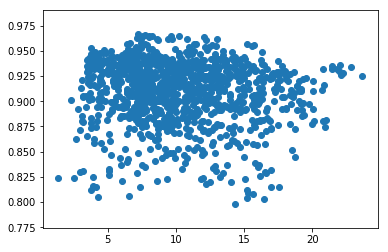

1co6A_heme


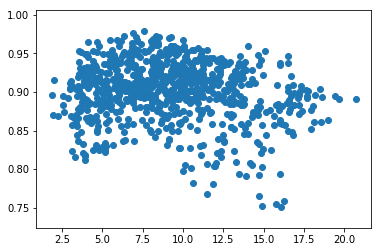

1ashA_heme


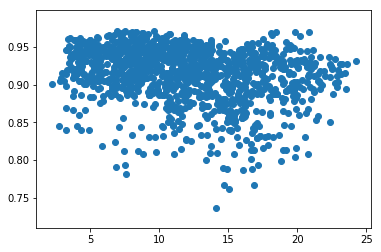

1it2A_heme


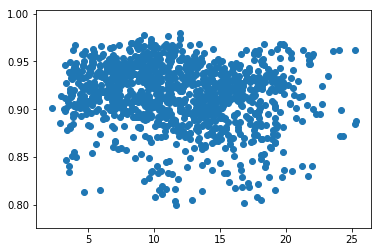

4i91A_heme


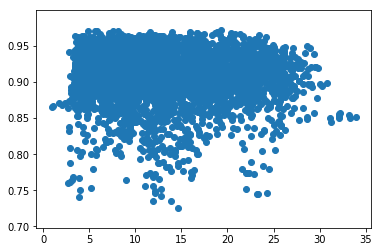

4oqrA_heme


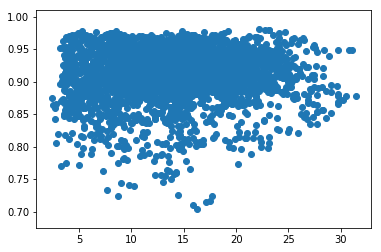

1ebtA_heme


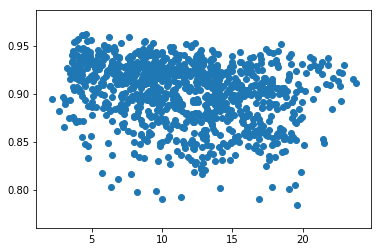

4uiiA_heme


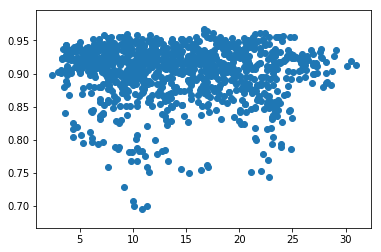

3nn2B_heme


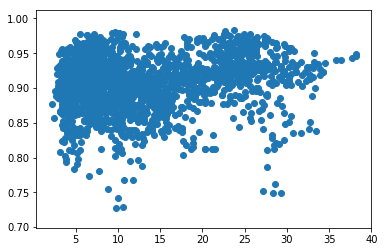

1schB_heme


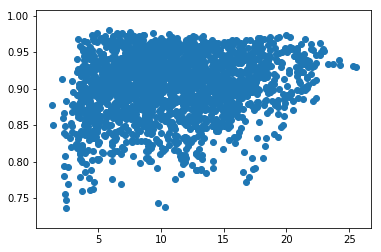

3b42A_heme


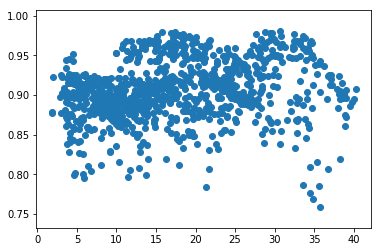

1prhA_heme


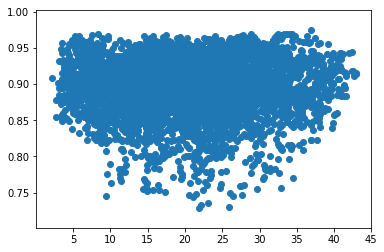

1yhuC_heme


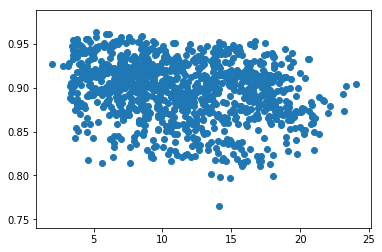

1hroA_heme


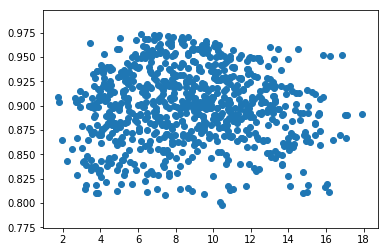

1yeaA_heme


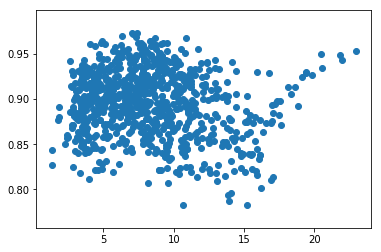

3qjtA_heme


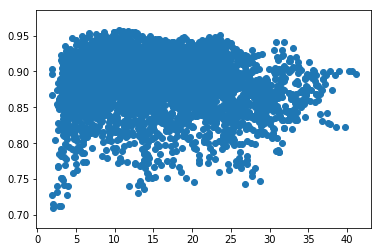

1dvhA_heme


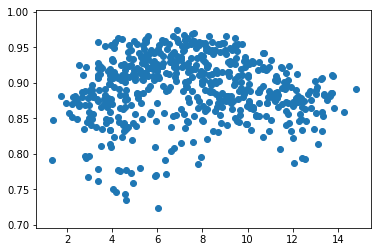

1s56B_heme


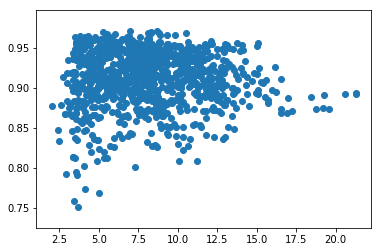

3zhwA_heme


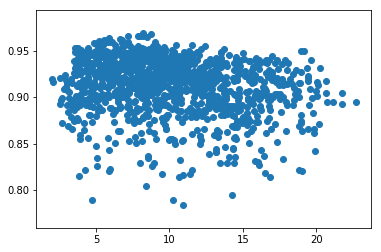

2r79A_heme


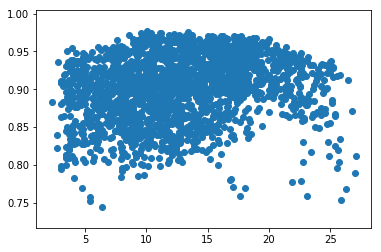

1ew6A_heme


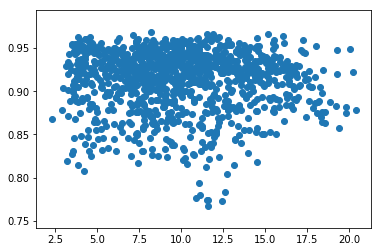

5fygA_heme


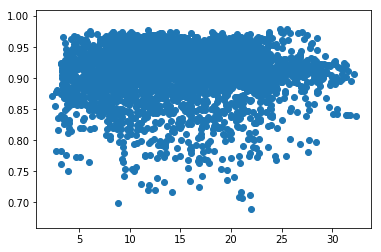

1hbgA_heme


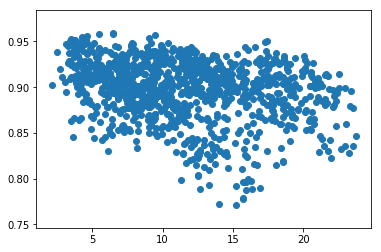

3bxuB_heme


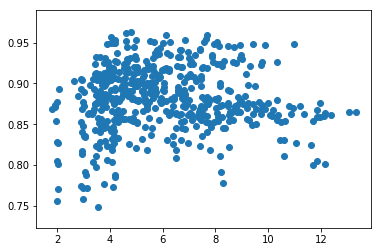

3czhA_heme


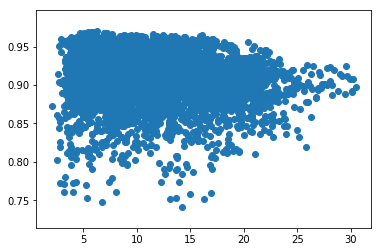

2vzwB_heme


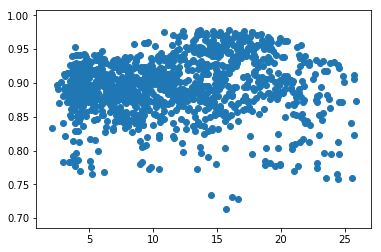

1cpqA_heme


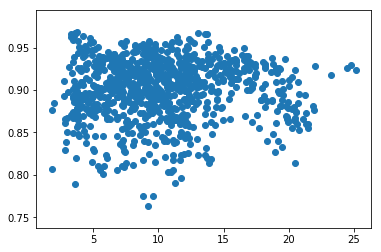

2wh8B_heme


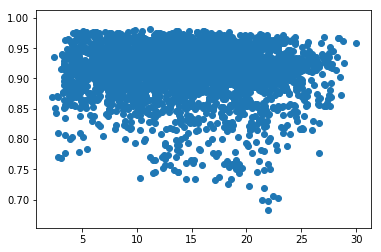

1fj0A_heme


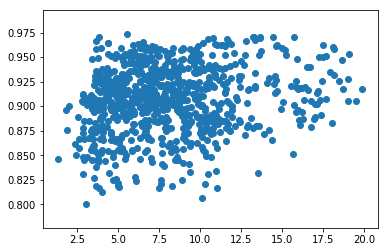

1bvbA_heme


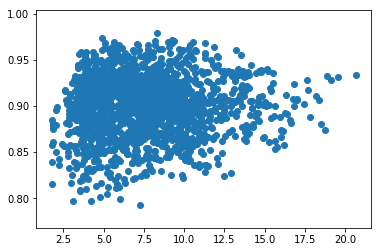

1ls9A_heme


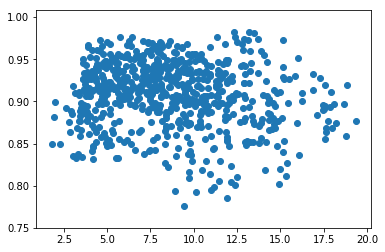

1fs7A_heme


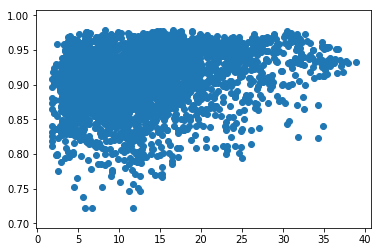

1gcvA_heme


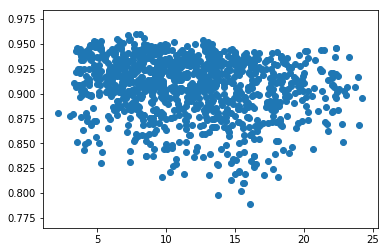

3vliA_heme


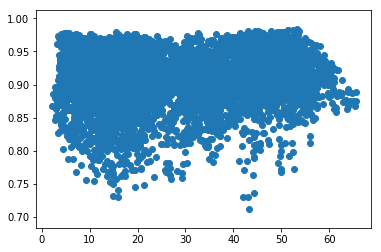

1m7sA_heme


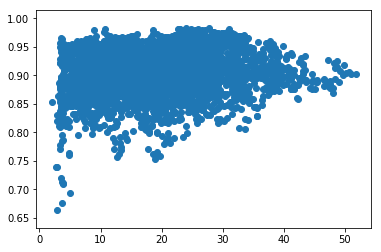

3a4hA_heme


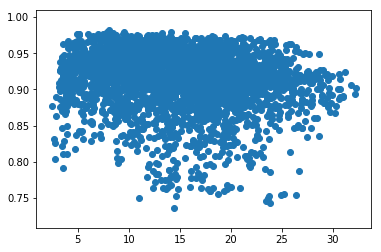

1jjuA_heme


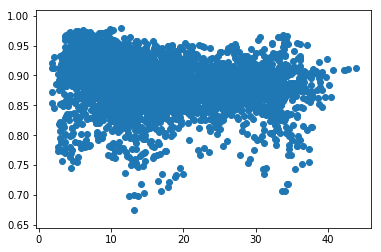

5cx7E_heme


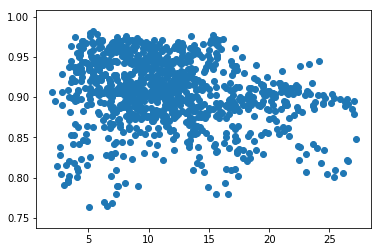

1xq5A_heme


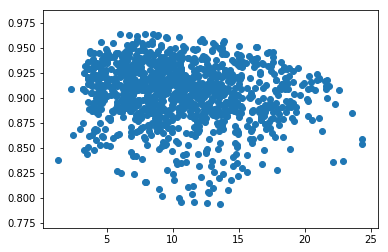

2olpA_heme


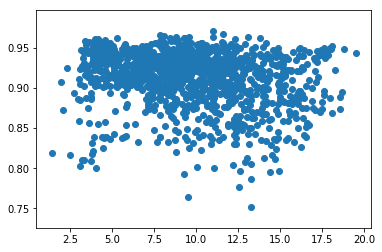

3mk7A_heme


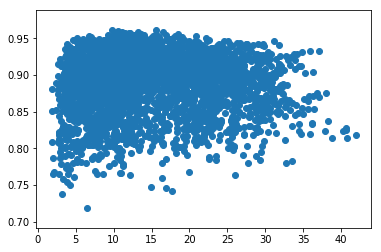

1dvvA_heme


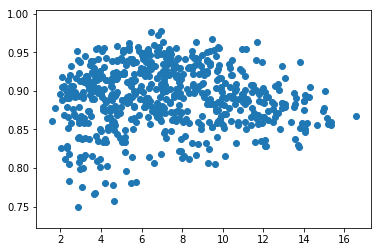

2d2mB_heme


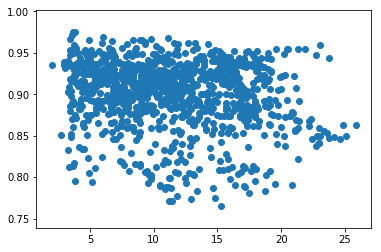

1hbhA_heme


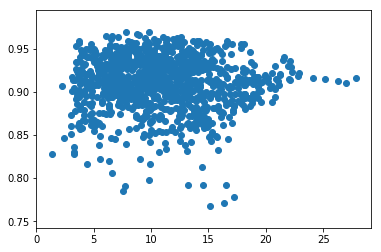

2j0pA_heme


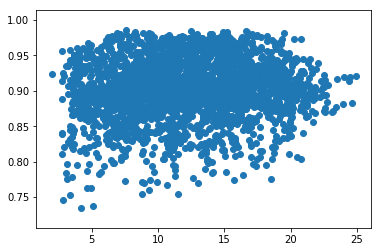

4egnB_heme


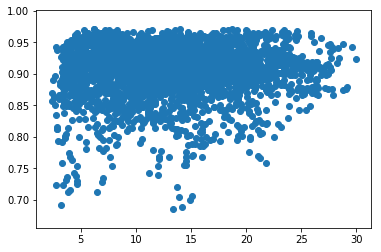

3gw9A_heme


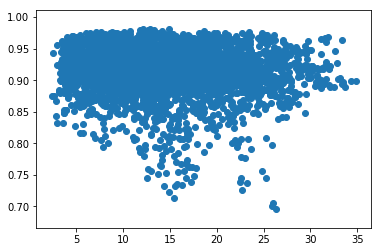

5lthA_heme


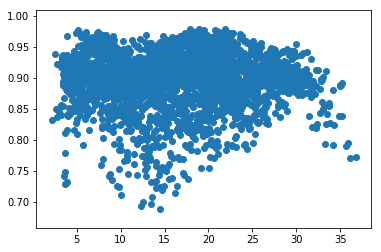

1ntfA_heme


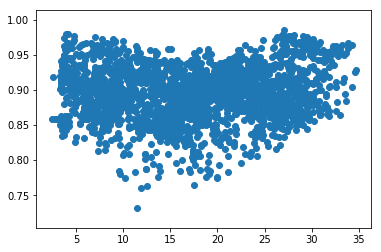

2zooA_heme


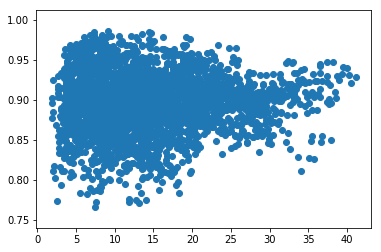

3hyuA_heme


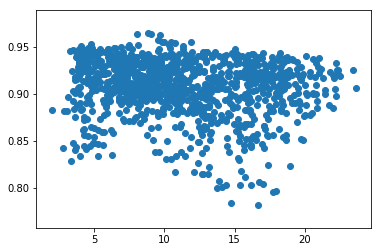

1os6A_heme


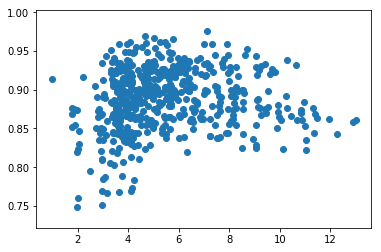

1x9fA_heme


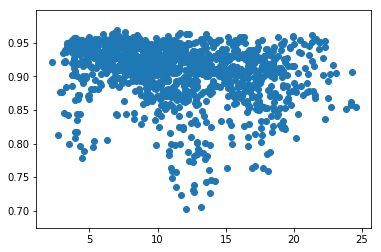

2c2cA_heme


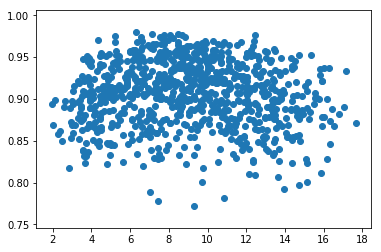

3pt7B_heme


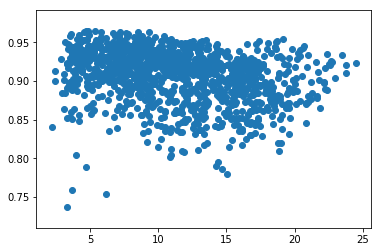

4uiqA_heme


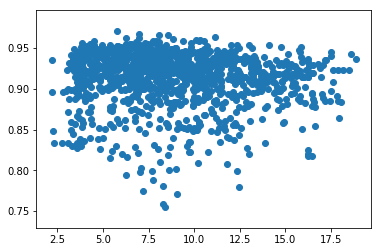

1hbhB_heme


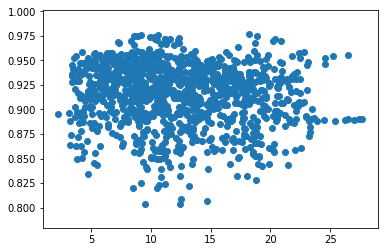

1j77A_heme


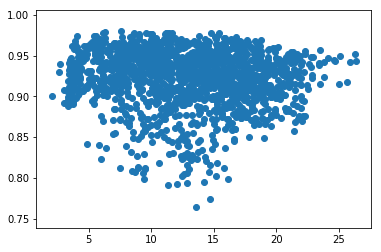

4nk2A_heme


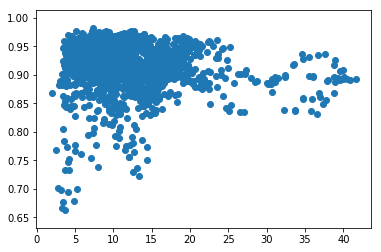

4b8nB_heme


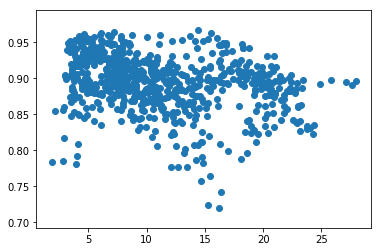

4ejgE_heme


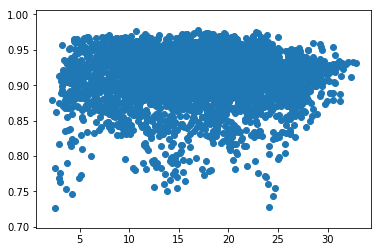

5de0C_heme


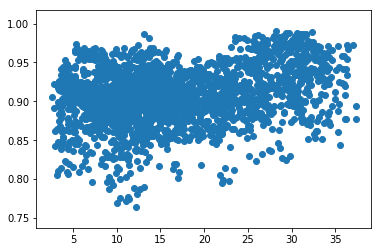

1oagA_heme


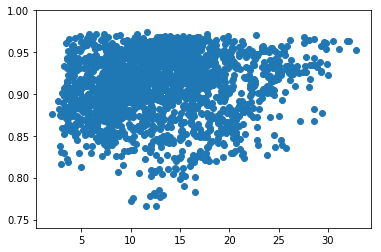

2d2mA_heme


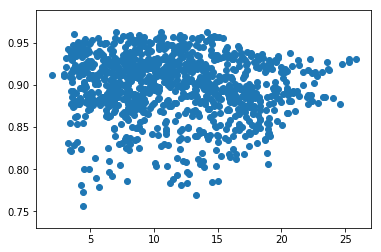

5j1sA_nucleo


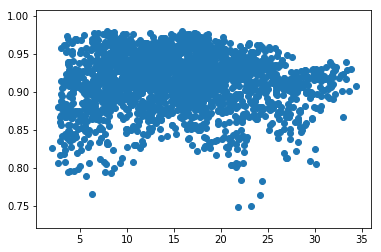

1uf9C_nucleo


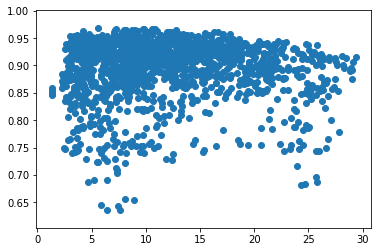

2xtiB_nucleo


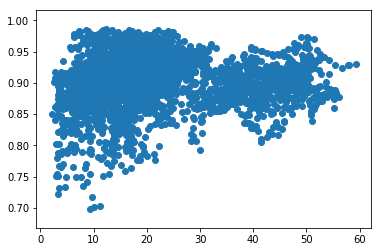

5mcpH_nucleo


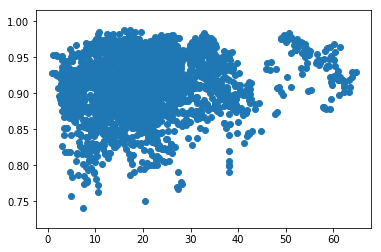

4kr7A_nucleo


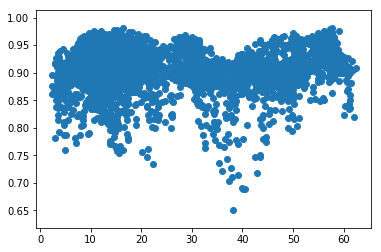

4h2uB_nucleo


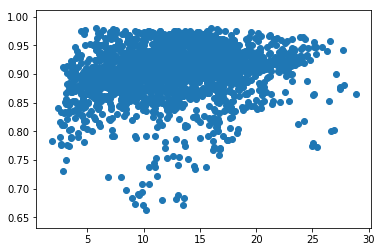

1xexA_nucleo


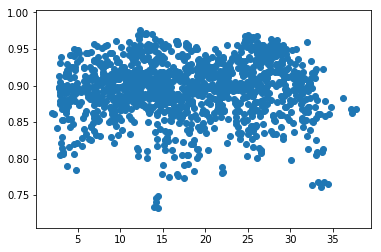

3w1gA_nucleo


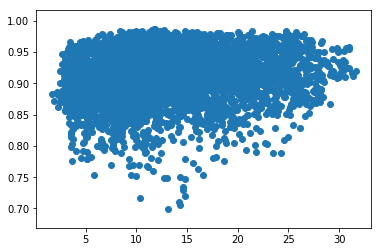

2xszC_nucleo


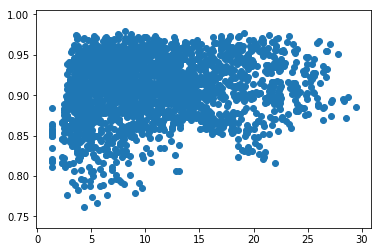

1xmiD_nucleo


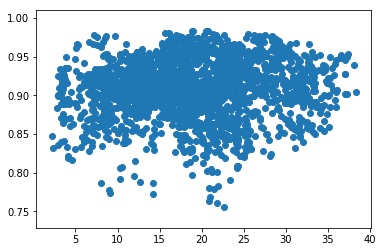

5tgcD_nucleo


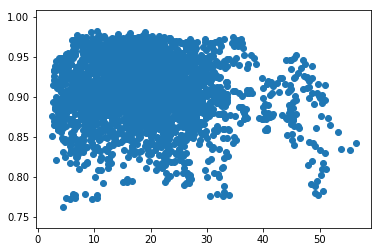

3qx9C_nucleo


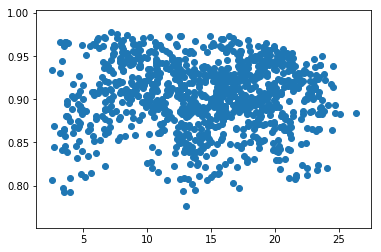

1esqC_nucleo


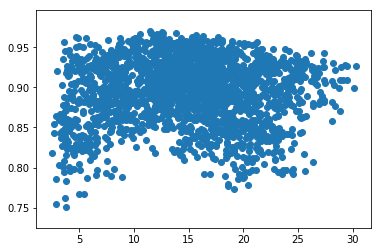

3amtA_nucleo


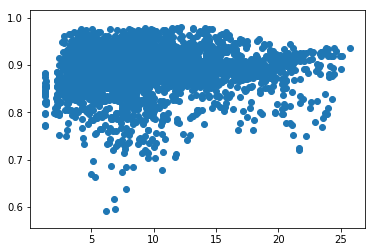

4fvqA_nucleo


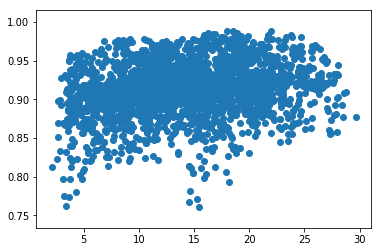

4g5yA_nucleo


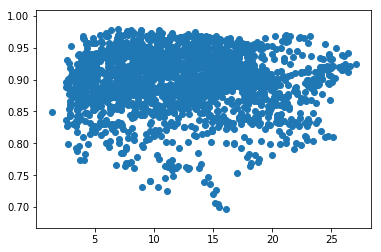

5uj7A_nucleo


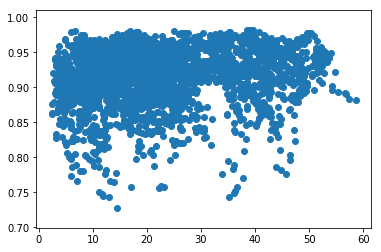

1nyrA_nucleo


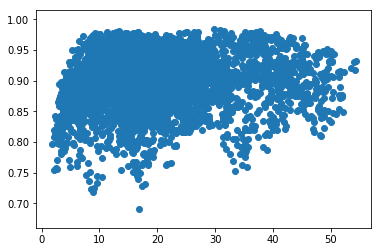

3lgxC_nucleo


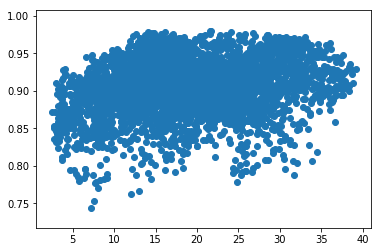

2yaaA_nucleo


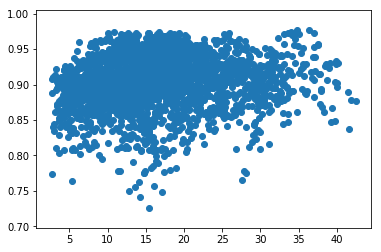

5vqaA_nucleo


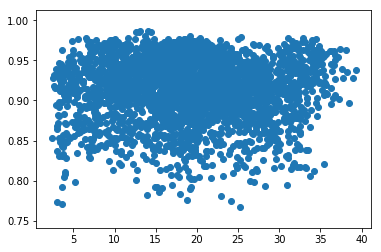

5d9hB_nucleo


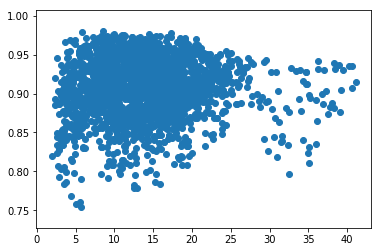

4itmA_nucleo


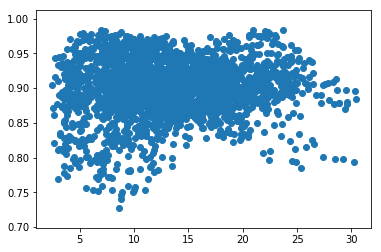

2biyA_nucleo


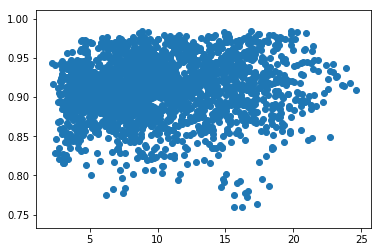

1mjhB_nucleo


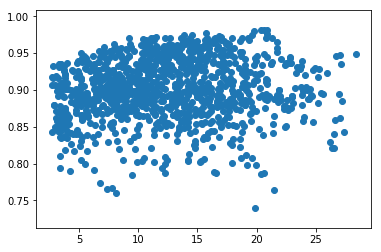

3wbzE_nucleo


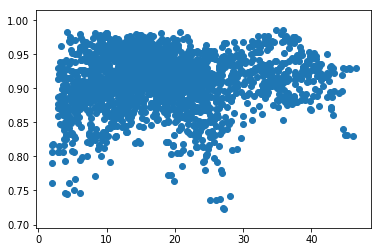

4nh0B_nucleo


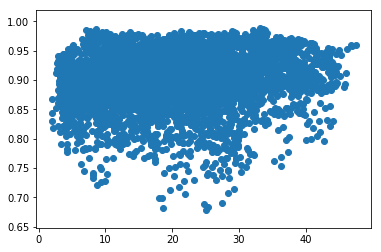

4mb2B_nucleo


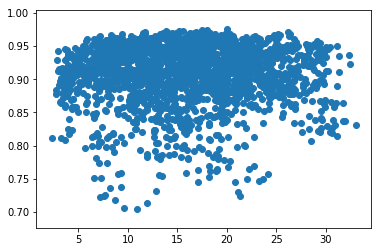

1gn8A_nucleo


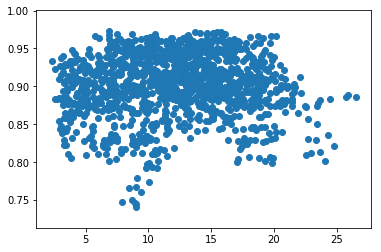

5burA_nucleo


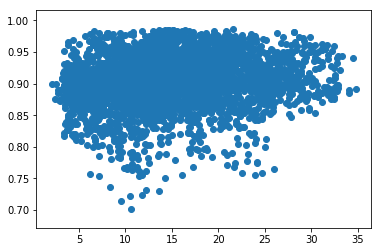

4ndoB_nucleo


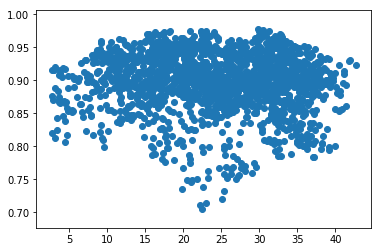

3meyB_nucleo


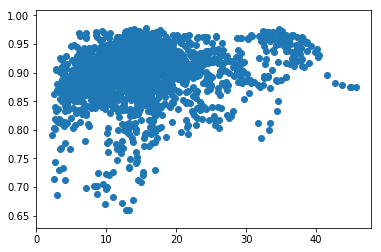

5d6jA_nucleo


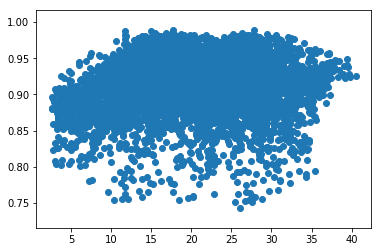

1ji0A_nucleo


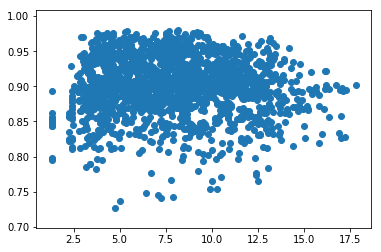

4f6tA_nucleo


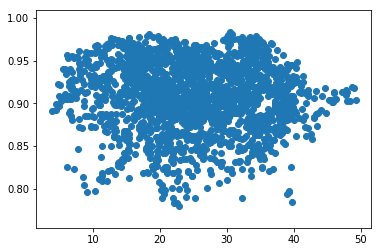

2rsfA_nucleo


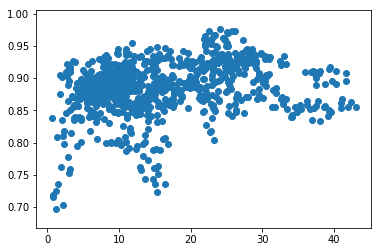

2r9vA_nucleo


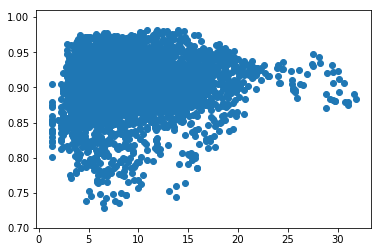

1ytmA_nucleo


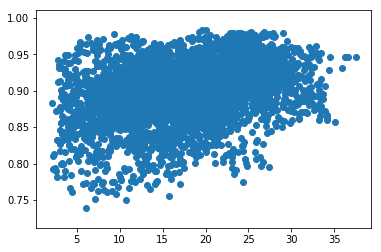

1tc0B_nucleo


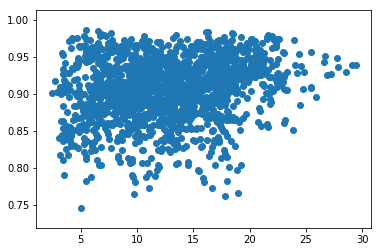

5v2lA_nucleo


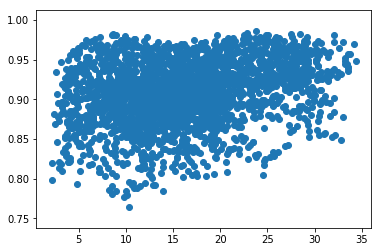

3epsA_nucleo


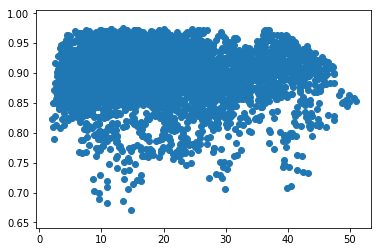

4zqxA_nucleo


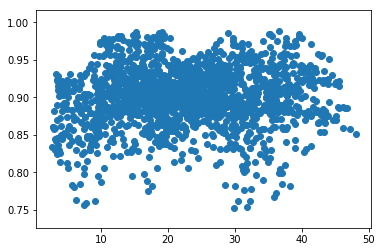

3innD_nucleo


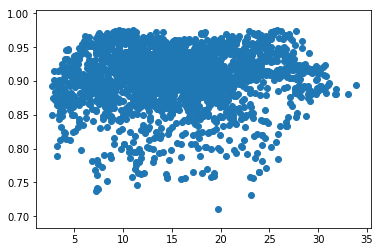

4dxlA_nucleo


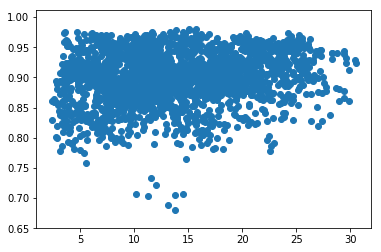

1y56A_nucleo


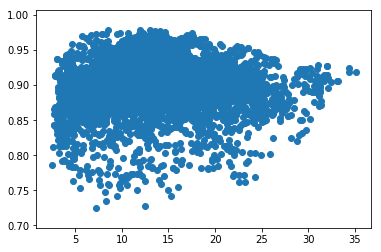

2cjaB_nucleo


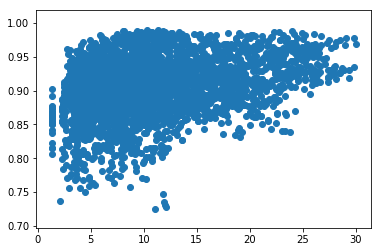

2jjxB_nucleo


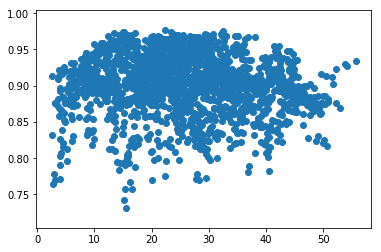

5dn6F_nucleo


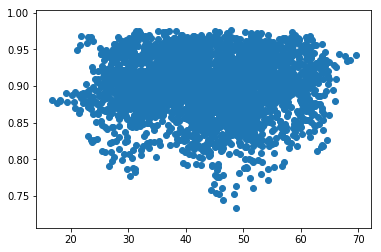

4fg9B_nucleo


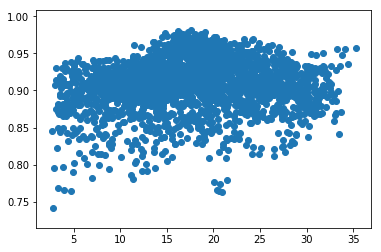

5l9nA_nucleo


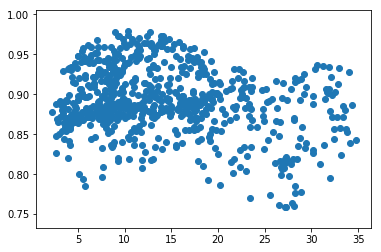

5f1cB_nucleo


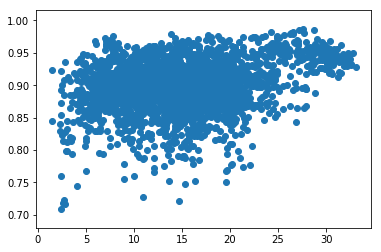

5m7nA_nucleo


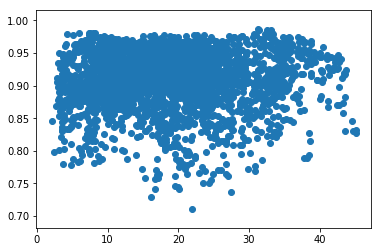

2j3mB_nucleo


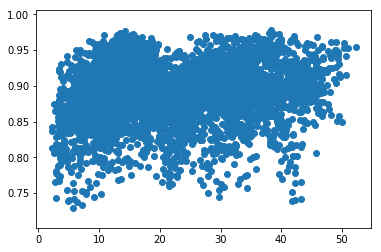

5mb9B_nucleo


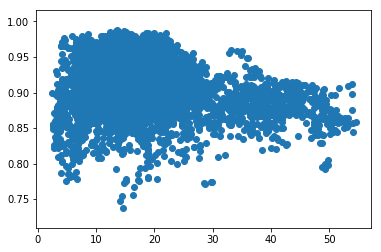

3umoA_nucleo


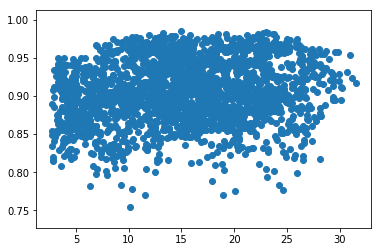

3ie7A_nucleo


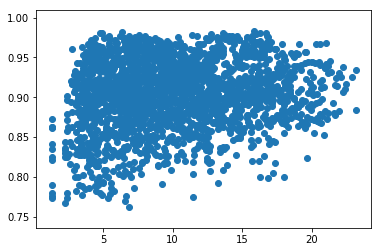

4mwhA_nucleo


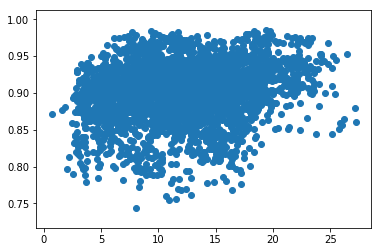

3hgmA_nucleo


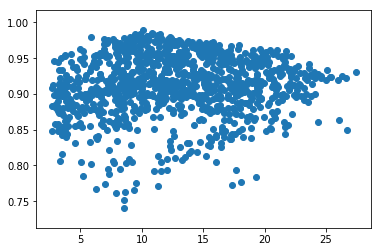

4gxqB_nucleo


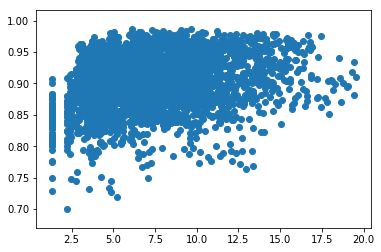

5i9eA_nucleo


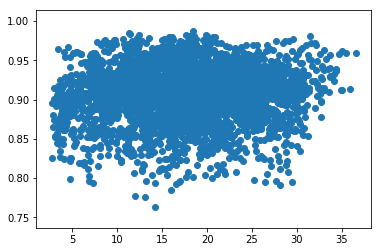

1zfnA_nucleo


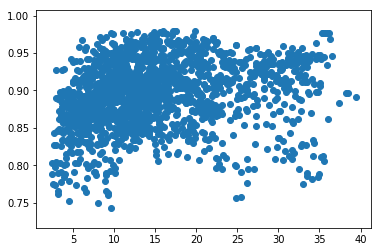

5i0nA_nucleo


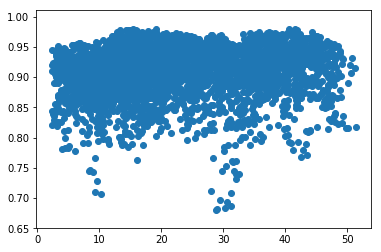

1yfrA_nucleo


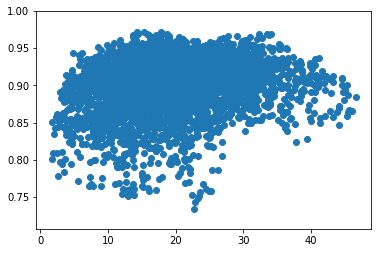

4xruB_nucleo


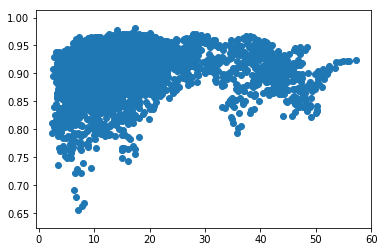

2kmxA_nucleo


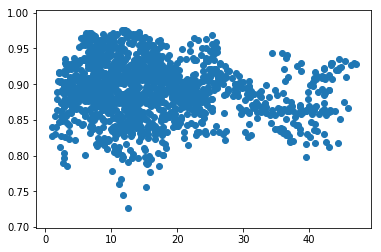

2ixfB_nucleo


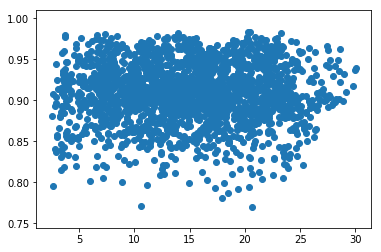

4wc0B_nucleo


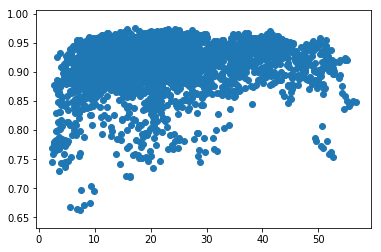

3sl2A_nucleo


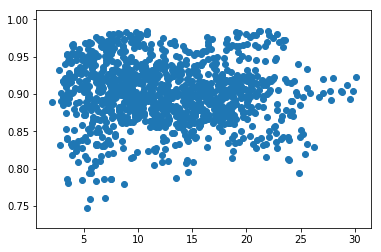

2pc9B_nucleo


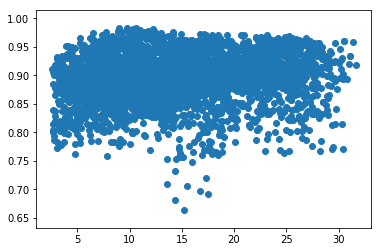

4v02A_nucleo


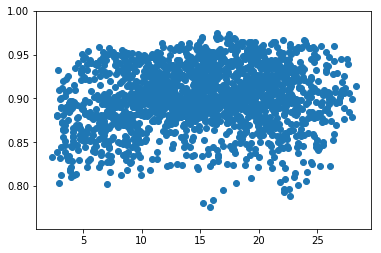

4xhoA_nucleo


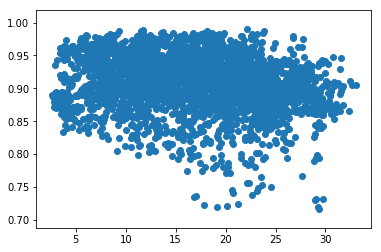

4x2dA_nucleo


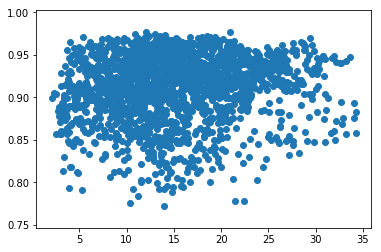

1ii0B_nucleo


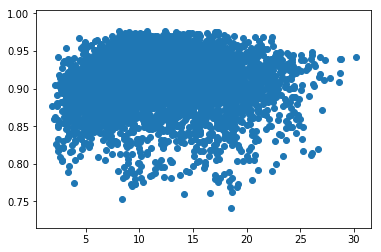

1ko5A_nucleo


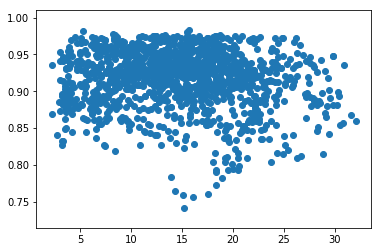

5uj7C_nucleo


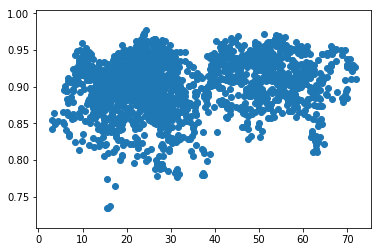

1zaoA_nucleo


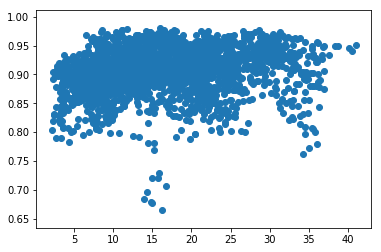

In [33]:
path_to_hdf5_file = "./filtered/r10xi2sigma1/samples_filtered.xyz.hdf5"
path_to_xyz_file = "./filtered/r10xi2sigma1/samples_filtered.xyz"
dataFile = h5py.File(path_to_hdf5_file, "r")
labels = dataFile["labels"]["label_mat"].value
atom_reader = quippy.AtomsReader(path_to_xyz_file, format="xyz")

for index, label in enumerate(labels):
    label = label[1]
    output_dict = generateAverageAndCounterSimilarityAnyHetATM("./filtered/r10xi2sigma1/basematrices",
                                                               path_to_xyz_file,
                                                               labels,
                                                               index)

    heme_means = output_dict["heme_means"]
    nucleo_means = output_dict["nucleo_means"]
    heme_counts = output_dict["heme_counts"]
    nucleo_counts = output_dict["nucleo_counts"]
    distance_from_nearest_ligand_atom = output_dict["distance_from_nearest_ligand_atom"]
    distance_from_centroid = output_dict["distance_from_centroid"]
    
    # Get the spatial average of all the above quantities
    # Crude, but quick enough for now
    for temp_protein in atom_reader:
        if temp_protein.params["tag"] == label:
            protein = temp_protein
            break
    positions = protein.arrays["positions"]

    D = scipy.spatial.distance.squareform(scipy.spatial.distance.pdist(positions))

    spatial_average_heme_counts = get_spatial_average(D, heme_counts, sigma=10)
    spatial_average_nucleo_counts = get_spatial_average(D, nucleo_counts, sigma=10)
    spatial_average_heme_means = get_spatial_average(D, heme_means, sigma=10)
    spatial_average_nucleo_means = get_spatial_average(D, nucleo_means, sigma=10)
    
    plt.scatter(distance_from_nearest_ligand_atom,spatial_average_heme_means)
    plt.show()
    headers = ["heme_means_averaged", "nucleo_means_averaged", "heme_counts_averaged", "nucleo_counts_averaged",
              "nearest_distance", "centroid_distance"]
    output_data = zip(spatial_average_heme_means, spatial_average_nucleo_means, spatial_average_heme_counts, spatial_average_nucleo_counts,
                       distance_from_nearest_ligand_atom, distance_from_centroid)

    if not os.path.exists("outputs"):
        os.mkdir("outputs")
    with open("outputs/{}.dat".format(label), "w") as flines:
        flines.write(" ".join(headers) + "\n")
        for line in output_data:
            line = [round(x,4) for x in line]
            flines.write(" ".join(map(str,line)) + "\n")


In [38]:
!mv outputs outputs_filtered_with_spatial_averaging/

In [39]:
!tar -zcvf outputs_filtered_with_spatial_averaging_r10.tar.gz outputs_filtered_with_spatial_averaging

outputs_filtered_with_spatial_averaging/
outputs_filtered_with_spatial_averaging/3lgxC_nucleo.dat
outputs_filtered_with_spatial_averaging/1ecaA_heme.dat
outputs_filtered_with_spatial_averaging/2vzwB_heme.dat
outputs_filtered_with_spatial_averaging/4wc0B_nucleo.dat
outputs_filtered_with_spatial_averaging/4ndoB_nucleo.dat
outputs_filtered_with_spatial_averaging/4x2dA_nucleo.dat
outputs_filtered_with_spatial_averaging/1prhA_heme.dat
outputs_filtered_with_spatial_averaging/5v2lA_nucleo.dat
outputs_filtered_with_spatial_averaging/2yaaA_nucleo.dat
outputs_filtered_with_spatial_averaging/1ko5A_nucleo.dat
outputs_filtered_with_spatial_averaging/1yhuC_heme.dat
outputs_filtered_with_spatial_averaging/2r9vA_nucleo.dat
outputs_filtered_with_spatial_averaging/1y56A_nucleo.dat
outputs_filtered_with_spatial_averaging/1ashA_heme.dat
outputs_filtered_with_spatial_averaging/1ebtA_heme.dat
outputs_filtered_with_spatial_averaging/4b8nB_heme.dat
outputs_filtered_with_spatial_averaging/3wbzE_nucleo.dat
outp

outputs_filtered_with_spatial_averaging/4mb2B_nucleo.dat
outputs_filtered_with_spatial_averaging/1j77A_heme.dat
outputs_filtered_with_spatial_averaging/4xe3A_heme.dat
outputs_filtered_with_spatial_averaging/4fg9B_nucleo.dat
outputs_filtered_with_spatial_averaging/5d9hB_nucleo.dat
outputs_filtered_with_spatial_averaging/1jjuA_heme.dat
outputs_filtered_with_spatial_averaging/1fj0A_heme.dat
outputs_filtered_with_spatial_averaging/1ix3A_heme.dat
outputs_filtered_with_spatial_averaging/2d2mB_heme.dat
outputs_filtered_with_spatial_averaging/2zooA_heme.dat
outputs_filtered_with_spatial_averaging/4h2uB_nucleo.dat
outputs_filtered_with_spatial_averaging/3tf8B_heme.dat
outputs_filtered_with_spatial_averaging/5cx7E_heme.dat
outputs_filtered_with_spatial_averaging/3a4hA_heme.dat
outputs_filtered_with_spatial_averaging/3rwlA_heme.dat
